In [7]:
import numpy as np
from astropy.io import fits
from astropy import units
from astropy.table import Table, join
import astropy.coordinates as coord
from scipy.interpolate import interp1d
from scipy.optimize import fmin
from tqdm import tqdm
from scipy.stats import multivariate_normal, norm
import tensorflow as tf
import corner
import matplotlib.pyplot as plt
import os
import pickle
import define_rgbtgassample
import pickle
import statsmodels.api as sm
import apogee.tools.read as apread
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
lowess= sm.nonparametric.lowess


params = {'axes.labelsize': 14, 'xtick.labelsize': 12, 'ytick.labelsize': 12, 'text.usetex': True, 'lines.linewidth': 1,
          'axes.titlesize': 14, 'font.family': 'serif'}
plt.rcParams.update(params)

columnwidth = 240./72.27
textwidth = 504.0/72.27

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### Load Data 
Need to cross match APOKASC DR2 with Victor's ages, and load APOGEE DR14 (cutting 'bad' flags - we dont remove 'warning' flags at the moment, to boost sample size, manually remove missing abundances later)

In [2]:
apodat = define_rgbtgassample.get_rgbtgassample(cuts = True, add_dist=True, notgas=True, distkey='BPG_meandist', disterrkey='BPG_diststd')

# Read in APOKASC
path = '/gal/astjmack/apogee/catalogues/APOKASC_cat_v4.2.3.fits'
apokasc = fits.open(path)
data = apokasc[1].data

#load victor's table
table = np.genfromtxt('/gal/astjmack/apogee/catalogues/APOKASC_v4.2.4_161017_Serenelli_eta00.ascii', dtype=None, names=True)
dt = data.dtype
dt = dt.descr # this is now a modifiable list, can't modify numpy.dtype
# change the type of the first col:
dt[0] = (dt[0][0], 'int64')
dt = np.dtype(dt)
# data = numpy.array(data, dtype=dt) # option 1
data = data.astype(dt)
APOKASC_tab = Table(data=data)
ages_tab = Table(data=table)
#join victor with APOKASC
ages_tab.rename_column('starid', 'KEPLER_ID')
tab = join(APOKASC_tab, ages_tab, keys='KEPLER_ID', uniq_col_name='{col_name}{table_name}', table_names=['','2'])
dat = tab.as_array()

### Polynomial Feature Regression (a la Martig)

In [324]:
#mask out -9999. values (and remove Fe/H below -0.6, and NaN ages)
good_data = (dat['FE_H'] != -9999.) & (dat['C_FE'] != -9999.) & (dat['N_FE'] != -9999.) & (dat['FE_H'] > -0.6) & (dat['MG_FE'] != -9999.) & np.isfinite(dat['age'])
dpoints = np.dstack([dat['FE_H'][good_data], dat['C_FE'][good_data], dat['N_FE'][good_data], dat['MG_FE'][good_data], np.log10(10**dat['C_FE'][good_data]+10**dat['N_FE'][good_data]), dat['LOGG_COR'][good_data], dat['TEFF_COR'][good_data]])[0]

print(len(dpoints))

# fit an order-3 polynomial feature regression
y = dat['age'][good_data]
x = dpoints

poly = PolynomialFeatures(degree=2)
X_ = poly.fit_transform(x)
predict_ = poly.fit_transform(dpoints)
clf = LinearRegression()
clf.fit(X_, y)

dout = clf.predict(predict_)

#Make the corrective lowess fit
fit = lowess(np.log10(dout*1e6),np.log10(dat['age'][good_data]*1e6))
xs = np.linspace(-8.,13.,100)
xsinterpolate = interp1d(xs,xs)
fys = fit[:,0]-xsinterpolate(fit[:,1])
interp = interp1d(fit[:,1], fys, bounds_error=False)
corr_age = np.log10(dout*1e6)+(interp(np.log10(dout*1e6)))
corr_age = corr_age

# generate ages for DR14 from the model
dr14points = np.dstack([apodat['FE_H'], apodat['C_FE'], apodat['N_FE'], apodat['MG_FE'], np.log10(10**apodat['C_FE']+10**apodat['N_FE']), apodat['LOGG'], apodat['TEFF']])[0]
cleanup = np.all(np.isfinite(dr14points), axis=1) & np.all(dr14points != -9999., axis=1) & (apodat['FE_H'] > -0.6)
dr14points = dr14points[cleanup]
dr14predict_ = poly.fit_transform(dr14points)
dr14out = clf.predict(dr14predict_)

#apply correction to the DR14 ages
ages_corr = (10**(np.log10(dr14out*1e6)+(interp(np.log10(dr14out*1e6)))))/1e9

# save it somewhere
arr = np.recarray(len(ages_corr), dtype=[('APOGEE_ID', '<U20'), ('Age', np.float32)])
arr['APOGEE_ID'] = apodat['APOGEE_ID'][cleanup]
arr['Age'] = ages_corr
with open('../sav/corrected_ages_dr14.npy', 'wb') as f:
    np.save(f, arr)

5800
/home/astjmack/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in power

/home/astjmack/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log10



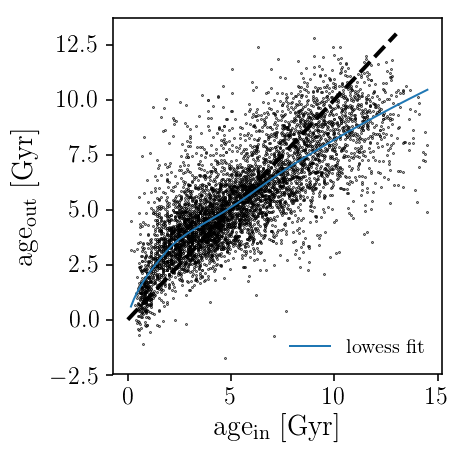

In [326]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)


plt.scatter(y/1e3, dout/1e3, s=0.1, c='Black', rasterized=True)
plt.plot([0.,13.],[0.,13.], c='Black', linestyle='dashed', lw=2.)
xs = np.linspace(1.,13.,100)
xs = np.log10(xs*1e9)
plt.plot((10**fit[:,0])/1e9, 10**(fit[:,1])/1e9, label=r'$\mathrm{lowess\ fit}$')

plt.xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
plt.ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
fig.tight_layout()
plt.legend(frameon=False)
plt.savefig('../plots/polynomial_agein_ageout.pdf', format='pdf', dpi=400)
plt.savefig('../plots/polynomial_agein_ageout.png', format='png', dpi=400)



Significant offset between the input age and the model age at ages $> 8$ Gyr. This can be fitted out, but leaves a large scatter! - is this offset telling us something about stellar physics?

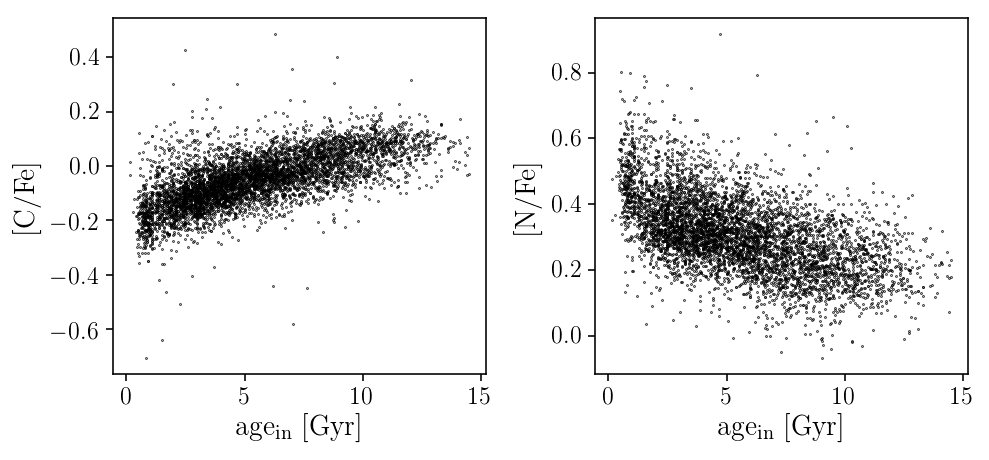

In [10]:


fig, ax = plt.subplots(1,2)
fig.set_size_inches(textwidth,columnwidth)

ax[0].scatter(y/1e3, dpoints[:,1], s=0.1, c='Black', rasterized=True)

ax[0].set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax[0].set_ylabel(r'$\mathrm{[C/Fe]}$')

ax[1].scatter(y/1e3, dpoints[:,2], s=0.1, c='Black', rasterized=True)

ax[1].set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax[1].set_ylabel(r'$\mathrm{[N/Fe]}$')
fig.tight_layout()
plt.savefig('../plots/agein_CN.pdf', format='pdf', dpi=400)
plt.savefig('../plots/agein_CN.png', format='png', dpi=400)




Text(0,0.5,'$\\mathrm{[(C+N)/Fe]}$')

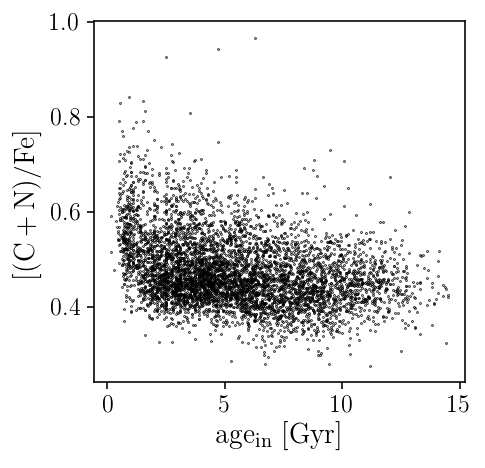

In [12]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)

plt.scatter(y/1e3, dpoints[:,4], s=0.1, c='Black', rasterized=True)
plt.xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
plt.ylabel(r'$\mathrm{[(C+N)/Fe]}$')



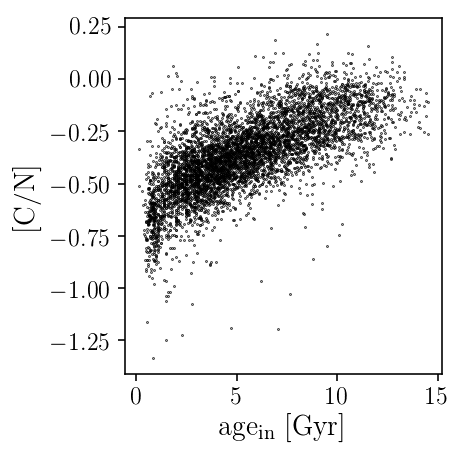

In [17]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)

plt.scatter(y/1e3, dpoints[:,1]-dpoints[:,2], s=0.1, c='Black', rasterized=True)

plt.xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
plt.ylabel(r'$\mathrm{[C/N]}$')
fig.tight_layout()
plt.savefig('../plots/agein_C_N.pdf', format='pdf', dpi=400)
plt.savefig('../plots/agein_C_N.png', format='png', dpi=400)



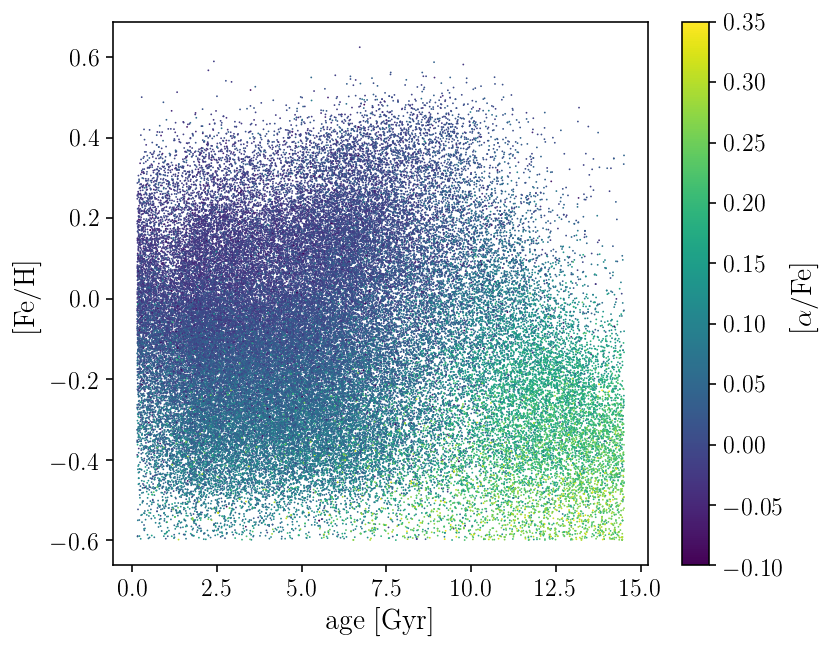

In [7]:
fig = plt.figure()
fig.set_size_inches(6,5)

plt.scatter(ages_corr, apodat['FE_H'][cleanup], s=0.8, lw=0., c=apodat['AVG_ALPHAFE'][cleanup], vmin=-0.1, vmax=0.35)
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.colorbar(label=r'$\mathrm{[\alpha/Fe]}$')

(-0.1, 0.35)

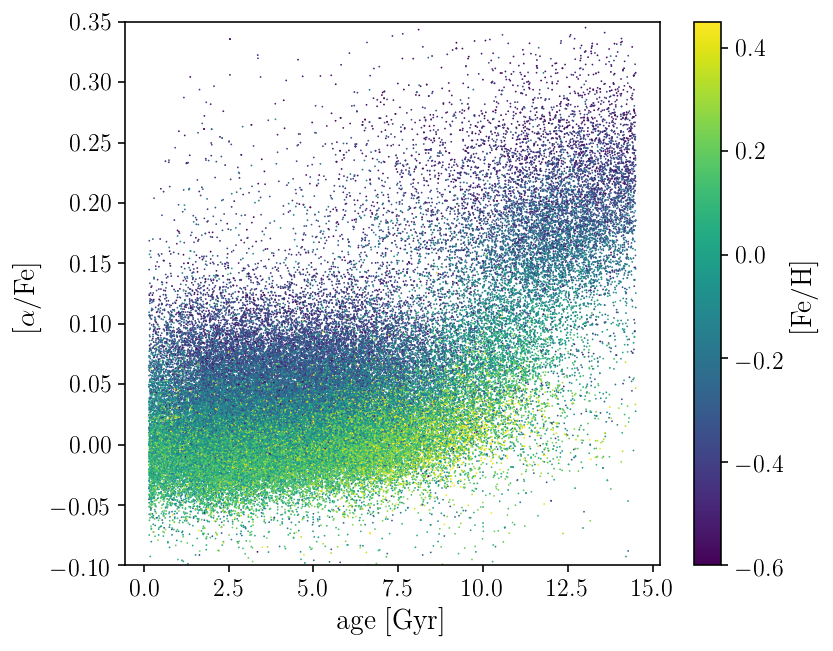

In [8]:
fig = plt.figure()
fig.set_size_inches(6,5)

plt.scatter(ages_corr, apodat['AVG_ALPHAFE'][cleanup], s=0.8, lw=0., c=apodat['FE_H'][cleanup], vmin=-0.6, vmax=0.45)
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
plt.colorbar(label=r'$\mathrm{[Fe/H]}$')
plt.ylim(-0.1,0.35)


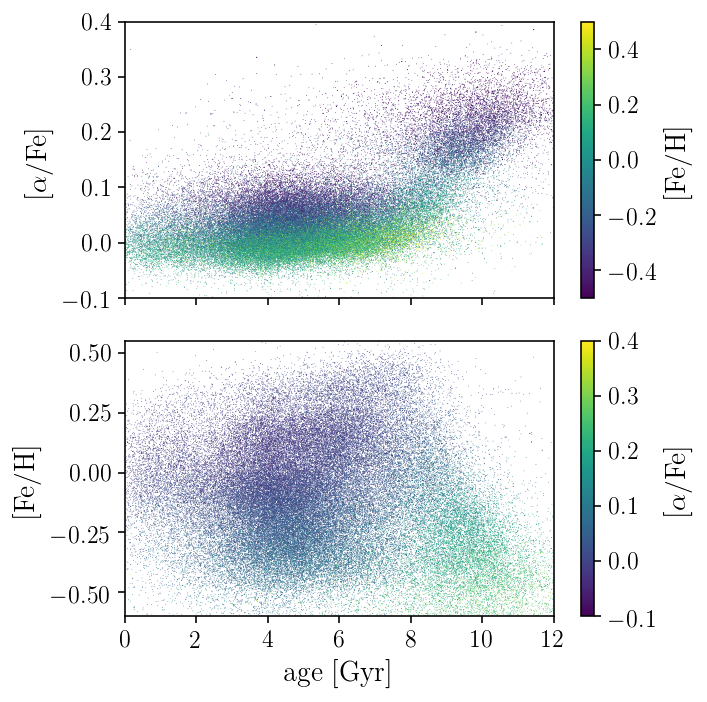

In [336]:
fig, ax = plt.subplots(2,1, sharex=True)
fig.set_size_inches(1.5*columnwidth,1.5*columnwidth)
s = ax[0].scatter(dr14out/1e3, apodat['AVG_ALPHAFE'][cleanup], s=0.15, lw=0., c=apodat['FE_H'][cleanup], vmin=-0.5,vmax=0.5, rasterized=True)


ebins_y = np.linspace(-0.1,0.3,4)
ebins_x = np.linspace(0.,12.,4)
ybin_err = []
xbin_err = []


ax[0].set_ylim(-0.1,0.4)
ax[0].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax[0])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])

s = ax[1].scatter(dr14out/1e3, apodat['FE_H'][cleanup], s=0.15, lw=0., c=apodat['AVG_ALPHAFE'][cleanup], vmin=-0.1,vmax=0.4, rasterized=True)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['FE_H'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ax[1].set_ylim(-0.6,0.55)
ax[1].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[\alpha/Fe]}$', ax=ax[1])
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[1].set_xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()


plt.savefig('../plots/polynomial_age_feh_afe.png', format='png', dpi=300)
plt.savefig('../plots/polynomial_age_feh_afe.pdf', format='pdf', dpi=300)

## Using Leung's astroNN neural network (full spectra)

In [8]:
# Load the spectra for the APOKASC DR2 catalogue

good_data = (dat['TEFF_COR'] != -9999.) & (dat['LOGG_COR'] != -9999.) & (dat['FE_H'] != -9999.) & np.isfinite(dat['age'])

specs = np.zeros([len(dat),8575])
errspecs = np.zeros([len(dat),8575])
for i in tqdm(range(len(dat))):
    try:
        specs[i], hdr = apread.aspcapStar(dat['LOC_ID'][i], dat['2MASS_ID'][i], ext=1)
        errspecs[i], hdr = apread.aspcapStar(dat['LOC_ID'][i], dat['2MASS_ID'][i], ext=2)
    except IOError:
        # just in case - doesnt seem a problem for APOKASC...
        print('Spectrum missing from SAS?')
        specs[i] = np.ones(8575)*np.nan
        errspecs[i] = np.ones(8575)*np.nan

# make an array with the APOKASC ages, and the good spectra        
specs = specs[good_data]      
errspecs = errspecs[good_data]
ages = np.log10(dat['age'][good_data]*1e6)/10.
#stack all the labels together for astroNN
out = np.dstack([dat['FE_H'][good_data], dat['TEFF_COR'][good_data], dat['LOGG_COR'][good_data], ages])[0]

100%|██████████| 5936/5936 [01:14<00:00, 80.04it/s]


In [7]:
# import the neural net class from astroNN first
from astroNN.models import ApogeeCNN

# astronn_neuralnet is an astroNN's neural network instance
# In this case, it is an instance of APOGEECNN
# set the label shape to 4 - tell it to do 100 epochs of training
astronn_neuralnet = ApogeeCNN()
astronn_neuralnet.labels_shape = 4
astronn_neuralnet.max_epochs = 30
astronn_neuralnet.autosave = False

# is this necessary?
astronn_neuralnet.targetname = ['Fe_H', 'Teff', 'Logg', 'age']

Using TensorFlow backend.


In [8]:
# do the training (takes some time!)
astronn_neuralnet.train(specs,out)

Number of Training Data: 5328, Number of Validation Data: 591
====Message from Normalizer====
You selected mode: 3
Featurewise Center: True
Datawise Center: False
Featurewise std Center: False
Datawise std Center: False
====Message ends====
====Message from Normalizer====
You selected mode: 2
Featurewise Center: True
Datawise Center: False
Featurewise std Center: True
Datawise std Center: False
====Message ends====
Instructions for updating:
`NHWC` for data_format is deprecated, use `NWC` instead
Epoch 1/30
 - 13s - loss: 0.3528 - mean_absolute_error: 0.4040 - val_loss: 0.1747 - val_mean_absolute_error: 0.2667
Epoch 2/30
 - 13s - loss: 0.1690 - mean_absolute_error: 0.2648 - val_loss: 0.1486 - val_mean_absolute_error: 0.2277
Epoch 3/30
 - 13s - loss: 0.1819 - mean_absolute_error: 0.2541 - val_loss: 0.2508 - val_mean_absolute_error: 0.3446
Epoch 4/30
 - 13s - loss: 0.1499 - mean_absolute_error: 0.2462 - val_loss: 0.1410 - val_mean_absolute_error: 0.2215
Epoch 5/30
 - 13s - loss: 0.1281 -

In [9]:
#generate predictions from trained model (save to file)
pred = astronn_neuralnet.test(specs)

with open('../sav/astroNN_APOKASC_predictions.npy', 'wb') as f:
    np.save(f, pred)

In [10]:
with open('../sav/astroNN_APOKASC_predictions.npy', 'rb') as f:
    pred = np.load(f)

/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



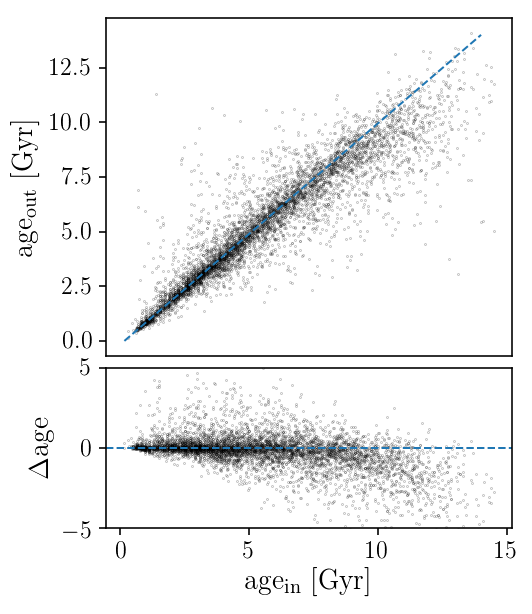

In [24]:
# plot the prediction vs the training set
fig = plt.figure()
fig.set_size_inches(columnwidth,1.2*columnwidth)
ax = fig.add_axes([0.1,0.4,0.85,0.59])
ax1 = fig.add_axes([0.1,0.1,0.85,0.28])
ax.scatter((10**(out[:,3]*10.))/1e9,(10.**(pred[:,3]*10.))/1e9, s=0.01, color='Black', rasterized=True)
ax.plot([0.,14.], [0.,14.], linestyle='dashed')
ax.set_ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
ax.set_xticks([])
ax1.scatter((10**(out[:,3]*10.))/1e9,((10.**(pred[:,3]*10.))/1e9-(10**(out[:,3]*10.))/1e9), s=0.01, color='Black', rasterized=True)
ax1.axhline(0., linestyle='dashed')
ax1.set_ylabel(r'$\Delta\mathrm{age}$')
ax1.set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax1.set_ylim(-5,5)
fig.tight_layout()
plt.savefig('../plots/astroNN_agein_ageout.pdf', format='pdf', dpi=400, bbox_inches='tight')
plt.savefig('../plots/astroNN_agein_ageout.png', format='png', dpi=400,  bbox_inches='tight')




/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



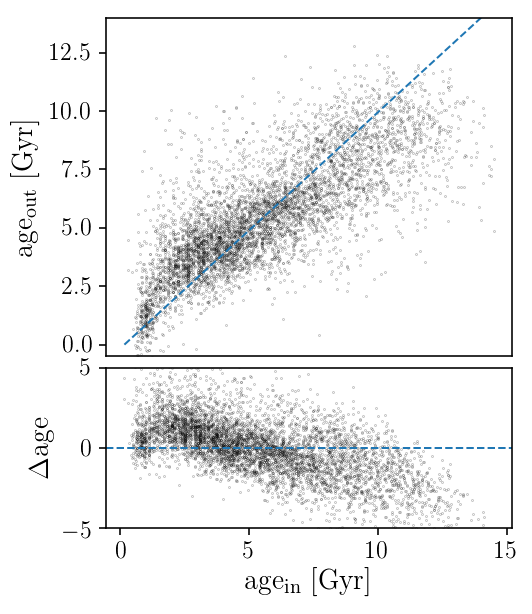

In [25]:

# plot the prediction vs the training set
fig = plt.figure()
fig.set_size_inches(columnwidth,1.2*columnwidth)
ax = fig.add_axes([0.1,0.4,0.85,0.59])
ax1 = fig.add_axes([0.1,0.1,0.85,0.28])
ax.scatter(y/1e3, dout/1e3, s=0.01, color='Black', rasterized=True)
ax.plot([0.,14.], [0.,14.], linestyle='dashed')
ax.set_ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
ax.set_ylim(-0.5,14.)
ax.set_xticks([])
ax1.scatter(y/1e3, dout/1e3-y/1e3, s=0.01, color='Black', rasterized=True)
ax1.axhline(0., linestyle='dashed')
ax1.set_ylabel(r'$\Delta\mathrm{age}$')
ax1.set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax1.set_ylim(-5,5)
fig.tight_layout()
plt.savefig('../plots/polynomial_agein_ageout.pdf', format='pdf', dpi=400,  bbox_inches='tight')
plt.savefig('../plots/polynomial_agein_ageout.png', format='png', dpi=400,  bbox_inches='tight')



(5200, 4200)

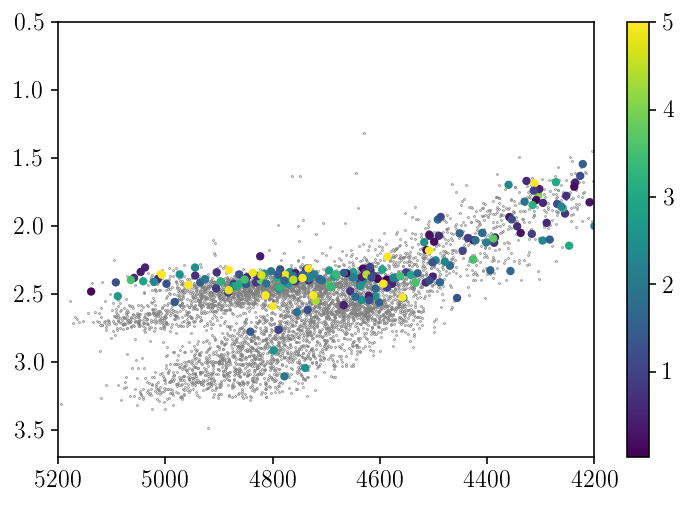

In [9]:
agein = (10**(out[:,3]*10.))/1e9
ageout = (10.**(pred[:,3]*10.))/1e9

amask = agein > 11.5

plt.scatter(dat['TEFF_COR'][good_data], dat['LOGG_COR'][good_data], c='Gray', s=0.1)
plt.scatter(dat['TEFF_COR'][good_data][amask], dat['LOGG_COR'][good_data][amask], c=np.fabs((agein-ageout))[amask], vmax=5, s=10.)
plt.colorbar()
plt.ylim(3.7,0.5)
plt.xlim(5200,4200)

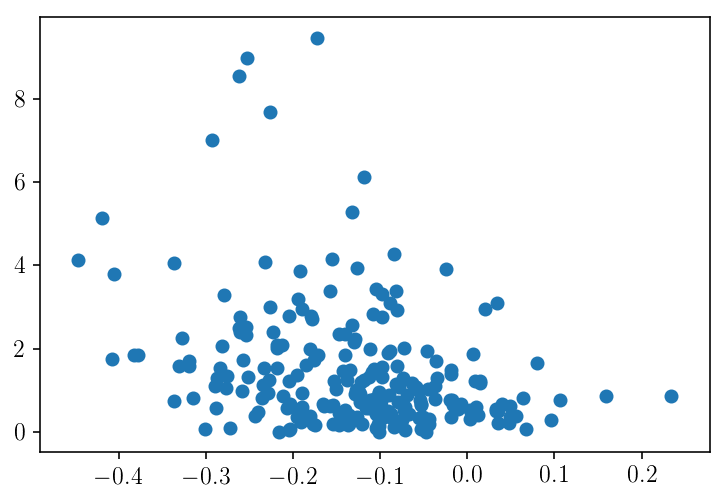

In [65]:
c_n = dat['C_FE'][good_data]-dat['N_FE'][good_data]
plt.scatter(c_n[amask],np.fabs((agein-ageout))[amask] )

In [30]:
allspecs = np.zeros([len(apodat),8575])
for i in tqdm(range(len(apodat))):
    try:
        allspecs[i], hdr = apread.aspcapStar(apodat['LOCATION_ID'][i], apodat['APOGEE_ID'][i], ext=1)
        #errspec, hdr = apread.aspcapStar(allStar['LOCATION_ID'][i], allStar['APOGEE_ID'][i], ext=2)
    except IOError:
        # not sure why some spectra are missing? perhaps these are duplicates?
        print('Spectrum missing from SAS?')
        allspecs[i] = np.ones(8575)*np.nan

  0%|          | 169/93122 [00:08<1:22:07, 18.86it/s]

Spectrum missing from SAS?


  0%|          | 369/93122 [00:13<57:09, 27.05it/s]  

Spectrum missing from SAS?
Spectrum missing from SAS?


  0%|          | 379/93122 [00:13<57:04, 27.08it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  0%|          | 391/93122 [00:14<56:37, 27.29it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  0%|          | 414/93122 [00:15<56:12, 27.49it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  0%|          | 434/93122 [00:15<55:17, 27.94it/s]

Spectrum missing from SAS?


  0%|          | 456/93122 [00:16<54:12, 28.49it/s]

Spectrum missing from SAS?


  1%|          | 482/93122 [00:16<52:59, 29.14it/s]

Spectrum missing from SAS?


  1%|          | 501/93122 [00:17<54:15, 28.45it/s]

Spectrum missing from SAS?


  4%|▍         | 3975/93122 [01:43<38:37, 38.47it/s] 

Spectrum missing from SAS?


  4%|▍         | 3993/93122 [01:43<38:31, 38.57it/s]

Spectrum missing from SAS?


  4%|▍         | 4012/93122 [01:43<38:28, 38.60it/s]

Spectrum missing from SAS?


  4%|▍         | 4020/93122 [01:44<38:31, 38.55it/s]

Spectrum missing from SAS?


  4%|▍         | 4048/93122 [01:45<38:31, 38.53it/s]

Spectrum missing from SAS?


  4%|▍         | 4101/93122 [01:45<38:17, 38.74it/s]

Spectrum missing from SAS?


  4%|▍         | 4138/93122 [01:47<38:22, 38.64it/s]

Spectrum missing from SAS?


  4%|▍         | 4186/93122 [01:48<38:17, 38.71it/s]

Spectrum missing from SAS?


  5%|▌         | 4795/93122 [02:00<36:52, 39.92it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  5%|▌         | 4828/93122 [02:00<36:43, 40.08it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  5%|▌         | 4837/93122 [02:00<36:40, 40.11it/s]

Spectrum missing from SAS?


  5%|▌         | 4854/93122 [02:00<36:37, 40.17it/s]

Spectrum missing from SAS?


  5%|▌         | 4862/93122 [02:01<36:38, 40.14it/s]

Spectrum missing from SAS?


  5%|▌         | 4889/93122 [02:01<36:34, 40.21it/s]

Spectrum missing from SAS?


  5%|▌         | 4991/93122 [02:03<36:13, 40.54it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  5%|▌         | 5012/93122 [02:03<36:08, 40.64it/s]

Spectrum missing from SAS?


  5%|▌         | 5022/93122 [02:03<36:09, 40.61it/s]

Spectrum missing from SAS?


  6%|▌         | 5672/93122 [02:20<35:58, 40.51it/s]

Spectrum missing from SAS?


  6%|▌         | 5721/93122 [02:21<36:00, 40.46it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  6%|▌         | 5748/93122 [02:21<35:57, 40.49it/s]

Spectrum missing from SAS?


  6%|▌         | 5766/93122 [02:22<35:56, 40.51it/s]

Spectrum missing from SAS?


  6%|▋         | 5860/93122 [02:25<36:06, 40.29it/s]

Spectrum missing from SAS?


  6%|▋         | 5877/93122 [02:25<36:02, 40.34it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  6%|▋         | 5932/93122 [02:26<35:56, 40.43it/s]

Spectrum missing from SAS?


  7%|▋         | 6083/93122 [02:28<35:30, 40.86it/s]

Spectrum missing from SAS?


  7%|▋         | 6155/93122 [02:30<35:25, 40.91it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  7%|▋         | 6758/93122 [02:46<35:21, 40.70it/s]

Spectrum missing from SAS?


  7%|▋         | 6861/93122 [02:49<35:26, 40.57it/s]

Spectrum missing from SAS?


  7%|▋         | 6879/93122 [02:49<35:22, 40.62it/s]

Spectrum missing from SAS?


  7%|▋         | 6925/93122 [02:50<35:17, 40.71it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


  7%|▋         | 6982/93122 [02:50<35:09, 40.84it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


  8%|▊         | 7055/93122 [02:51<34:57, 41.04it/s]

Spectrum missing from SAS?


  8%|▊         | 7088/93122 [02:52<34:56, 41.03it/s]

Spectrum missing from SAS?


  8%|▊         | 7197/93122 [02:54<34:43, 41.24it/s]

Spectrum missing from SAS?


  8%|▊         | 7258/93122 [02:56<34:45, 41.17it/s]

Spectrum missing from SAS?


  8%|▊         | 7469/93122 [03:04<35:10, 40.58it/s]

Spectrum missing from SAS?


  9%|▊         | 8103/93122 [03:27<36:18, 39.03it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 10%|█         | 9503/93122 [03:57<34:47, 40.05it/s]

Spectrum missing from SAS?


 10%|█         | 9626/93122 [04:01<34:57, 39.81it/s]

Spectrum missing from SAS?


 10%|█         | 9716/93122 [04:05<35:04, 39.64it/s]

Spectrum missing from SAS?


 11%|█         | 9951/93122 [04:12<35:07, 39.46it/s]

Spectrum missing from SAS?


 11%|█         | 9966/93122 [04:12<35:06, 39.48it/s]

Spectrum missing from SAS?


 11%|█         | 9973/93122 [04:12<35:06, 39.47it/s]

Spectrum missing from SAS?


 11%|█         | 9989/93122 [04:13<35:06, 39.47it/s]

Spectrum missing from SAS?


 11%|█         | 10007/93122 [04:13<35:03, 39.51it/s]

Spectrum missing from SAS?


 11%|█         | 10022/93122 [04:13<35:03, 39.50it/s]

Spectrum missing from SAS?


 11%|█         | 10086/93122 [04:17<35:19, 39.17it/s]

Spectrum missing from SAS?


 11%|█         | 10201/93122 [04:19<35:09, 39.31it/s]

Spectrum missing from SAS?


 11%|█         | 10278/93122 [04:21<35:10, 39.26it/s]

Spectrum missing from SAS?


 12%|█▏        | 10867/93122 [04:34<34:40, 39.54it/s]

Spectrum missing from SAS?


 12%|█▏        | 10946/93122 [04:36<34:34, 39.62it/s]

Spectrum missing from SAS?


 14%|█▍        | 13395/93122 [05:38<33:36, 39.54it/s]

Spectrum missing from SAS?


 14%|█▍        | 13445/93122 [05:41<33:44, 39.36it/s]

Spectrum missing from SAS?


 14%|█▍        | 13488/93122 [05:42<33:43, 39.35it/s]

Spectrum missing from SAS?


 15%|█▍        | 13504/93122 [05:43<33:43, 39.35it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 15%|█▍        | 13536/93122 [05:43<33:41, 39.37it/s]

Spectrum missing from SAS?


 15%|█▍        | 13563/93122 [05:44<33:39, 39.39it/s]

Spectrum missing from SAS?


 15%|█▍        | 13734/93122 [05:48<33:32, 39.45it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 15%|█▌        | 14118/93122 [05:57<33:21, 39.47it/s]

Spectrum missing from SAS?


 16%|█▌        | 14525/93122 [06:08<33:14, 39.41it/s]

Spectrum missing from SAS?


 16%|█▌        | 14571/93122 [06:09<33:09, 39.47it/s]

Spectrum missing from SAS?


 19%|█▉        | 17940/93122 [07:29<31:24, 39.90it/s]

Spectrum missing from SAS?


 19%|█▉        | 18015/93122 [07:31<31:20, 39.93it/s]

Spectrum missing from SAS?


 19%|█▉        | 18118/93122 [07:33<31:16, 39.97it/s]

Spectrum missing from SAS?


 19%|█▉        | 18131/93122 [07:33<31:15, 39.99it/s]

Spectrum missing from SAS?


 20%|█▉        | 18286/93122 [07:36<31:10, 40.02it/s]

Spectrum missing from SAS?


 20%|█▉        | 18306/93122 [07:37<31:09, 40.03it/s]

Spectrum missing from SAS?


 20%|██        | 18704/93122 [07:42<30:41, 40.42it/s]

Spectrum missing from SAS?


 20%|██        | 18745/93122 [07:43<30:37, 40.47it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 20%|██        | 19090/93122 [07:50<30:25, 40.55it/s]

Spectrum missing from SAS?


 21%|██        | 19304/93122 [07:54<30:12, 40.72it/s]

Spectrum missing from SAS?


 21%|██        | 19370/93122 [07:54<30:07, 40.80it/s]

Spectrum missing from SAS?


 21%|██        | 19645/93122 [08:02<30:05, 40.70it/s]

Spectrum missing from SAS?


 26%|██▌       | 24444/93122 [09:38<27:06, 42.23it/s]

Spectrum missing from SAS?


 26%|██▋       | 24507/93122 [09:39<27:02, 42.30it/s]

Spectrum missing from SAS?


 27%|██▋       | 24831/93122 [09:44<26:47, 42.47it/s]

Spectrum missing from SAS?


 27%|██▋       | 24908/93122 [09:46<26:45, 42.48it/s]

Spectrum missing from SAS?


 27%|██▋       | 25006/93122 [09:47<26:41, 42.53it/s]

Spectrum missing from SAS?


 27%|██▋       | 25044/93122 [09:48<26:39, 42.56it/s]

Spectrum missing from SAS?


 27%|██▋       | 25209/93122 [09:51<26:34, 42.60it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 28%|██▊       | 25629/93122 [10:02<26:27, 42.50it/s]

Spectrum missing from SAS?


 28%|██▊       | 25805/93122 [10:05<26:20, 42.60it/s]

Spectrum missing from SAS?


 28%|██▊       | 26117/93122 [10:13<26:14, 42.55it/s]

Spectrum missing from SAS?


 28%|██▊       | 26162/93122 [10:14<26:13, 42.56it/s]

Spectrum missing from SAS?


 28%|██▊       | 26509/93122 [10:23<26:07, 42.49it/s]

Spectrum missing from SAS?


 29%|██▊       | 26554/93122 [10:24<26:05, 42.51it/s]

Spectrum missing from SAS?


 29%|██▊       | 26589/93122 [10:26<26:07, 42.44it/s]

Spectrum missing from SAS?


 29%|██▉       | 26904/93122 [10:35<26:05, 42.31it/s]

Spectrum missing from SAS?


 32%|███▏      | 29420/93122 [11:27<24:47, 42.81it/s]

Spectrum missing from SAS?


 34%|███▍      | 31480/93122 [12:12<23:54, 42.97it/s]

Spectrum missing from SAS?


 34%|███▍      | 31667/93122 [12:15<23:47, 43.04it/s]

Spectrum missing from SAS?


 34%|███▍      | 31852/93122 [12:19<23:41, 43.10it/s]

Spectrum missing from SAS?


 34%|███▍      | 31940/93122 [12:20<23:38, 43.13it/s]

Spectrum missing from SAS?


 34%|███▍      | 32107/93122 [12:24<23:34, 43.14it/s]

Spectrum missing from SAS?


 35%|███▌      | 32976/93122 [12:41<23:09, 43.28it/s]

Spectrum missing from SAS?


 36%|███▌      | 33131/93122 [12:48<23:11, 43.11it/s]

Spectrum missing from SAS?


 36%|███▌      | 33168/93122 [12:49<23:11, 43.08it/s]

Spectrum missing from SAS?


 36%|███▌      | 33243/93122 [12:50<23:08, 43.12it/s]

Spectrum missing from SAS?


 36%|███▌      | 33297/93122 [12:51<23:06, 43.15it/s]

Spectrum missing from SAS?


 36%|███▌      | 33436/93122 [12:55<23:04, 43.10it/s]

Spectrum missing from SAS?


 37%|███▋      | 34243/93122 [13:13<22:44, 43.16it/s]

Spectrum missing from SAS?


 37%|███▋      | 34529/93122 [13:17<22:32, 43.32it/s]

Spectrum missing from SAS?


 37%|███▋      | 34578/93122 [13:17<22:30, 43.35it/s]

Spectrum missing from SAS?


 42%|████▏     | 38992/93122 [15:00<20:50, 43.29it/s]

Spectrum missing from SAS?


 43%|████▎     | 40177/93122 [15:28<20:23, 43.27it/s]

Spectrum missing from SAS?


 43%|████▎     | 40202/93122 [15:29<20:23, 43.27it/s]

Spectrum missing from SAS?


 43%|████▎     | 40285/93122 [15:30<20:20, 43.31it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 43%|████▎     | 40412/93122 [15:32<20:16, 43.33it/s]

Spectrum missing from SAS?


 43%|████▎     | 40442/93122 [15:33<20:16, 43.30it/s]

Spectrum missing from SAS?


 43%|████▎     | 40472/93122 [15:34<20:15, 43.31it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 43%|████▎     | 40496/93122 [15:35<20:15, 43.29it/s]

Spectrum missing from SAS?


 44%|████▎     | 40535/93122 [15:36<20:14, 43.29it/s]

Spectrum missing from SAS?


 44%|████▎     | 40628/93122 [15:38<20:12, 43.28it/s]

Spectrum missing from SAS?


 44%|████▎     | 40676/93122 [15:39<20:11, 43.30it/s]

Spectrum missing from SAS?


 44%|████▍     | 40778/93122 [15:40<20:07, 43.35it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 44%|████▍     | 40830/93122 [15:41<20:05, 43.36it/s]

Spectrum missing from SAS?


 44%|████▍     | 40985/93122 [15:45<20:03, 43.33it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 44%|████▍     | 41145/93122 [15:49<19:59, 43.34it/s]

Spectrum missing from SAS?


 44%|████▍     | 41438/93122 [15:54<19:50, 43.40it/s]

Spectrum missing from SAS?


 48%|████▊     | 44809/93122 [17:33<18:56, 42.52it/s]

Spectrum missing from SAS?


 48%|████▊     | 44876/93122 [17:34<18:53, 42.55it/s]

Spectrum missing from SAS?


 48%|████▊     | 44975/93122 [17:36<18:50, 42.58it/s]

Spectrum missing from SAS?


 48%|████▊     | 45131/93122 [17:38<18:46, 42.62it/s]

Spectrum missing from SAS?


 49%|████▊     | 45218/93122 [17:40<18:43, 42.64it/s]

Spectrum missing from SAS?


 49%|████▊     | 45236/93122 [17:41<18:43, 42.63it/s]

Spectrum missing from SAS?


 49%|████▊     | 45269/93122 [17:43<18:44, 42.57it/s]

Spectrum missing from SAS?


 49%|████▊     | 45275/93122 [17:45<18:45, 42.50it/s]

Spectrum missing from SAS?


 49%|████▊     | 45280/93122 [17:45<18:46, 42.48it/s]

Spectrum missing from SAS?


 49%|████▊     | 45317/93122 [17:46<18:45, 42.49it/s]

Spectrum missing from SAS?


 49%|████▉     | 45398/93122 [17:48<18:42, 42.50it/s]

Spectrum missing from SAS?


 49%|████▉     | 45437/93122 [17:48<18:41, 42.51it/s]

Spectrum missing from SAS?


 49%|████▉     | 45469/93122 [17:49<18:40, 42.53it/s]

Spectrum missing from SAS?


 49%|████▉     | 45748/93122 [17:53<18:31, 42.61it/s]

Spectrum missing from SAS?


 49%|████▉     | 45831/93122 [17:55<18:30, 42.60it/s]

Spectrum missing from SAS?


 49%|████▉     | 45967/93122 [17:57<18:25, 42.66it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 49%|████▉     | 46056/93122 [18:00<18:24, 42.61it/s]

Spectrum missing from SAS?


 50%|████▉     | 46205/93122 [18:03<18:20, 42.64it/s]

Spectrum missing from SAS?


 50%|████▉     | 46241/93122 [18:04<18:19, 42.65it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 50%|████▉     | 46322/93122 [18:06<18:17, 42.64it/s]

Spectrum missing from SAS?


 50%|█████     | 46701/93122 [18:14<18:07, 42.69it/s]

Spectrum missing from SAS?


 51%|█████     | 47030/93122 [18:19<17:57, 42.79it/s]

Spectrum missing from SAS?


 51%|█████     | 47263/93122 [18:24<17:51, 42.80it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 51%|█████     | 47359/93122 [18:25<17:48, 42.82it/s]

Spectrum missing from SAS?


 51%|█████     | 47397/93122 [18:26<17:47, 42.83it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 51%|█████     | 47418/93122 [18:26<17:46, 42.84it/s]

Spectrum missing from SAS?


 51%|█████     | 47489/93122 [18:27<17:44, 42.87it/s]

Spectrum missing from SAS?


 51%|█████     | 47553/93122 [18:28<17:42, 42.89it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 51%|█████     | 47584/93122 [18:28<17:41, 42.91it/s]

Spectrum missing from SAS?


 51%|█████     | 47665/93122 [18:30<17:39, 42.91it/s]

Spectrum missing from SAS?


 51%|█████     | 47701/93122 [18:31<17:38, 42.92it/s]

Spectrum missing from SAS?


 51%|█████▏    | 47829/93122 [18:34<17:35, 42.90it/s]

Spectrum missing from SAS?


 52%|█████▏    | 47974/93122 [18:38<17:32, 42.91it/s]

Spectrum missing from SAS?


 52%|█████▏    | 48305/93122 [18:44<17:22, 42.97it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 52%|█████▏    | 48325/93122 [18:44<17:22, 42.98it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 52%|█████▏    | 48344/93122 [18:44<17:21, 42.99it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 52%|█████▏    | 48370/93122 [18:45<17:20, 42.99it/s]

Spectrum missing from SAS?


 52%|█████▏    | 48417/93122 [18:46<17:19, 43.00it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 52%|█████▏    | 48436/93122 [18:46<17:19, 43.00it/s]

Spectrum missing from SAS?


 52%|█████▏    | 48460/93122 [18:46<17:18, 43.01it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 52%|█████▏    | 48498/93122 [18:47<17:17, 43.01it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 52%|█████▏    | 48574/93122 [18:51<17:17, 42.93it/s]

Spectrum missing from SAS?


 52%|█████▏    | 48594/93122 [18:52<17:17, 42.92it/s]

Spectrum missing from SAS?


 53%|█████▎    | 48966/93122 [19:03<17:11, 42.82it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 53%|█████▎    | 48982/93122 [19:05<17:12, 42.76it/s]

Spectrum missing from SAS?


 53%|█████▎    | 49000/93122 [19:05<17:11, 42.76it/s]

Spectrum missing from SAS?


 53%|█████▎    | 49029/93122 [19:07<17:11, 42.74it/s]

Spectrum missing from SAS?


 53%|█████▎    | 49074/93122 [19:09<17:11, 42.69it/s]

Spectrum missing from SAS?


 53%|█████▎    | 49119/93122 [19:10<17:10, 42.69it/s]

Spectrum missing from SAS?


 53%|█████▎    | 49152/93122 [19:11<17:09, 42.70it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 53%|█████▎    | 49169/93122 [19:11<17:09, 42.70it/s]

Spectrum missing from SAS?


 53%|█████▎    | 49239/93122 [19:15<17:09, 42.63it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50248/93122 [19:53<16:58, 42.11it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50331/93122 [20:00<17:00, 41.92it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50360/93122 [20:03<17:01, 41.86it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50425/93122 [20:05<17:00, 41.84it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 54%|█████▍    | 50432/93122 [20:05<17:00, 41.84it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 54%|█████▍    | 50455/93122 [20:05<16:59, 41.84it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50461/93122 [20:06<16:59, 41.83it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50491/93122 [20:07<16:59, 41.80it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50507/93122 [20:08<16:59, 41.80it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50521/93122 [20:09<17:00, 41.76it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50539/93122 [20:10<17:00, 41.74it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 54%|█████▍    | 50565/93122 [20:11<16:59, 41.75it/s]

Spectrum missing from SAS?


 54%|█████▍    | 50596/93122 [20:11<16:58, 41.75it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 54%|█████▍    | 50630/93122 [20:13<16:58, 41.74it/s]

Spectrum missing from SAS?


 55%|█████▍    | 51062/93122 [20:25<16:49, 41.66it/s]

Spectrum missing from SAS?


 55%|█████▌    | 51356/93122 [20:35<16:44, 41.58it/s]

Spectrum missing from SAS?


 55%|█████▌    | 51372/93122 [20:35<16:44, 41.58it/s]

Spectrum missing from SAS?


 55%|█████▌    | 51431/93122 [20:37<16:42, 41.57it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 55%|█████▌    | 51474/93122 [20:37<16:41, 41.58it/s]

Spectrum missing from SAS?


 55%|█████▌    | 51521/93122 [20:40<16:41, 41.54it/s]

Spectrum missing from SAS?


 55%|█████▌    | 51573/93122 [20:41<16:40, 41.54it/s]

Spectrum missing from SAS?


 55%|█████▌    | 51585/93122 [20:42<16:40, 41.50it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 55%|█████▌    | 51607/93122 [20:43<16:40, 41.49it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 55%|█████▌    | 51662/93122 [20:46<16:40, 41.46it/s]

Spectrum missing from SAS?


 55%|█████▌    | 51677/93122 [20:46<16:39, 41.46it/s]

Spectrum missing from SAS?


 56%|█████▌    | 51707/93122 [20:46<16:38, 41.47it/s]

Spectrum missing from SAS?


 56%|█████▌    | 51732/93122 [20:47<16:37, 41.47it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 56%|█████▌    | 51791/93122 [20:48<16:36, 41.48it/s]

Spectrum missing from SAS?


 56%|█████▌    | 51949/93122 [20:54<16:34, 41.42it/s]

Spectrum missing from SAS?


 56%|█████▌    | 52134/93122 [20:59<16:30, 41.38it/s]

Spectrum missing from SAS?


 56%|█████▋    | 52408/93122 [21:06<16:24, 41.37it/s]

Spectrum missing from SAS?


 56%|█████▋    | 52532/93122 [21:09<16:21, 41.38it/s]

Spectrum missing from SAS?


 56%|█████▋    | 52546/93122 [21:09<16:20, 41.38it/s]

Spectrum missing from SAS?


 56%|█████▋    | 52563/93122 [21:10<16:20, 41.36it/s]

Spectrum missing from SAS?


 56%|█████▋    | 52570/93122 [21:10<16:20, 41.36it/s]

Spectrum missing from SAS?


 56%|█████▋    | 52592/93122 [21:13<16:21, 41.31it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 57%|█████▋    | 52635/93122 [21:14<16:20, 41.31it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 57%|█████▋    | 52641/93122 [21:14<16:20, 41.31it/s]

Spectrum missing from SAS?


 57%|█████▋    | 52704/93122 [21:16<16:18, 41.30it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 57%|█████▋    | 52717/93122 [21:16<16:18, 41.31it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 57%|█████▋    | 53067/93122 [21:19<16:05, 41.47it/s]

Spectrum missing from SAS?


 58%|█████▊    | 53909/93122 [21:39<15:45, 41.49it/s]

Spectrum missing from SAS?


 58%|█████▊    | 53938/93122 [21:40<15:44, 41.48it/s]

Spectrum missing from SAS?


 58%|█████▊    | 53967/93122 [21:40<15:43, 41.49it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 58%|█████▊    | 53996/93122 [21:41<15:42, 41.50it/s]

Spectrum missing from SAS?


 58%|█████▊    | 54033/93122 [21:41<15:41, 41.52it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 58%|█████▊    | 54061/93122 [21:41<15:40, 41.53it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 58%|█████▊    | 54098/93122 [21:42<15:39, 41.52it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 58%|█████▊    | 54129/93122 [21:43<15:39, 41.52it/s]

Spectrum missing from SAS?


 58%|█████▊    | 54167/93122 [21:44<15:38, 41.53it/s]

Spectrum missing from SAS?


 59%|█████▉    | 54942/93122 [22:09<15:23, 41.32it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 59%|█████▉    | 55005/93122 [22:12<15:23, 41.28it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 59%|█████▉    | 55043/93122 [22:13<15:22, 41.29it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 59%|█████▉    | 55093/93122 [22:14<15:21, 41.29it/s]

Spectrum missing from SAS?


 59%|█████▉    | 55159/93122 [22:15<15:19, 41.30it/s]

Spectrum missing from SAS?


 59%|█████▉    | 55172/93122 [22:16<15:19, 41.27it/s]

Spectrum missing from SAS?


 60%|█████▉    | 55497/93122 [22:23<15:10, 41.31it/s]

Spectrum missing from SAS?


 60%|██████    | 55946/93122 [22:35<15:00, 41.27it/s]

Spectrum missing from SAS?


 60%|██████    | 56001/93122 [22:37<14:59, 41.25it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 60%|██████    | 56015/93122 [22:37<14:59, 41.26it/s]

Spectrum missing from SAS?


 60%|██████    | 56047/93122 [22:43<15:01, 41.12it/s]

Spectrum missing from SAS?


 60%|██████    | 56134/93122 [22:51<15:03, 40.93it/s]

Spectrum missing from SAS?


 60%|██████    | 56173/93122 [22:53<15:03, 40.89it/s]

Spectrum missing from SAS?


 60%|██████    | 56184/93122 [22:54<15:03, 40.88it/s]

Spectrum missing from SAS?


 60%|██████    | 56193/93122 [22:54<15:03, 40.88it/s]

Spectrum missing from SAS?


 60%|██████    | 56219/93122 [22:55<15:03, 40.86it/s]

Spectrum missing from SAS?


 63%|██████▎   | 58383/93122 [23:32<14:00, 41.34it/s]

Spectrum missing from SAS?


 63%|██████▎   | 58418/93122 [23:33<13:59, 41.33it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 63%|██████▎   | 58458/93122 [23:34<13:58, 41.32it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 63%|██████▎   | 58571/93122 [23:38<13:56, 41.29it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 63%|██████▎   | 58596/93122 [23:39<13:56, 41.29it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 63%|██████▎   | 58654/93122 [23:39<13:54, 41.31it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 63%|██████▎   | 58712/93122 [23:40<13:52, 41.33it/s]

Spectrum missing from SAS?


 63%|██████▎   | 58728/93122 [23:41<13:52, 41.32it/s]

Spectrum missing from SAS?


 64%|██████▎   | 59332/93122 [23:55<13:37, 41.32it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 64%|██████▍   | 59551/93122 [23:59<13:31, 41.36it/s]

Spectrum missing from SAS?


 64%|██████▍   | 59610/93122 [24:01<13:30, 41.36it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 64%|██████▍   | 59651/93122 [24:01<13:29, 41.37it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 64%|██████▍   | 59716/93122 [24:02<13:27, 41.39it/s]

Spectrum missing from SAS?


 64%|██████▍   | 59747/93122 [24:03<13:26, 41.40it/s]

Spectrum missing from SAS?


 64%|██████▍   | 59798/93122 [24:04<13:24, 41.41it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 64%|██████▍   | 59878/93122 [24:07<13:23, 41.37it/s]

Spectrum missing from SAS?


 66%|██████▌   | 61343/93122 [24:43<12:48, 41.35it/s]

Spectrum missing from SAS?


 67%|██████▋   | 61967/93122 [24:55<12:31, 41.44it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 67%|██████▋   | 62075/93122 [24:57<12:28, 41.46it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 67%|██████▋   | 62096/93122 [24:57<12:28, 41.47it/s]

Spectrum missing from SAS?


 67%|██████▋   | 62229/93122 [24:59<12:24, 41.49it/s]

Spectrum missing from SAS?


 67%|██████▋   | 62378/93122 [25:02<12:20, 41.51it/s]

Spectrum missing from SAS?


 67%|██████▋   | 62427/93122 [25:03<12:19, 41.52it/s]

Spectrum missing from SAS?


 67%|██████▋   | 62479/93122 [25:04<12:17, 41.53it/s]

Spectrum missing from SAS?


 68%|██████▊   | 63458/93122 [25:27<11:54, 41.53it/s]

Spectrum missing from SAS?


 69%|██████▊   | 63924/93122 [25:36<11:41, 41.61it/s]

Spectrum missing from SAS?


 69%|██████▊   | 63963/93122 [25:36<11:40, 41.63it/s]

Spectrum missing from SAS?


 69%|██████▉   | 64206/93122 [25:43<11:34, 41.61it/s]

Spectrum missing from SAS?


 69%|██████▉   | 64259/93122 [25:45<11:33, 41.59it/s]

Spectrum missing from SAS?


 69%|██████▉   | 64400/93122 [25:48<11:30, 41.60it/s]

Spectrum missing from SAS?


 69%|██████▉   | 64430/93122 [25:48<11:29, 41.61it/s]

Spectrum missing from SAS?


 69%|██████▉   | 64455/93122 [25:49<11:28, 41.61it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 70%|██████▉   | 64995/93122 [26:07<11:18, 41.47it/s]

Spectrum missing from SAS?


 71%|███████   | 65787/93122 [26:27<10:59, 41.44it/s]

Spectrum missing from SAS?


 71%|███████   | 65817/93122 [26:28<10:58, 41.44it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 71%|███████   | 65868/93122 [26:28<10:57, 41.45it/s]

Spectrum missing from SAS?


 71%|███████   | 65902/93122 [26:29<10:56, 41.46it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 71%|███████   | 65970/93122 [26:30<10:54, 41.47it/s]

Spectrum missing from SAS?


 73%|███████▎  | 67566/93122 [27:23<10:21, 41.12it/s]

Spectrum missing from SAS?


 73%|███████▎  | 67587/93122 [27:23<10:21, 41.12it/s]

Spectrum missing from SAS?


 73%|███████▎  | 67623/93122 [27:24<10:20, 41.13it/s]

Spectrum missing from SAS?


 73%|███████▎  | 67647/93122 [27:25<10:19, 41.12it/s]

Spectrum missing from SAS?


 73%|███████▎  | 67700/93122 [27:27<10:18, 41.10it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 73%|███████▎  | 67724/93122 [27:27<10:17, 41.11it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 73%|███████▎  | 67806/93122 [27:29<10:15, 41.10it/s]

Spectrum missing from SAS?


 73%|███████▎  | 67923/93122 [27:32<10:13, 41.10it/s]

Spectrum missing from SAS?


 74%|███████▍  | 68997/93122 [27:58<09:46, 41.11it/s]

Spectrum missing from SAS?


 75%|███████▌  | 69985/93122 [28:15<09:20, 41.28it/s]

Spectrum missing from SAS?


 76%|███████▌  | 70481/93122 [28:26<09:08, 41.30it/s]

Spectrum missing from SAS?


 76%|███████▋  | 71135/93122 [28:39<08:51, 41.38it/s]

Spectrum missing from SAS?


 76%|███████▋  | 71182/93122 [28:39<08:50, 41.39it/s]

Spectrum missing from SAS?


 76%|███████▋  | 71215/93122 [28:40<08:49, 41.40it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 77%|███████▋  | 71250/93122 [28:40<08:48, 41.41it/s]

Spectrum missing from SAS?


 77%|███████▋  | 71450/93122 [28:44<08:42, 41.44it/s]

Spectrum missing from SAS?


 77%|███████▋  | 71614/93122 [28:47<08:38, 41.45it/s]

Spectrum missing from SAS?


 77%|███████▋  | 71706/93122 [28:48<08:36, 41.49it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 77%|███████▋  | 71820/93122 [28:51<08:33, 41.48it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 78%|███████▊  | 72214/93122 [28:59<08:23, 41.52it/s]

Spectrum missing from SAS?


 83%|████████▎ | 77534/93122 [30:40<06:09, 42.14it/s]

Spectrum missing from SAS?


 83%|████████▎ | 77697/93122 [30:42<06:05, 42.16it/s]

Spectrum missing from SAS?


 83%|████████▎ | 77718/93122 [30:43<06:05, 42.17it/s]

Spectrum missing from SAS?


 83%|████████▎ | 77736/93122 [30:43<06:04, 42.17it/s]

Spectrum missing from SAS?


 84%|████████▎ | 77792/93122 [30:43<06:03, 42.19it/s]

Spectrum missing from SAS?


 84%|████████▎ | 77857/93122 [30:44<06:01, 42.20it/s]

Spectrum missing from SAS?


 84%|████████▎ | 77884/93122 [30:45<06:01, 42.21it/s]

Spectrum missing from SAS?


 84%|████████▍ | 78201/93122 [30:52<05:53, 42.21it/s]

Spectrum missing from SAS?


 89%|████████▉ | 82938/93122 [32:42<04:01, 42.25it/s]

Spectrum missing from SAS?


 89%|████████▉ | 82946/93122 [32:43<04:00, 42.25it/s]

Spectrum missing from SAS?


 89%|████████▉ | 83014/93122 [32:44<03:59, 42.26it/s]

Spectrum missing from SAS?


 89%|████████▉ | 83035/93122 [32:44<03:58, 42.26it/s]

Spectrum missing from SAS?


 89%|████████▉ | 83081/93122 [32:45<03:57, 42.26it/s]

Spectrum missing from SAS?


 89%|████████▉ | 83130/93122 [32:46<03:56, 42.27it/s]

Spectrum missing from SAS?


 89%|████████▉ | 83323/93122 [32:49<03:51, 42.30it/s]

Spectrum missing from SAS?


 90%|█████████ | 84235/93122 [33:07<03:29, 42.39it/s]

Spectrum missing from SAS?


 91%|█████████ | 84512/93122 [33:14<03:23, 42.38it/s]

Spectrum missing from SAS?


 91%|█████████ | 84558/93122 [33:14<03:22, 42.39it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 91%|█████████ | 84592/93122 [33:15<03:21, 42.40it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 91%|█████████ | 84625/93122 [33:15<03:20, 42.41it/s]

Spectrum missing from SAS?


 91%|█████████ | 84636/93122 [33:15<03:20, 42.41it/s]

Spectrum missing from SAS?


 91%|█████████ | 84662/93122 [33:16<03:19, 42.41it/s]

Spectrum missing from SAS?


 91%|█████████ | 84698/93122 [33:16<03:18, 42.41it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 93%|█████████▎| 86499/93122 [33:58<02:36, 42.42it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 93%|█████████▎| 86532/93122 [34:00<02:35, 42.41it/s]

Spectrum missing from SAS?


 93%|█████████▎| 86567/93122 [34:01<02:34, 42.40it/s]

Spectrum missing from SAS?


 93%|█████████▎| 86577/93122 [34:01<02:34, 42.40it/s]

Spectrum missing from SAS?


 93%|█████████▎| 86619/93122 [34:02<02:33, 42.41it/s]

Spectrum missing from SAS?


 93%|█████████▎| 86716/93122 [34:05<02:31, 42.39it/s]

Spectrum missing from SAS?


 93%|█████████▎| 86750/93122 [34:06<02:30, 42.39it/s]

Spectrum missing from SAS?


 93%|█████████▎| 86790/93122 [34:08<02:29, 42.37it/s]

Spectrum missing from SAS?


 93%|█████████▎| 86812/93122 [34:08<02:28, 42.38it/s]

Spectrum missing from SAS?


 96%|█████████▌| 89092/93122 [34:55<01:34, 42.51it/s]

Spectrum missing from SAS?


 96%|█████████▌| 89126/93122 [34:55<01:33, 42.52it/s]

Spectrum missing from SAS?


 96%|█████████▌| 89155/93122 [34:56<01:33, 42.53it/s]

Spectrum missing from SAS?


 96%|█████████▌| 89173/93122 [34:57<01:32, 42.51it/s]

Spectrum missing from SAS?


 96%|█████████▌| 89249/93122 [34:59<01:31, 42.51it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 96%|█████████▌| 89413/93122 [35:05<01:27, 42.47it/s]

Spectrum missing from SAS?


 96%|█████████▌| 89613/93122 [35:10<01:22, 42.45it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 97%|█████████▋| 90322/93122 [35:37<01:06, 42.25it/s]

Spectrum missing from SAS?


 97%|█████████▋| 90329/93122 [35:38<01:06, 42.24it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 97%|█████████▋| 90389/93122 [35:39<01:04, 42.25it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 97%|█████████▋| 90397/93122 [35:39<01:04, 42.25it/s]

Spectrum missing from SAS?


 97%|█████████▋| 90424/93122 [35:40<01:03, 42.25it/s]

Spectrum missing from SAS?


 97%|█████████▋| 90445/93122 [35:41<01:03, 42.24it/s]

Spectrum missing from SAS?


 97%|█████████▋| 90516/93122 [35:43<01:01, 42.24it/s]

Spectrum missing from SAS?


 98%|█████████▊| 91118/93122 [36:00<00:47, 42.18it/s]

Spectrum missing from SAS?


 98%|█████████▊| 91132/93122 [36:00<00:47, 42.17it/s]

Spectrum missing from SAS?


 98%|█████████▊| 91150/93122 [36:01<00:46, 42.17it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?
Spectrum missing from SAS?


 98%|█████████▊| 91160/93122 [36:01<00:46, 42.17it/s]

Spectrum missing from SAS?


 98%|█████████▊| 91210/93122 [36:04<00:45, 42.14it/s]

Spectrum missing from SAS?


 98%|█████████▊| 91225/93122 [36:06<00:45, 42.11it/s]

Spectrum missing from SAS?


 98%|█████████▊| 91244/93122 [36:06<00:44, 42.11it/s]

Spectrum missing from SAS?


 98%|█████████▊| 91253/93122 [36:07<00:44, 42.11it/s]

Spectrum missing from SAS?


 98%|█████████▊| 91302/93122 [36:08<00:43, 42.11it/s]

Spectrum missing from SAS?


 99%|█████████▉| 92335/93122 [36:38<00:18, 41.99it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 99%|█████████▉| 92352/93122 [36:39<00:18, 41.99it/s]

Spectrum missing from SAS?


 99%|█████████▉| 92383/93122 [36:41<00:17, 41.96it/s]

Spectrum missing from SAS?


 99%|█████████▉| 92396/93122 [36:41<00:17, 41.97it/s]

Spectrum missing from SAS?


 99%|█████████▉| 92421/93122 [36:42<00:16, 41.97it/s]

Spectrum missing from SAS?
Spectrum missing from SAS?


 99%|█████████▉| 92483/93122 [36:43<00:15, 41.97it/s]

Spectrum missing from SAS?


 99%|█████████▉| 92508/93122 [36:44<00:14, 41.96it/s]

Spectrum missing from SAS?


100%|█████████▉| 92810/93122 [36:59<00:07, 41.82it/s]

Spectrum missing from SAS?


100%|██████████| 93122/93122 [37:05<00:00, 41.83it/s]


In [31]:
test = np.all(np.isfinite(allspecs), axis=1)

In [32]:
np.shape(allspecs[test])

(92653, 8575)

In [33]:
dr14pred = astronn_neuralnet.test(allspecs[test])

In [34]:
mask = apodat['FE_H'][test] > -0.5

In [ ]:
with open('../sav/astroNN_ages_APOKASCDR2.npy', 'wb') as f:
    np.save(f, arr)

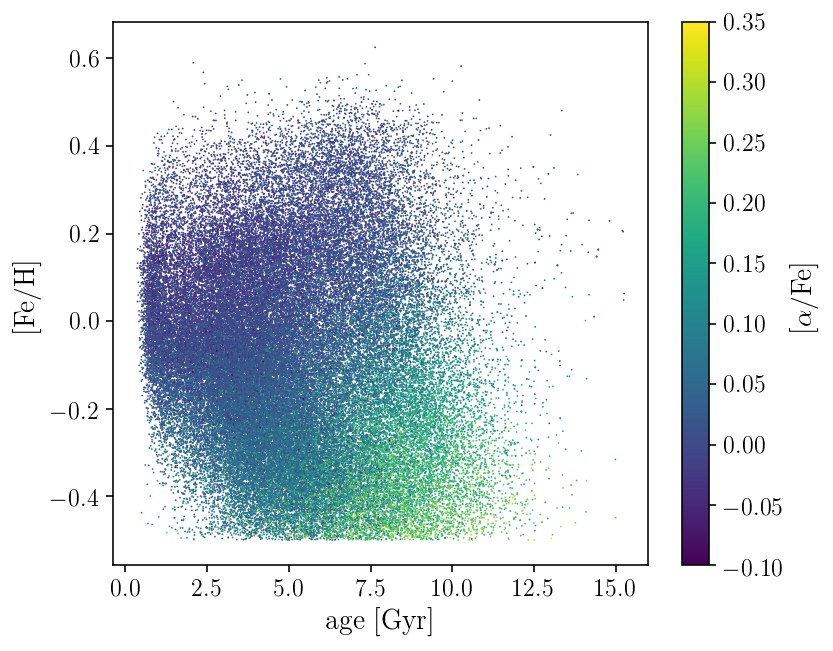

In [36]:


fig = plt.figure()
fig.set_size_inches(6,5)

plt.scatter((10**(dr14pred[:,3][mask]*10.))/1e9, apodat['FE_H'][test][mask], s=0.8, lw=0., c=apodat['AVG_ALPHAFE'][test][mask], vmin=-0.1, vmax=0.35)
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.colorbar(label=r'$\mathrm{[\alpha/Fe]}$')

(-0.1, 0.35)

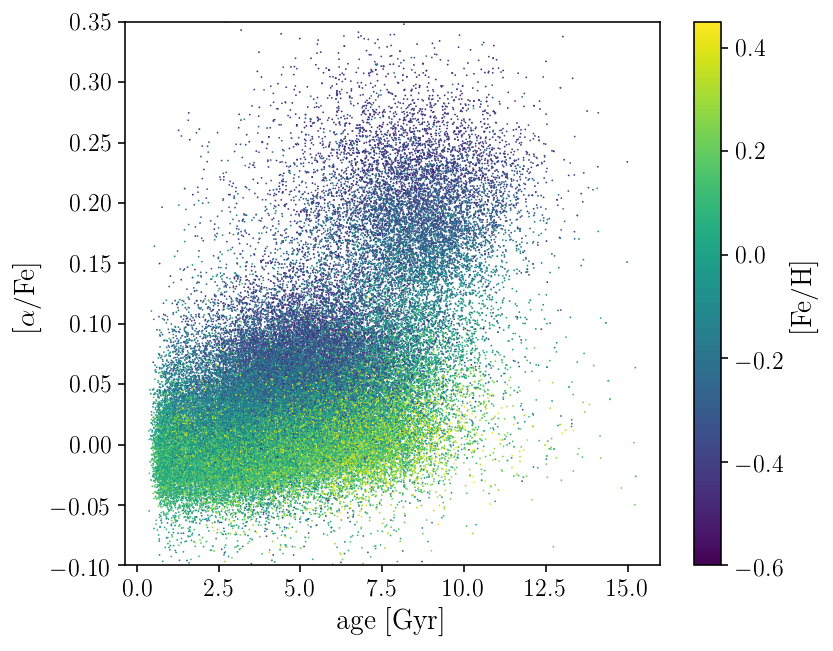

In [37]:

fig = plt.figure()
fig.set_size_inches(6,5)

plt.scatter((10**(dr14pred[:,3][mask]*10.))/1e9, apodat['AVG_ALPHAFE'][test][mask], s=0.8, lw=0., c=apodat['FE_H'][test][mask], vmin=-0.6, vmax=0.45)
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
plt.colorbar(label=r'$\mathrm{[Fe/H]}$')
plt.ylim(-0.1,0.35)



(array([ 7695., 14110., 19883., 16657., 12470.,  8310.,  3440.,   851.,
          142.,    26.]),
 array([ 0.37224372,  1.8595797 ,  3.34691568,  4.83425166,  6.32158764,
         7.80892362,  9.2962596 , 10.78359557, 12.27093155, 13.75826753,
        15.24560351]),
 <a list of 10 Patch objects>)

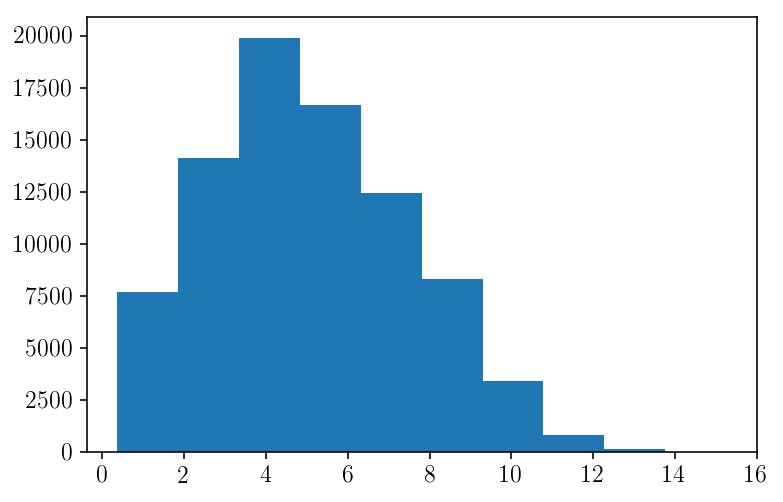

In [38]:
plt.hist((10**(dr14pred[:,3][mask]*10.))/1e9)

(-0.1, 0.35)

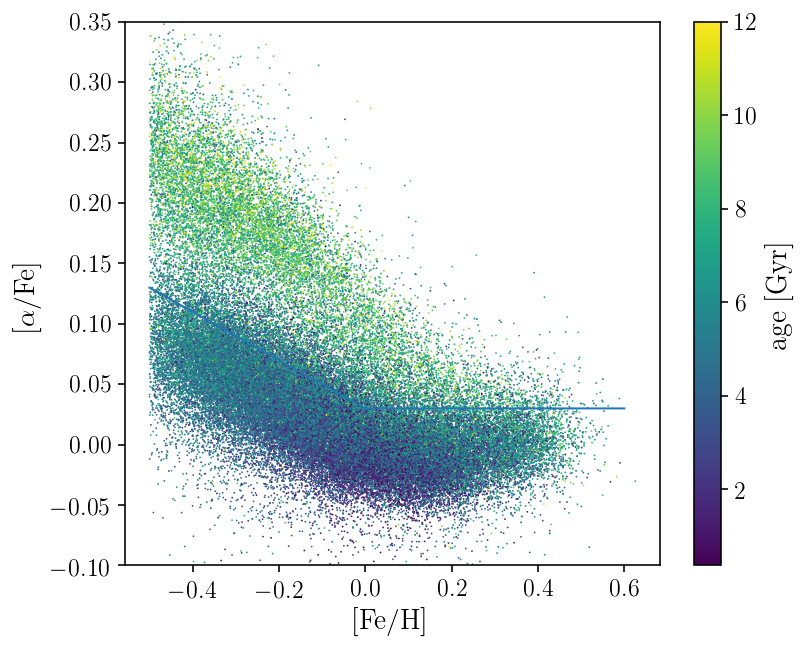

In [43]:

fig = plt.figure()
fig.set_size_inches(6,5)

plt.scatter(apodat['FE_H'][test][mask], apodat['AVG_ALPHAFE'][test][mask], s=0.8, lw=0., c=(10**(dr14pred[:,3][mask]*10.))/1e9, vmax=12.)
plt.xlabel(r'$\mathrm{[Fe/H]}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
plt.colorbar(label=r'$\mathrm{age\ [Gyr]}$')
plt.plot(np.linspace(-0.5,0.6,100), define_rgbtgassample.alphaedge(np.linspace(-0.5,0.6,100)))
plt.ylim(-0.1,0.35)



In [45]:
np.mean(apodat['MG_FE_ERR'][test][mask])

-0.21892843

In [150]:
astroNN_ages = np.ones(len(apodat))*np.nan
astroNN_ages[test] = (10**(dr14pred[:,3]*10.))/1e9
astroNN_Teff = np.ones(len(apodat))*np.nan
astroNN_Teff[test] = dr14pred[:,1]
astroNN_FeH = np.ones(len(apodat))*np.nan
astroNN_FeH[test] = dr14pred[:,0]
astroNN_Logg = np.ones(len(apodat))*np.nan
astroNN_Logg[test] = dr14pred[:,2]
arr = np.recarray(len(apodat), dtype=[('APOGEE_ID', '<U20'), ('astroNN_Age', np.float32), ('astroNN_TEFF', np.float32), ('astroNN_LOGG', np.float32), ('astroNN_FE_H', np.float32)])
arr['APOGEE_ID'] = apodat['APOGEE_ID']
arr['astroNN_Age'] = astroNN_ages
arr['astroNN_TEFF'] = astroNN_Teff
arr['astroNN_LOGG'] = astroNN_Logg
arr['astroNN_FE_H'] = astroNN_FeH

In [155]:
with open('../sav/astroNN_ages_APOKASCDR2.npy', 'wb') as f:
    np.save(f, arr)

(5200, 4200)

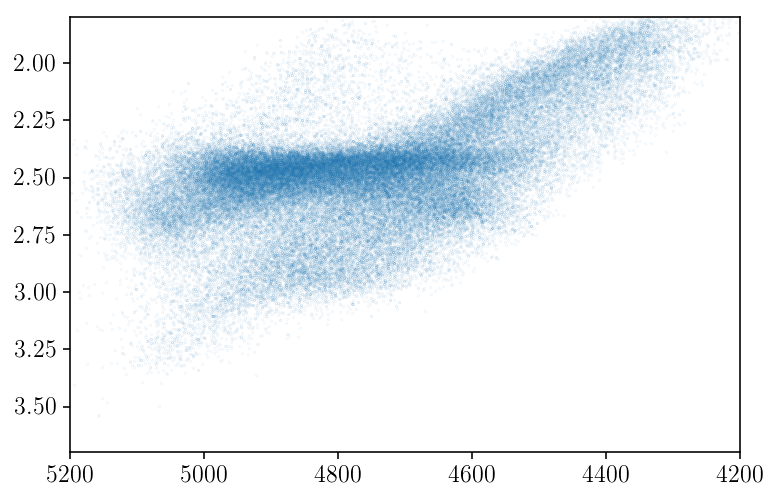

In [152]:
plt.scatter(arr['astroNN_TEFF'], arr['astroNN_LOGG'], s=0.001)
plt.ylim(3.7,1.8)
plt.xlim(5200,4200)

In [153]:
hdu = fits.BinTableHDU.from_columns(arr)

In [156]:
hdu.writeto('../sav/astroNN_ages_APOKASCDR2.fits')

(array([ 421.,  867., 1075.,  920.,  828.,  653.,  526.,  362.,  198.,
          70.]),
 array([ 0. ,  1.4,  2.8,  4.2,  5.6,  7. ,  8.4,  9.8, 11.2, 12.6, 14. ]),
 <a list of 10 Patch objects>)

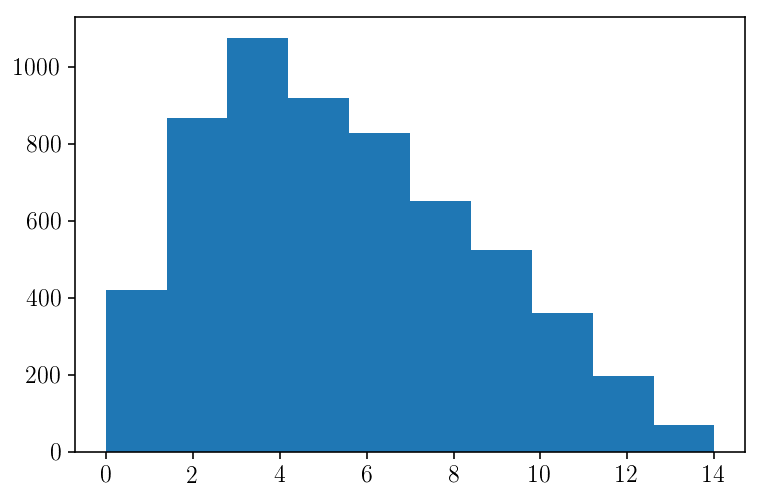

In [84]:
plt.hist(dat['age']/1e3, range=[0.,14.])

(-2.0, 0.5)

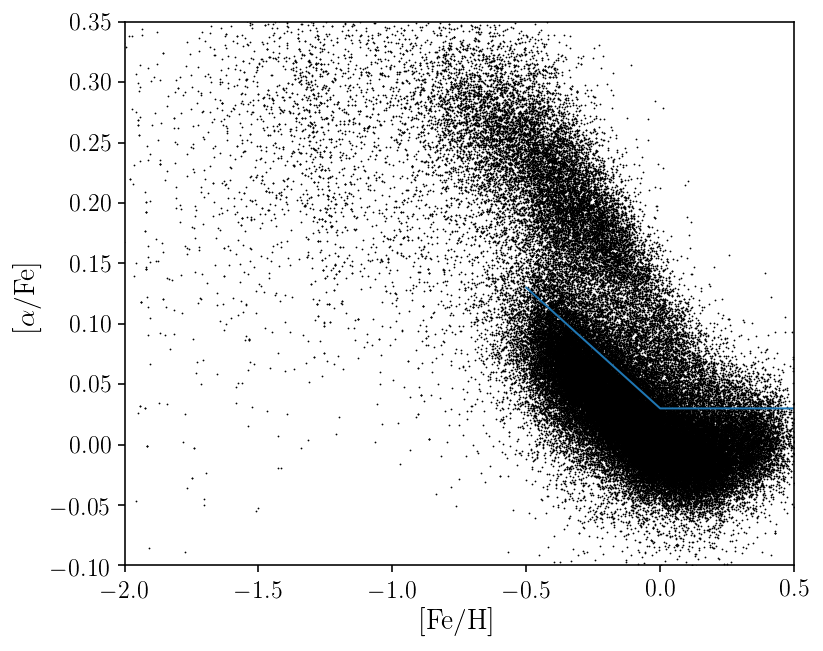

In [21]:
fig = plt.figure()
fig.set_size_inches(6,5)

plt.scatter(apodat['FE_H'], apodat['AVG_ALPHAFE'], s=0.8, lw=0., vmax=12., c='Black')
plt.xlabel(r'$\mathrm{[Fe/H]}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
plt.plot(np.linspace(-0.5,0.6,100), define_rgbtgassample.alphaedge(np.linspace(-0.5,0.6,100)))
plt.ylim(-0.1,0.35)
plt.xlim(-2.,0.5)

In [26]:
tdat = define_rgbtgassample.get_rgbtgassample(cuts = True, 
                      add_dist=True, 
                      add_ages=True,
                      rm_bad_dist=True,
                      notgas = True,
                      alternate_ages = True,
                      distkey='BPG_meandist', 
                      disterrkey='BPG_diststd')

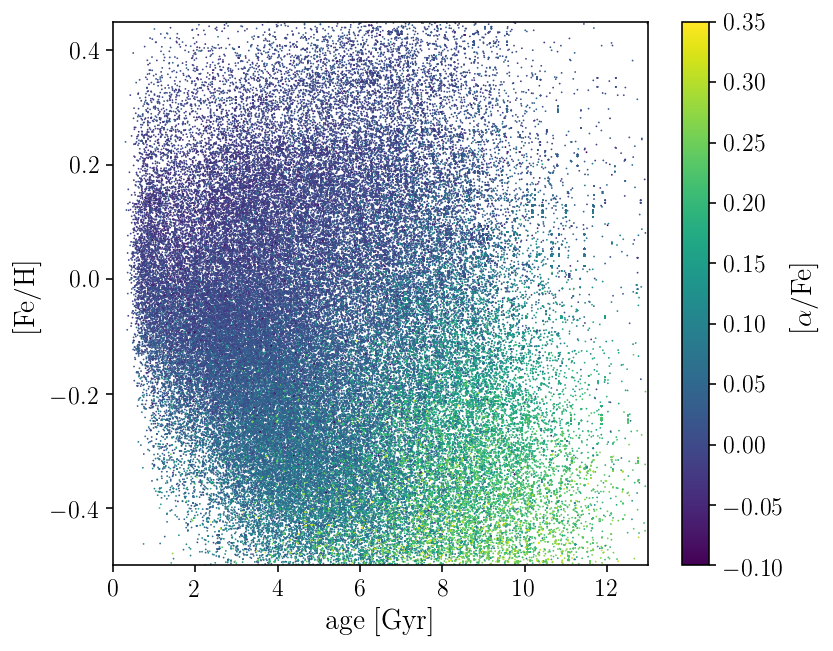

In [29]:

fig = plt.figure()
fig.set_size_inches(6,5)

plt.scatter(tdat['Age'], tdat['FE_H'], s=0.8, lw=0., c=tdat['AVG_ALPHAFE'], vmin=-0.1, vmax=0.35)
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.ylabel(r'$\mathrm{[Fe/H]}$')
plt.ylim(-0.5,0.45)
plt.xlim(0.,13.)
plt.colorbar(label=r'$\mathrm{[\alpha/Fe]}$')

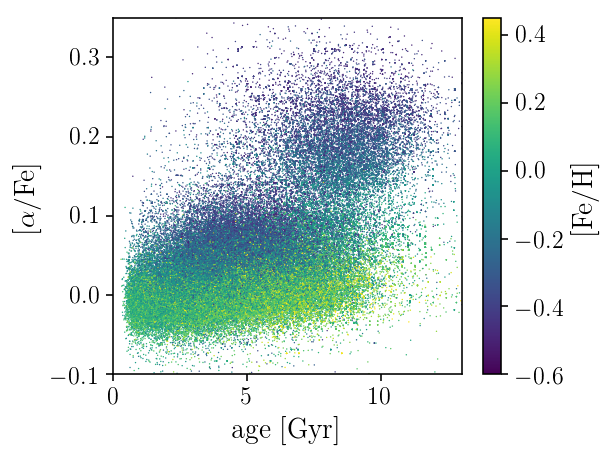

In [35]:

fig = plt.figure()
fig.set_size_inches(1.3*columnwidth,columnwidth)

mask = tdat['FE_H'] > -0.5
plt.scatter(tdat['Age'][mask], tdat['AVG_ALPHAFE'][mask], s=0.5, lw=0., c=tdat['FE_H'][mask], vmin=-0.6, vmax=0.45, rasterized=True)
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
plt.colorbar(label=r'$\mathrm{[Fe/H]}$')
plt.ylim(-0.1,0.35)
plt.xlim(0.,13.)
fig.tight_layout()
plt.savefig('../plots/age_alphafe_astroNN.pdf', format='pdf', dpi=400,  bbox_inches='tight')
plt.savefig('../plots/age_alphafe_astroNN.png', format='png', dpi=400,  bbox_inches='tight')




In [7]:
ages_tab

KEPLER_ID,massfin,e,e_1,radPhot,e_2,e_3,logg,e_4,e_5,age,e_6,e_7,LPhot,e_8,e_9
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
10000207,1.112794363,0.02600647643,0.03467530191,6.27342994,0.07125983231,0.08143980836,2.88775363,0.002031627451,0.003192557423,6767.736486,962.8378378,577.7027027,19.51362502,0.5878013436,0.6717729641
10000547,1.135810094,0.02740250769,0.02397719423,4.856779505,0.05354789017,0.05354789017,3.121888622,0.001769226288,0.002476916803,5501.673228,389.9606299,501.3779528,13.26705712,0.4309963705,0.3878967335
10001167,0.9496872764,0.07715943676,0.06613666008,12.81794721,0.3791179615,0.3520381071,2.197410465,0.009975434749,0.009975434749,10500.0,2600.0,2800.0,71.07739984,6.834902444,5.923582119
10001326,1.206478205,0.06152965605,0.04614724204,9.292570713,0.1921060237,0.1329964779,2.582892741,0.004556422007,0.005923348608,4876.768868,892.2169811,754.9528302,38.94406209,2.13741348,1.526723914
10001440,0.9325477338,0.05037225083,0.04197687569,8.460789005,0.1475538941,0.1475538941,2.552661861,0.006658699374,0.005548916145,10670.73171,2078.04878,1731.707317,33.95456467,1.703155602,1.419296335
10001796,1.146996627,0.08276305017,0.1079518046,10.82393505,0.3249774764,0.6319006486,2.428810645,0.01065227864,0.01193055207,5888.75,3422.5,1480.0,62.50695149,5.350888298,13.91230958
10001935,1.183793942,0.07025027237,0.07025027237,10.9583764,0.2953647805,0.2726444128,2.436604899,0.009888411773,0.01117820461,5087.822878,1529.151292,1092.250923,63.25749628,4.376246207,3.125890148
10002556,0.9772660541,0.07178317336,0.05640106478,10.49349133,0.3015533016,0.2369347369,2.380477489,0.01149640605,0.0102190276,11384.80392,2313.72549,2602.941176,54.61799498,2.914050049,2.311143143
10002647,1.361171078,0.04386176727,0.03837904636,11.13149714,0.1655868675,0.1082683364,2.482512072,0.005680548659,0.005186587906,2993.189018,403.5902851,294.9313622,65.84395379,3.418263885,2.197455355


In [11]:
np.arange(0,len(specs))

array([   0,    1,    2, ..., 5916, 5917, 5918])

In [28]:
test_inds = np.random.choice(np.arange(0,len(specs)),size=100)
test_mask = np.zeros(len(specs), dtype=bool)
test_mask[test_inds] = 1.

In [35]:
# import the neural net class from astroNN first
from astroNN.models import ApogeeBCNN

# astronn_neuralnet is an astroNN's neural network instance
# In this case, it is an instance of APOGEECNN
# set the label shape to 4 - tell it to do 100 epochs of training
astronn_neuralnet = ApogeeBCNN()
astronn_neuralnet.labels_shape = 4
astronn_neuralnet.autosave = False
astronn_neuralnet.batch_size = 64
astronn_neuralnet.initializer = 'he_normal'
astronn_neuralnet.activation = 'relu'
astronn_neuralnet.num_filters = [2, 4]
astronn_neuralnet.filter_len = 8
astronn_neuralnet.pool_length = 4
astronn_neuralnet.num_hidden = [196, 96]
astronn_neuralnet.max_epochs = 250
astronn_neuralnet.lr = 0.005
astronn_neuralnet.reduce_lr_epsilon = 0.00005
astronn_neuralnet.reduce_lr_min = 0.0000000001
astronn_neuralnet.reduce_lr_patience = 10
astronn_neuralnet.target = 'all'
astronn_neuralnet.l2 = 1e-7
astronn_neuralnet.dropout_rate = 0.2
astronn_neuralnet.length_scale = 0.1  # prior length scale
astronn_neuralnet.input_norm_mode = 1
astronn_neuralnet.labels_norm_mode = 2
# is this necessary?
astronn_neuralnet.targetname = ['age']

In [25]:
len(specs)

5919

In [33]:
ages = np.log10(dat['age'][good_data]*1e6)/10.
age_error = np.log10((dat['e_7'][good_data]+dat['e_6'][good_data])/2.*1e6)/10.
print(len(age_error[~np.isfinite(age_error)]))
age_error[~np.isfinite(age_error)] = 0.9

/home/astjmack/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log10
  

1


100
[ True]


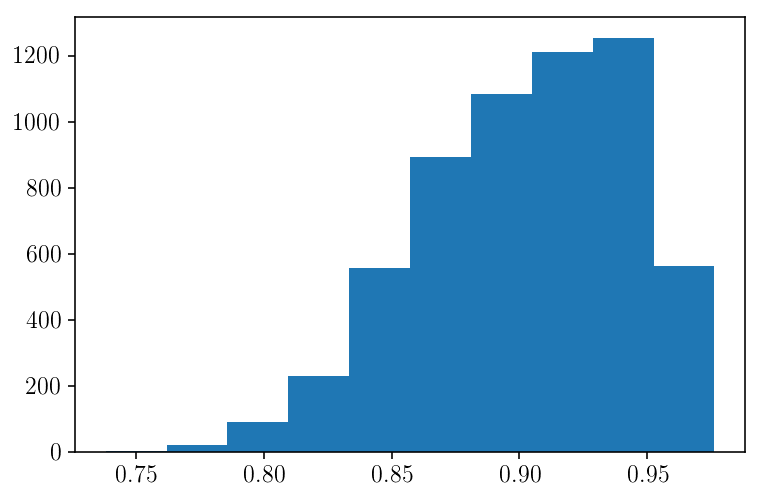

In [41]:
plt.hist(age_error)
print(len(ages[test_mask]))


In [30]:
#stack all the labels together for astroNN
out = np.dstack([dat['FE_H'][good_data], dat['TEFF_COR'][good_data], dat['LOGG_COR'][good_data], ages])[0]
out_err = np.dstack([dat['FE_H_ERR'][good_data], dat['TEFF_COR_ERR'][good_data], dat['LOGG_COR_ERR'][good_data], age_error])[0]

In [31]:
len(out)

5919

In [36]:
astronn_neuralnet.train(specs[~test_mask],out[~test_mask], errspecs[~test_mask],out_err[~test_mask])

Number of Training Data: 5238, Number of Validation Data: 581
====Message from Normalizer====
You selected mode: 1
Featurewise Center: False
Datawise Center: True
Featurewise std Center: False
Datawise std Center: True
====Message ends====
====Message from Normalizer====
You selected mode: 2
Featurewise Center: True
Datawise Center: False
Featurewise std Center: True
Datawise std Center: False
====Message ends====
Epoch 1/250
 - 12s - loss: nan - output_loss: nan - variance_output_loss: nan - output_mean_absolute_error: nan - val_loss: nan - val_output_loss: nan - val_variance_output_loss: nan - val_output_mean_absolute_error: nan
Epoch 2/250


KeyboardInterrupt: 

In [20]:
#generate predictions from trained model (save to file)
pred, pred_std = astronn_neuralnet.test(specs, errspecs)

with open('../sav/astroNN_Bayes_APOKASC_predictions.npy', 'wb') as f:
    np.save(f, pred)
    np.save(f, pred_std)

Starting Dropout Variational Inference
Completed 0 of 25 Monte Carlo Dropout, 0.00s elapsed
Completed 5 of 25 Monte Carlo Dropout, 17.51s elapsed
Completed 10 of 25 Monte Carlo Dropout, 34.32s elapsed
Completed 15 of 25 Monte Carlo Dropout, 50.85s elapsed
Completed 20 of 25 Monte Carlo Dropout, 67.55s elapsed
Completed Dropout Variational Inference, 84.26s in total


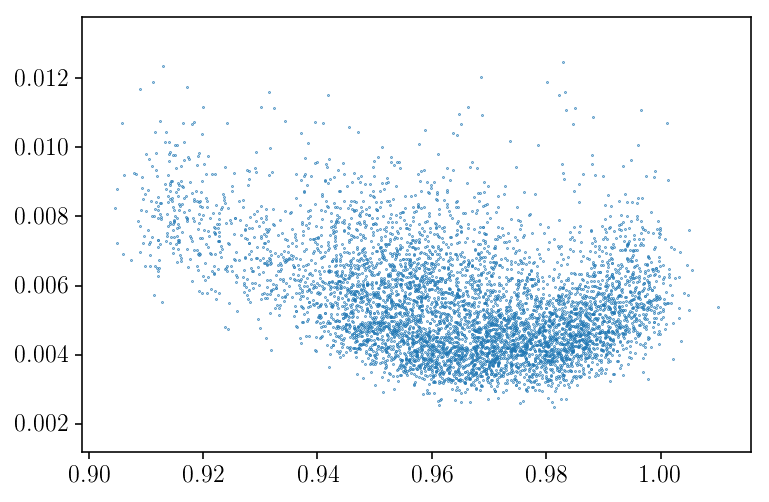

In [21]:
plt.scatter(pred[:,3],pred_std['total'][:,3], s=0.1)

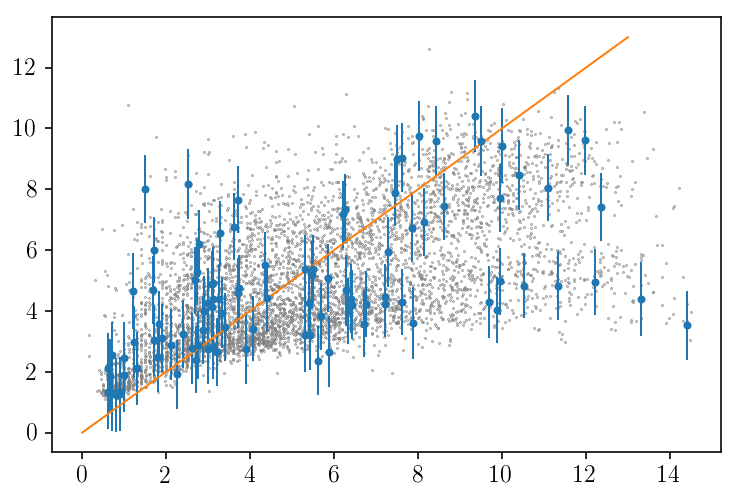

In [22]:
plt.scatter(10**(out[:,3]*10.)/1e9, 10**(pred[:,3]*10)/1e9, s=0.1, c='Gray')
plt.errorbar(10**(out[:,3][test_mask]*10.)/1e9, 10**(pred[:,3][test_mask]*10)/1e9, yerr=10**(pred_std['total'][:,3][test_mask]*10), fmt='.')
plt.plot(np.linspace(0.,13.,10),np.linspace(0.,13.,10))

In [83]:
10**(pred_std['total'][:,3]*10)/1e9

array([1.11947346e-09, 1.10686701e-09, 1.13408288e-09, 1.12365660e-09,
       1.09234972e-09, 1.16842750e-09, 1.11358100e-09, 1.10116483e-09,
       1.13608417e-09, 1.13626951e-09, 1.10045417e-09, 1.09023295e-09,
       1.13112868e-09, 1.20686316e-09, 1.13565455e-09, 1.16688877e-09,
       1.16311348e-09, 1.09641806e-09, 1.13875692e-09, 1.22591896e-09,
       1.15384592e-09, 1.10840765e-09, 1.15912491e-09, 1.08499086e-09,
       1.15116375e-09, 1.19277388e-09, 1.15146633e-09, 1.12335458e-09,
       1.08080538e-09, 1.17117364e-09, 1.17775202e-09, 1.14537950e-09,
       1.13770518e-09, 1.15422989e-09, 1.19955336e-09, 1.09120803e-09,
       1.19143430e-09, 1.17438650e-09, 1.10388503e-09, 1.11462338e-09,
       1.09682141e-09, 1.18120562e-09, 1.17865332e-09, 1.11882848e-09,
       1.20031860e-09, 1.17646903e-09, 1.16976602e-09, 1.12745794e-09,
       1.15585496e-09, 1.11213413e-09, 1.18279018e-09, 1.14852762e-09,
       1.10954207e-09, 1.14669245e-09, 1.09285580e-09, 1.19650746e-09,
      

/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



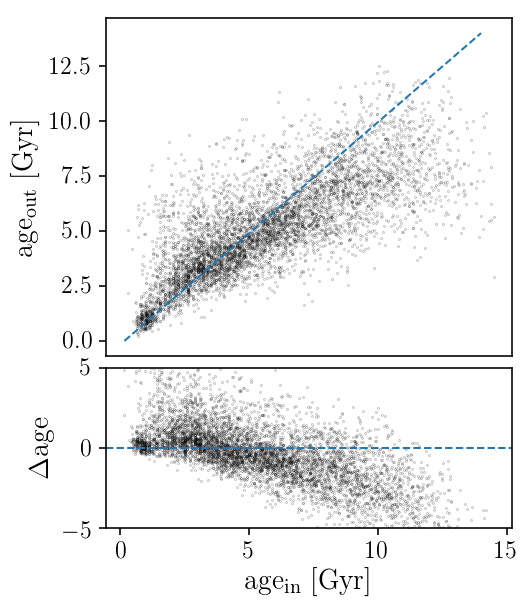

In [14]:
# plot the prediction vs the training set
fig = plt.figure()
fig.set_size_inches(columnwidth,1.2*columnwidth)
ax = fig.add_axes([0.1,0.4,0.85,0.59])
ax1 = fig.add_axes([0.1,0.1,0.85,0.28])
ax.scatter(out[:,3]/1e3,pred[:,3]/1e3, s=0.01, color='Black', rasterized=True)
ax.plot([0.,14.], [0.,14.], linestyle='dashed')
ax.set_ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
ax.set_xticks([])
ax1.scatter(out[:,3]/1e3,(pred[:,3]-out[:,3])/1e3, s=0.01, color='Black', rasterized=True)
ax1.axhline(0., linestyle='dashed')
ax1.set_ylabel(r'$\Delta\mathrm{age}$')
ax1.set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax1.set_ylim(-5,5)
fig.tight_layout()
plt.savefig('../plots/astroNNbayes_agein_ageout.pdf', format='pdf', dpi=400, bbox_inches='tight')
plt.savefig('../plots/astroNNbayes_agein_ageout.png', format='png', dpi=400,  bbox_inches='tight')




In [33]:
age_error = dat['e_6'][good_data]+dat['e_7'][good_data]


np.log10(age_error*1e6)

/home/astjmack/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.



array([9.74085039, 9.22894357, 9.70822056, ..., 9.96460096, 9.59139525,
       9.69314046])

In [20]:
np.log10(ages*1e6)

array([10.05738614,  9.73381071, 10.06603496, ...,  9.93445492,
        9.92545506,  9.51149016])

In [32]:
dat['e_7'][good_data][dat['e_6'][good_data] < 0]

array([950.])

In [30]:
dat['e_6'][good_data][dat['e_6'][good_data] < 0]

array([-950.])

In [3]:
from astroNN.datasets import H5Loader

In [43]:
loader = H5Loader('datasets.h5')
loader2.load_combined = True
loader2.load_err = True
x_train, y_train, x_err, y_err = loader.load()

FileNotFoundError: Cannot find /gal/GAIA/monoage-velocity-dispersion/py/datasets.h5

In [2]:
from astroNN.datasets import H5Compiler

# To create a astroNN compiler instance
compiler = H5Compiler()

# To set the name of the resulting h5 datasets, here a 'test.h5' will be created
compiler.filename = 'test'

 # Gaia DR to use, Default is 1
compiler.starflagcut = False  # True to filter out ASPCAP star flagged spectra
compiler.aspcapflagcut = False  # True to filter out ASPCAP flagged spectra
compiler.vscattercut = 1  # Upper bound of velocity scattering
compiler.teff_high = 9000  # Upper bound of SNR
compiler.teff_low = 2000  # Lower bound of SNR
compiler.SNR_low = 80  # Lower bound of SNR
compiler.SNR_high = 99999  # Upper bound of SNR
compiler.use_esa_gaia = False
compiler.ironlow = -3  # Lower bound of SNR # Filename of the resulting .h5 file
compiler.spectra_only = False  # True to include spectra only without any aspcap abundances
compiler.cont_mask = None  # True to use Anderson et al 2017 parallax, **if use_esa_gaia is True, ESA Gaia will has priority**
compiler.err_info = True  # Whether to include error information in h5 dataset
compiler.continuum = True

In [11]:
# To compile a .h5 datasets, use .compile() method
compiler.compile()

dr is not provided, using default dr=14
/gal/sdss_lsm/dr14/apogee/spectro/redux/r8/stars/l31c/l31c.2/allStar-l31c.2.fits was found!
Loading allStar DR14 catalog
Total Combined Spectra after filtering:  183292
Total Individual Visit Spectra there:  627188
Completed 1 of 183292, 0.48s elapsed
Completed 101 of 183292, 6.24s elapsed
Completed 201 of 183292, 12.48s elapsed
Completed 301 of 183292, 18.08s elapsed
Completed 401 of 183292, 24.06s elapsed
Completed 501 of 183292, 29.69s elapsed
Completed 601 of 183292, 35.87s elapsed
Completed 701 of 183292, 41.64s elapsed
Completed 801 of 183292, 47.89s elapsed
Completed 901 of 183292, 54.28s elapsed
Completed 1001 of 183292, 60.47s elapsed
Completed 1101 of 183292, 67.13s elapsed
Completed 1201 of 183292, 73.53s elapsed
Completed 1301 of 183292, 80.00s elapsed
Completed 1401 of 183292, 86.74s elapsed
Completed 1501 of 183292, 92.90s elapsed
Completed 1601 of 183292, 99.38s elapsed
Completed 1701 of 183292, 106.09s elapsed
Completed 1801 of 18

Completed 18301 of 183292, 1083.89s elapsed
Completed 18401 of 183292, 1089.88s elapsed
Completed 18501 of 183292, 1095.16s elapsed
Completed 18601 of 183292, 1101.10s elapsed
Completed 18701 of 183292, 1106.99s elapsed
Completed 18801 of 183292, 1112.81s elapsed
Completed 18901 of 183292, 1118.64s elapsed
Completed 19001 of 183292, 1124.54s elapsed
Completed 19101 of 183292, 1130.50s elapsed
Completed 19201 of 183292, 1136.59s elapsed
Completed 19301 of 183292, 1142.27s elapsed
Completed 19401 of 183292, 1148.38s elapsed
Completed 19501 of 183292, 1154.38s elapsed
Completed 19601 of 183292, 1160.09s elapsed
Completed 19701 of 183292, 1165.72s elapsed
Completed 19801 of 183292, 1171.49s elapsed
Completed 19901 of 183292, 1177.72s elapsed
Completed 20001 of 183292, 1183.95s elapsed
Completed 20101 of 183292, 1190.27s elapsed
Completed 20201 of 183292, 1196.36s elapsed
Completed 20301 of 183292, 1202.32s elapsed
Completed 20401 of 183292, 1208.93s elapsed
Completed 20501 of 183292, 1215.

Completed 37001 of 183292, 2215.72s elapsed
Completed 37101 of 183292, 2222.06s elapsed
Completed 37201 of 183292, 2228.07s elapsed
Completed 37301 of 183292, 2234.52s elapsed
Completed 37401 of 183292, 2240.72s elapsed
Completed 37501 of 183292, 2246.31s elapsed
Completed 37601 of 183292, 2252.32s elapsed
Completed 37701 of 183292, 2258.52s elapsed
Completed 37801 of 183292, 2264.81s elapsed
Completed 37901 of 183292, 2270.87s elapsed
Completed 38001 of 183292, 2277.02s elapsed
Completed 38101 of 183292, 2282.76s elapsed
Completed 38201 of 183292, 2289.02s elapsed
Completed 38301 of 183292, 2294.61s elapsed
Completed 38401 of 183292, 2300.10s elapsed
Completed 38501 of 183292, 2306.22s elapsed
Completed 38601 of 183292, 2311.93s elapsed
Completed 38701 of 183292, 2317.72s elapsed
Completed 38801 of 183292, 2323.32s elapsed
Completed 38901 of 183292, 2329.14s elapsed
Completed 39001 of 183292, 2335.10s elapsed
Completed 39101 of 183292, 2340.78s elapsed
Completed 39201 of 183292, 2346.

Completed 55701 of 183292, 3333.29s elapsed
Completed 55801 of 183292, 3338.70s elapsed
Completed 55901 of 183292, 3344.30s elapsed
Completed 56001 of 183292, 3349.94s elapsed
Completed 56101 of 183292, 3355.77s elapsed
Completed 56201 of 183292, 3361.95s elapsed
Completed 56301 of 183292, 3369.58s elapsed
Completed 56401 of 183292, 3377.54s elapsed
Completed 56501 of 183292, 3383.16s elapsed
Completed 56601 of 183292, 3388.99s elapsed
Completed 56701 of 183292, 3394.91s elapsed
Completed 56801 of 183292, 3400.84s elapsed
Completed 56901 of 183292, 3406.13s elapsed
Completed 57001 of 183292, 3412.09s elapsed
Completed 57101 of 183292, 3417.90s elapsed
Completed 57201 of 183292, 3423.68s elapsed
Completed 57301 of 183292, 3429.22s elapsed
Completed 57401 of 183292, 3435.14s elapsed
Completed 57501 of 183292, 3440.70s elapsed
Completed 57601 of 183292, 3446.38s elapsed
Completed 57701 of 183292, 3452.24s elapsed
Completed 57801 of 183292, 3457.84s elapsed
Completed 57901 of 183292, 3463.

Completed 74001 of 183292, 4377.15s elapsed
Completed 74101 of 183292, 4384.00s elapsed
Completed 74201 of 183292, 4390.69s elapsed
Completed 74301 of 183292, 4397.36s elapsed
Completed 74401 of 183292, 4405.10s elapsed
Completed 74501 of 183292, 4412.18s elapsed
Completed 74601 of 183292, 4418.66s elapsed
Completed 74701 of 183292, 4425.09s elapsed
Completed 74801 of 183292, 4432.38s elapsed
Completed 74901 of 183292, 4441.03s elapsed
Completed 75001 of 183292, 4448.93s elapsed
Completed 75101 of 183292, 4456.38s elapsed
Completed 75201 of 183292, 4462.37s elapsed
Completed 75301 of 183292, 4468.10s elapsed
Completed 75401 of 183292, 4474.30s elapsed
Completed 75501 of 183292, 4480.03s elapsed
Completed 75601 of 183292, 4484.28s elapsed
Completed 75701 of 183292, 4488.73s elapsed
Completed 75801 of 183292, 4493.12s elapsed
Completed 75901 of 183292, 4497.61s elapsed
Completed 76001 of 183292, 4502.34s elapsed
Completed 76101 of 183292, 4507.09s elapsed
Completed 76201 of 183292, 4511.

Completed 92701 of 183292, 5361.11s elapsed
Completed 92801 of 183292, 5366.74s elapsed
Completed 92901 of 183292, 5372.20s elapsed
Completed 93001 of 183292, 5377.66s elapsed
Completed 93101 of 183292, 5383.34s elapsed
Completed 93201 of 183292, 5388.53s elapsed
Completed 93301 of 183292, 5394.02s elapsed
Completed 93401 of 183292, 5399.71s elapsed
Completed 93501 of 183292, 5404.99s elapsed
Completed 93601 of 183292, 5410.24s elapsed
Completed 93701 of 183292, 5415.59s elapsed
Completed 93801 of 183292, 5421.02s elapsed
Completed 93901 of 183292, 5426.15s elapsed
Completed 94001 of 183292, 5431.44s elapsed
Completed 94101 of 183292, 5436.59s elapsed
Completed 94201 of 183292, 5441.72s elapsed
Completed 94301 of 183292, 5446.79s elapsed
Completed 94401 of 183292, 5451.70s elapsed
Completed 94501 of 183292, 5456.10s elapsed
Completed 94601 of 183292, 5461.73s elapsed
Completed 94701 of 183292, 5467.93s elapsed
Completed 94801 of 183292, 5474.36s elapsed
Completed 94901 of 183292, 5480.

Completed 111101 of 183292, 6330.03s elapsed
Completed 111201 of 183292, 6334.55s elapsed
Completed 111301 of 183292, 6339.10s elapsed
Completed 111401 of 183292, 6343.78s elapsed
Completed 111501 of 183292, 6347.78s elapsed
Completed 111601 of 183292, 6351.46s elapsed
Completed 111701 of 183292, 6355.38s elapsed
Completed 111801 of 183292, 6359.27s elapsed
Completed 111901 of 183292, 6363.02s elapsed
Completed 112001 of 183292, 6366.79s elapsed
Completed 112101 of 183292, 6370.28s elapsed
Completed 112201 of 183292, 6373.69s elapsed
Completed 112301 of 183292, 6377.60s elapsed
Completed 112401 of 183292, 6381.26s elapsed
Completed 112501 of 183292, 6385.21s elapsed
Completed 112601 of 183292, 6389.04s elapsed
Completed 112701 of 183292, 6392.90s elapsed
Completed 112801 of 183292, 6397.02s elapsed
Completed 112901 of 183292, 6400.93s elapsed
Completed 113001 of 183292, 6405.24s elapsed
Completed 113101 of 183292, 6409.53s elapsed
Completed 113201 of 183292, 6413.94s elapsed
Completed 

Completed 129401 of 183292, 7203.90s elapsed
Completed 129501 of 183292, 7207.93s elapsed
Completed 129601 of 183292, 7211.99s elapsed
Completed 129701 of 183292, 7216.30s elapsed
Completed 129801 of 183292, 7220.35s elapsed
Completed 129901 of 183292, 7224.42s elapsed
Completed 130001 of 183292, 7228.71s elapsed
Completed 130101 of 183292, 7232.95s elapsed
Completed 130201 of 183292, 7237.13s elapsed
Completed 130301 of 183292, 7241.31s elapsed
Completed 130401 of 183292, 7245.72s elapsed
Completed 130501 of 183292, 7250.34s elapsed
Completed 130601 of 183292, 7254.63s elapsed
Completed 130701 of 183292, 7259.07s elapsed
Completed 130801 of 183292, 7263.78s elapsed
Completed 130901 of 183292, 7268.34s elapsed
Completed 131001 of 183292, 7273.06s elapsed
Completed 131101 of 183292, 7277.82s elapsed
Completed 131201 of 183292, 7282.60s elapsed
Completed 131301 of 183292, 7287.36s elapsed
Completed 131401 of 183292, 7292.04s elapsed
Completed 131501 of 183292, 7296.76s elapsed
Completed 

Completed 147701 of 183292, 8079.59s elapsed
Completed 147801 of 183292, 8084.82s elapsed
Completed 147901 of 183292, 8089.57s elapsed
Completed 148001 of 183292, 8094.45s elapsed
Completed 148101 of 183292, 8099.55s elapsed
Completed 148201 of 183292, 8104.25s elapsed
Completed 148301 of 183292, 8109.43s elapsed
Completed 148401 of 183292, 8114.33s elapsed
Completed 148501 of 183292, 8119.26s elapsed
Completed 148601 of 183292, 8124.40s elapsed
Completed 148701 of 183292, 8129.36s elapsed
Completed 148801 of 183292, 8134.02s elapsed
Completed 148901 of 183292, 8139.18s elapsed
Completed 149001 of 183292, 8144.45s elapsed
Completed 149101 of 183292, 8149.61s elapsed
Completed 149201 of 183292, 8154.87s elapsed
Completed 149301 of 183292, 8159.88s elapsed
Completed 149401 of 183292, 8164.96s elapsed
Completed 149501 of 183292, 8169.91s elapsed
Completed 149601 of 183292, 8175.11s elapsed
Completed 149701 of 183292, 8180.63s elapsed
Completed 149801 of 183292, 8185.50s elapsed
Completed 

Completed 166001 of 183292, 9019.66s elapsed
Completed 166101 of 183292, 9024.95s elapsed
Completed 166201 of 183292, 9030.15s elapsed
Completed 166301 of 183292, 9035.63s elapsed
Completed 166401 of 183292, 9040.67s elapsed
Completed 166501 of 183292, 9045.58s elapsed
Completed 166601 of 183292, 9050.56s elapsed
Completed 166701 of 183292, 9055.49s elapsed
Completed 166801 of 183292, 9060.76s elapsed
Completed 166901 of 183292, 9066.54s elapsed
Completed 167001 of 183292, 9072.46s elapsed
Completed 167101 of 183292, 9077.95s elapsed
Completed 167201 of 183292, 9083.61s elapsed
Completed 167301 of 183292, 9089.33s elapsed
Completed 167401 of 183292, 9094.86s elapsed
Completed 167501 of 183292, 9100.16s elapsed
Completed 167601 of 183292, 9105.39s elapsed
Completed 167701 of 183292, 9110.38s elapsed
Completed 167801 of 183292, 9115.19s elapsed
Completed 168001 of 183292, 9125.20s elapsed
Completed 168101 of 183292, 9130.23s elapsed
Completed 168201 of 183292, 9135.25s elapsed
Completed 

In [3]:
from astroNN.datasets import H5Loader

loader = H5Loader('test.h5')
loader.load_err = True  # load error info too
x, y, x_err, y_err = loader.load()

In [4]:
allstar = compiler.load_allstar()
indices = compiler.filter_apogeeid_list(allstar)

dr is not provided, using default dr=14
/gal/sdss_lsm/dr14/apogee/spectro/redux/r8/stars/l31c/l31c.2/allStar-l31c.2.fits was found!
Loading allStar DR14 catalog
Total Combined Spectra after filtering:  183292
Total Individual Visit Spectra there:  627188


In [7]:
from astropy.io import ascii
path = '/gal/astjmack/apogee/catalogues/APOKASC_cat_v4.4.2.fits'
napokasc = fits.open(path)

ndata = napokasc[1].data

In [8]:
t_ids = allstar[1].data['APOGEE_ID'][indices]
astroNNind = np.arange(0,len(t_ids))
ind_array = np.recarray(len(t_ids), dtype=[('2MASS_ID', '<U20'), ('astroNNindex', np.int32)])
ind_array['2MASS_ID'] = t_ids
ind_array['astroNNindex'] = astroNNind
victor_tab = Table(data=dat)
ids_tab = Table(data=ind_array)
#join victor with APOKASC
tab = join(victor_tab, ids_tab, keys='2MASS_ID', uniq_col_name='{col_name}{table_name}', table_names=['','2'])
indexed_dat = tab.as_array()


from astroNN.datasets import xmatch
ra = loader.load_entry('RA')
dec = loader.load_entry('DEC')
ra_age = ndata['RA']
dec_age = ndata['DEC']
idx_1, idx_2, sep = xmatch(ra, ra_age, colRA1=ra, colDec1=dec, colRA2=ra_age, colDec2=dec_age, swap=True)


IndexError: index 5796 is out of bounds for axis 1 with size 5766

In [11]:
test_spec = x[idx_1]
test_errspec = x_err[idx_1]

test_out = y[idx_1]
test_outerr  = y_err[idx_1]

test_out = np.append(ages.reshape(len(ages),1),test_out, axis=1)
test_outerr = np.append(age_error.reshape(len(ages),1),test_outerr, axis=1)

print(np.shape(test_out))

(16043, 26)


In [12]:
len(ndata)

18333

In [16]:
from astroNN.models import ApogeeBCNN
# And then create an instance of Bayesian Convolutional Neural Network class
bcnn_net = ApogeeBCNN()

# You don't have to specify the task because its 'regression' by default. But if you are doing classification. you can set task='classification'
bcnn_net.task = 'regression'
bcnn_net.labels_shape=26
bcnn_net.num_hidden = [128,64]
bcnn_net.batch_size = 32

# Set max_epochs to 10 for a quick result. You should train more epochs normally, especially with dropout
bcnn_net.max_epochs = 60
#bcnn_net.train(x_train, y_train, x_err, y_err)

Using TensorFlow backend.


In [10]:
ages = ndata['APOKASC2_AGE'][idx_2]#/1e3
age_error = ndata['APOKASC2_AGE_MERR'][idx_2]#(dat['e_6'][idx_2]+dat['e_7'][idx_2])/1e3 #presume gaussian
#age_error[age_error < 0.] = 0.01
#stack all the labels together for astroNN
out = np.dstack([indexed_dat['FE_H'], indexed_dat['TEFF_COR'], indexed_dat['LOGG_COR'], ages])[0]
out_err = np.dstack([indexed_dat['FE_H_ERR'], indexed_dat['TEFF_COR_ERR'], indexed_dat['LOGG_COR_ERR'], age_error])[0]

ValueError: all the input array dimensions except for the concatenation axis must match exactly

(array([ 477., 1955., 1406.,  840.,  547.,  272.,  100.,   51.,   19.,
          23.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <a list of 10 Patch objects>)

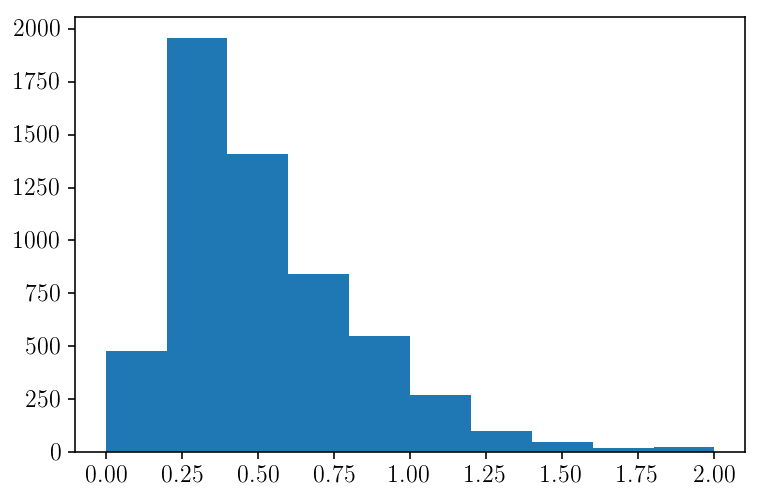

In [339]:
plt.hist(age_error/ages, range=[0.,2.])

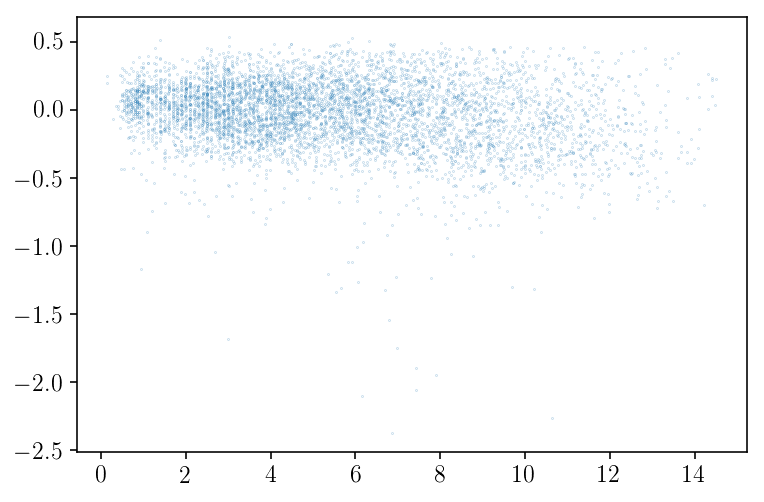

In [340]:
plt.scatter(test_out[:,0], test_out[:,3], s=0.01)

In [13]:
mask = np.all(np.isfinite(test_out), axis=1) & np.all(np.isfinite(test_outerr), axis=1) & (test_out[:,3] > -0.5) & (test_out[:,0] != -9999.)
sum(mask)

6087

In [14]:
test_inds = np.random.choice(np.arange(0,len(test_spec)),size=500, replace=False)
test_mask = np.zeros(len(test_spec), dtype=bool)
test_mask[test_inds] = 1.
print(sum(test_mask))

500


In [17]:
bcnn_net.train(test_spec[~test_mask&mask],test_out[~test_mask&mask], test_errspec[~test_mask&mask], test_outerr[~test_mask&mask]) #, test_errspec[mask],out_err[mask])

Number of Training Data: 5311, Number of Validation Data: 590
====Message from Normalizer====
You selected mode: 3
Featurewise Center: True
Datawise Center: False
Featurewise std Center: False
Datawise std Center: False
====Message ends====
====Message from Normalizer====
You selected mode: 2
Featurewise Center: True
Datawise Center: False
Featurewise std Center: True
Datawise std Center: False
====Message ends====
/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)

Instructions for updating:
`NHWC` for data_format is deprecated, use `NWC` instead
Epoch 1/60
 - 13s - loss: 0.1698 - output_loss: 0.1695 - variance_output_loss: 0.1695 - output_mean_absolute_error: 0.5792 - val_loss: -1.9240e-01 - val_output_loss: -1.9265e-01 - val_variance_output_l

Epoch 27/60
 - 11s - loss: -7.5777e-01 - output_loss: -7.5808e-01 - variance_output_loss: -7.5808e-01 - output_mean_absolute_error: 0.2504 - val_loss: -6.6674e-01 - val_output_loss: -6.6705e-01 - val_variance_output_loss: -6.6705e-01 - val_output_mean_absolute_error: 0.2560
Epoch 28/60
 - 11s - loss: -7.6187e-01 - output_loss: -7.6218e-01 - variance_output_loss: -7.6218e-01 - output_mean_absolute_error: 0.2478 - val_loss: -6.6823e-01 - val_output_loss: -6.6854e-01 - val_variance_output_loss: -6.6854e-01 - val_output_mean_absolute_error: 0.2518
Epoch 29/60
 - 11s - loss: -7.6224e-01 - output_loss: -7.6255e-01 - variance_output_loss: -7.6255e-01 - output_mean_absolute_error: 0.2484 - val_loss: -6.9523e-01 - val_output_loss: -6.9554e-01 - val_variance_output_loss: -6.9554e-01 - val_output_mean_absolute_error: 0.2500

Epoch 00029: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
Epoch 30/60
 - 11s - loss: -7.6328e-01 - output_loss: -7.6359e-01 - variance_output_loss: -7.6


Epoch 00053: ReduceLROnPlateau reducing learning rate to 1.525878978725359e-08.
Epoch 54/60
 - 11s - loss: -7.6877e-01 - output_loss: -7.6908e-01 - variance_output_loss: -7.6908e-01 - output_mean_absolute_error: 0.2468 - val_loss: -6.6045e-01 - val_output_loss: -6.6076e-01 - val_variance_output_loss: -6.6076e-01 - val_output_mean_absolute_error: 0.2509
Epoch 55/60
 - 11s - loss: -7.6895e-01 - output_loss: -7.6926e-01 - variance_output_loss: -7.6926e-01 - output_mean_absolute_error: 0.2467 - val_loss: -7.4658e-01 - val_output_loss: -7.4689e-01 - val_variance_output_loss: -7.4689e-01 - val_output_mean_absolute_error: 0.2490

Epoch 00055: ReduceLROnPlateau reducing learning rate to 1e-08.
Epoch 56/60
 - 11s - loss: -7.6626e-01 - output_loss: -7.6657e-01 - variance_output_loss: -7.6657e-01 - output_mean_absolute_error: 0.2479 - val_loss: -7.0967e-01 - val_output_loss: -7.0998e-01 - val_variance_output_loss: -7.0998e-01 - val_output_mean_absolute_error: 0.2502
Epoch 57/60
 - 11s - loss: -7

In [18]:
#generate predictions from trained model (save to file)
pred, pred_std = bcnn_net.test(test_spec, test_errspec)

with open('../sav/astroNN_Bayes_APOKASC_predictions.npy', 'wb') as f:
    np.save(f, pred)
    np.save(f, pred_std)

Starting Dropout Variational Inference
Completed 0 of 25 Monte Carlo Dropout, 0.00s elapsed
Completed 5 of 25 Monte Carlo Dropout, 48.65s elapsed
Completed 10 of 25 Monte Carlo Dropout, 96.97s elapsed
Completed 15 of 25 Monte Carlo Dropout, 145.22s elapsed
Completed 20 of 25 Monte Carlo Dropout, 194.03s elapsed
Completed Dropout Variational Inference, 242.30s in total


(0.0, 14.0)

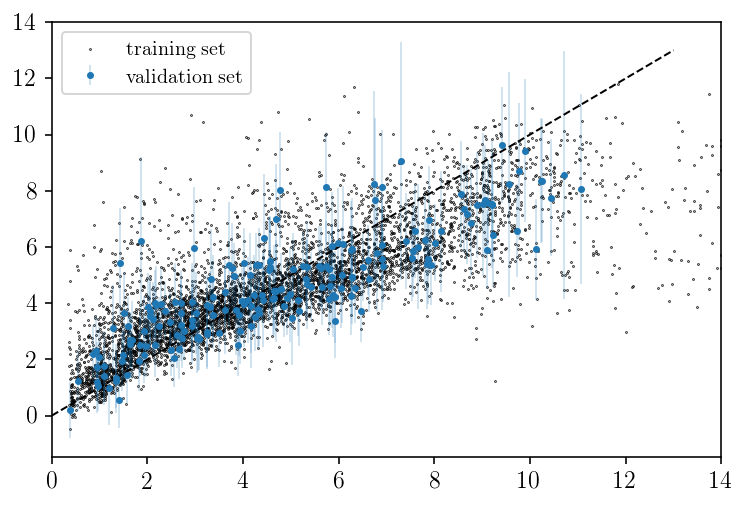

In [19]:
i = 0
plt.scatter(test_out[:,i][mask], pred[:,i][mask], s=0.1, c='Black', label=r'$\mathrm{training\ set}$')
plt.errorbar(test_out[:,i][mask&test_mask], pred[:,i][mask&test_mask], yerr=pred_std['total'][:,i][mask&test_mask], fmt='.', ms=5., label=r'$\mathrm{validation\ set}$', elinewidth=0.2)
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)
plt.plot(np.linspace(0.,13.,10),np.linspace(0.,13.,10), color='Black', linestyle='dashed')
plt.legend()
plt.xlim(0.,14.)

/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



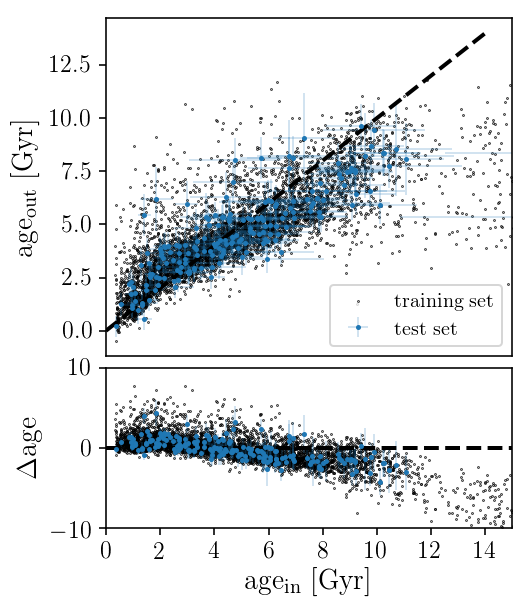

In [23]:
# plot the prediction vs the training set
fig = plt.figure()
fig.set_size_inches(columnwidth,1.2*columnwidth)
ax = fig.add_axes([0.1,0.4,0.85,0.59])
ax1 = fig.add_axes([0.1,0.1,0.85,0.28])
ax.scatter(test_out[:,i][mask], pred[:,i][mask], s=0.1, c='Black', label=r'$\mathrm{training\ set}$',rasterized=True)
ax.errorbar(test_out[:,i][mask&test_mask], pred[:,i][mask&test_mask], yerr=pred_std['total'][:,i][mask&test_mask]/2., xerr=test_outerr[:,i][mask&test_mask], fmt='.', ms=3., label=r'$\mathrm{test\ set}$', elinewidth=0.2,)
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)
ax.plot([0.,14.], [0.,14.], linestyle='dashed', color='Black', linewidth=2.)
ax.legend()
ax.set_ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
ax.set_xticks([])
ax1.scatter(test_out[:,0][mask], (pred[:,0][mask]-test_out[:,0][mask]), s=0.1, color='Black', rasterized=True)
ax1.errorbar(test_out[:,0][mask&test_mask], (pred[:,0][mask&test_mask]-test_out[:,0][mask&test_mask]),yerr=np.sqrt((pred_std['total'][:,i][mask&test_mask]/2.)**2+(test_outerr[:,i][mask&test_mask])**2), fmt='.', ms=3., label=r'$\mathrm{test\ set}$', elinewidth=0.2,)
ax1.axhline(0., linestyle='dashed',color='Black', linewidth=2.)
ax1.set_ylabel(r'$\Delta\mathrm{age}$')
ax1.set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax1.set_ylim(-10,10)
fig.tight_layout()
ax.set_xlim(0.,15,)
ax1.set_xlim(0.,15.)
ax1.set_xticks([0.,2.,4.,6.,8.,10.,12.,14.])
plt.savefig('../plots/astroNNbayes_agein_ageout.pdf', format='pdf', dpi=400, bbox_inches='tight')
plt.savefig('../plots/astroNNbayes_agein_ageout.png', format='png', dpi=400,  bbox_inches='tight')




In [42]:
tm = (test_out[:,0][mask&test_mask] > 9.8) & (test_out[:,0][mask&test_mask] < 10.2)

np.percentile((pred[:,0][mask&test_mask][tm]-test_out[:,0][mask&test_mask][tm]), [1,50,99])

array([-4.16763028, -2.33333136, -0.49903245])

In [21]:
bcnn_net.save(name='APOKASC2_BCNN', model_plot=True)

Skipped plot_model! graphviz and pydot_ng are required to plot the model architecture
model_weights.h5 saved to /gal/GAIA/monoage-velocity-dispersion/py/APOKASC2_BCNN/model_weights.h5


/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



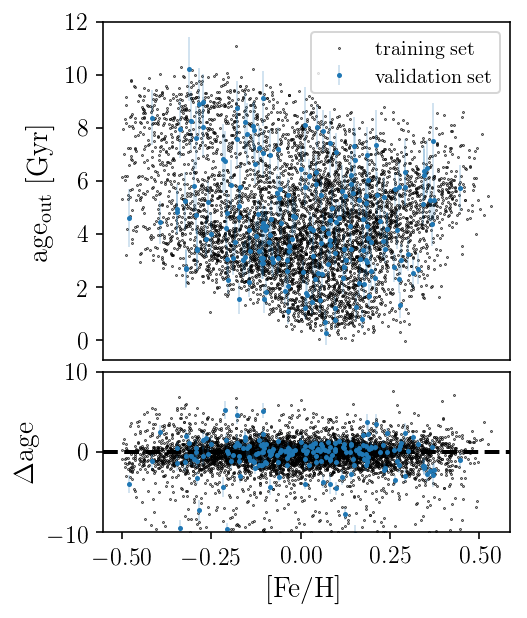

In [183]:
# plot the prediction vs the training set
fig = plt.figure()
fig.set_size_inches(columnwidth,1.2*columnwidth)
ax = fig.add_axes([0.1,0.4,0.85,0.59])
ax1 = fig.add_axes([0.1,0.1,0.85,0.28])
ax.scatter(test_out[:,3][mask], pred[:,0][mask], s=0.1, c='Black', label=r'$\mathrm{training\ set}$',rasterized=True)
ax.errorbar(test_out[:,3][mask&test_mask], pred[:,0][mask&test_mask], yerr=pred_std['total'][:,i][mask&test_mask]/2., fmt='.', ms=3., label=r'$\mathrm{validation\ set}$', elinewidth=0.2)
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)
#ax.plot([0.,14.], [0.,14.], linestyle='dashed', color='Black', linewidth=2.)
ax.legend()
ax.set_ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
ax.set_xticks([])
ax1.scatter(test_out[:,3][mask], (pred[:,0][mask]-test_out[:,0][mask]), s=0.1, color='Black', rasterized=True)
ax1.errorbar(test_out[:,3][mask&test_mask], (pred[:,0][mask&test_mask]-test_out[:,0][mask&test_mask]),yerr=pred_std['total'][:,i][mask&test_mask]/2., fmt='.', ms=3., label=r'$\mathrm{validation\ set}$', elinewidth=0.2)
ax1.axhline(0., linestyle='dashed',color='Black', linewidth=2.)
ax1.set_ylabel(r'$\Delta\mathrm{age}$')
ax1.set_xlabel(r'$\mathrm{[Fe/H]}$')
ax1.set_ylim(-10,10)
fig.tight_layout()

(0.0, 2.0)

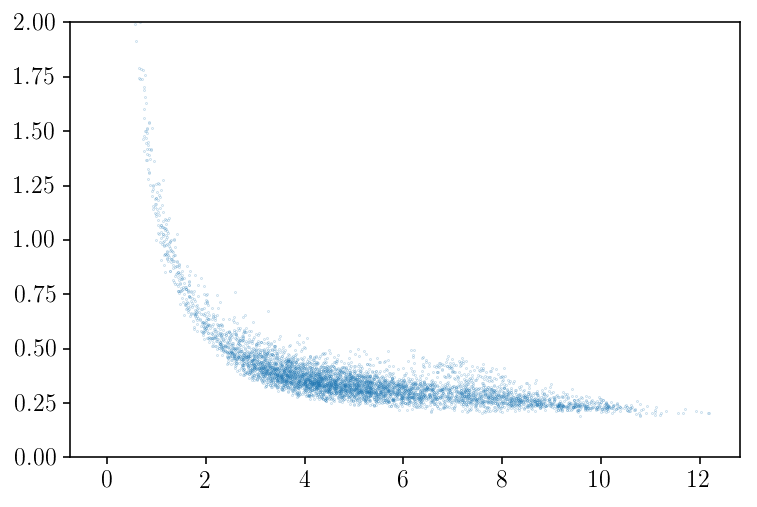

In [163]:
plt.scatter(pred[:,0],pred_std['total'][:,0]/pred[:,0],s=0.01)
plt.ylim(0.,2.)

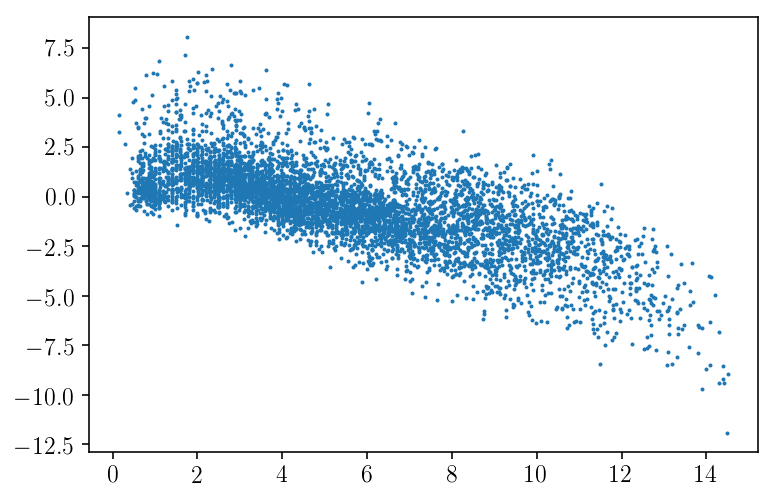

In [166]:
plt.scatter(test_out[:,0][mask],(pred[:,0]-test_out[:,0])[mask],s=1)


In [ ]:
dr14_pred, dr14_std = bcnn_net.test(x, x_err)

Starting Dropout Variational Inference
Completed 0 of 25 Monte Carlo Dropout, 0.00s elapsed


In [256]:
jacobian = bcnn_net.jacobian(test_spec, mean_output=True)

Finished gradient calculation, 561.95 seconds elapsed


In [257]:
bcnn_net.jacobian_aspcap(jacobian=jacobian, dr=14)

TypeError: expected str, bytes or os.PathLike object, not NoneType

In [ ]:
np.shape(jacobian)

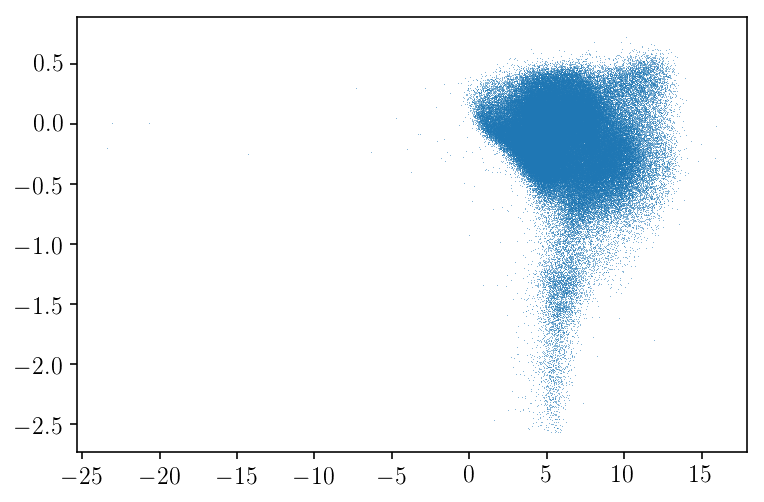

In [289]:
plt.scatter(dr14_pred[:,0], y[:,2], s=0.1, lw=0.)

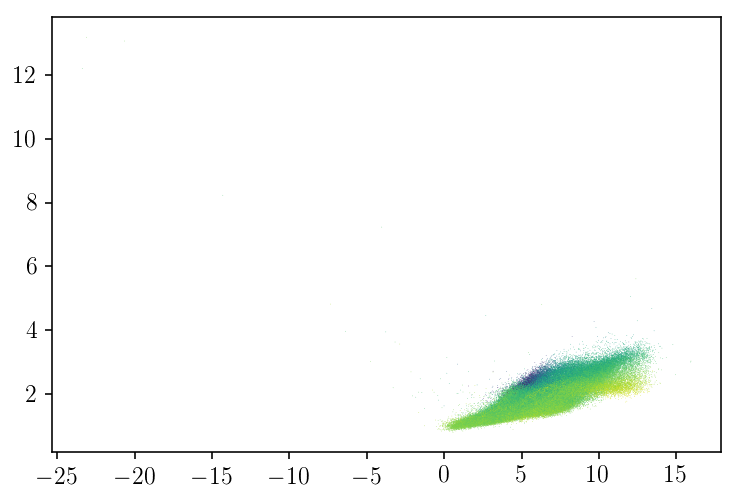

In [290]:
plt.scatter(dr14_pred[:,0], dr14_std['total'][:,0], s=0.1, lw=0, c=y[:,2])


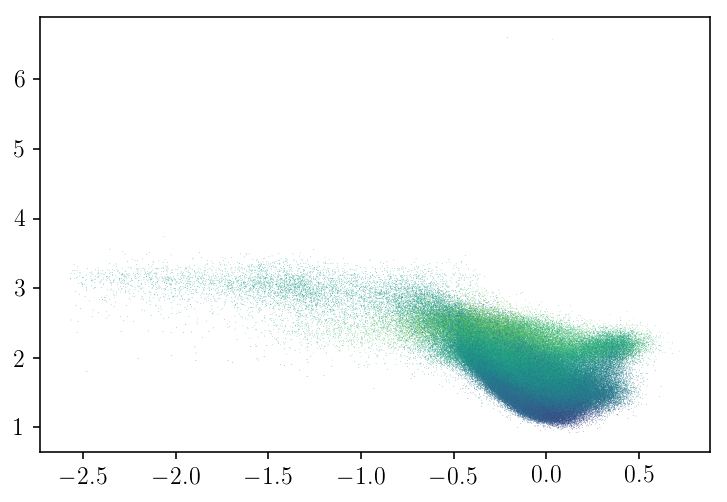

In [184]:
plt.scatter(y[:,2], dr14_std['total'][:,0], s=0.1, lw=0, c=dr14_pred[:,0])

In [188]:
from astropy.io import fits
fullallstar = fits.open('/gal/sdss_lsm/dr14/apogee/spectro/redux/r8/stars/l31c/l31c.2/allStar-l31c.2-nodups.fits')
fullallstar = fullallstar[1].data
len(fullallstar)

258333

In [292]:
as_ra = fullallstar['RA']
as_dec = fullallstar['DEC']
as_idx_1, as_idx_2, as_sep = xmatch(ra, as_ra, colRA1=ra, colDec1=dec, colRA2=as_ra, colDec2=as_dec, swap=True)

In [201]:
apo_ra = apodat['RA']
apo_dec = apodat['DEC']
apo_idx_1, apo_idx_2, as_sep = xmatch(ra, apo_ra, colRA1=ra, colDec1=dec, colRA2=apo_ra, colDec2=apo_dec, swap=True)

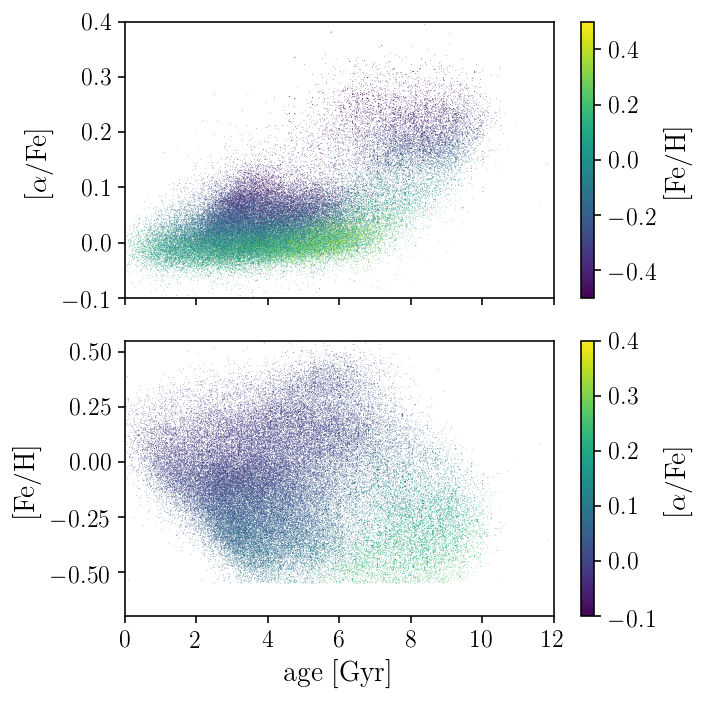

In [252]:
%matplotlib inline
fig, ax = plt.subplots(2,1, sharex=True)
fig.set_size_inches(1.5*columnwidth,1.5*columnwidth)
goodmask = (apodat['FE_H'][apo_idx_2] > -0.55) #& (apodat['TEFF'][apo_idx_2] > 3000) & (apodat['TEFF'][apo_idx_2] < 5200)
s = ax[0].scatter(dr14_pred[:,0][apo_idx_1][goodmask], apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['FE_H'][apo_idx_2][goodmask], vmin=-0.5,vmax=0.5, rasterized=True)
ebins_y = np.linspace(-0.1,0.3,4)
ebins_x = np.linspace(0.,12.,4)
ybin_err = []
xbin_err = []
for i in range(len(ebins_y)-1):
    ybin = (apodat['AVG_ALPHAFE'][apo_idx_2][goodmask] > ebins_y[i]) & (apodat['AVG_ALPHAFE'][apo_idx_2][goodmask] < ebins_y[i+1])
    ybin_err.append(0.05)
    xbin = (dr14_pred[:,0][apo_idx_1][goodmask] > ebins_x[i]) & (dr14_pred[:,0][apo_idx_1][goodmask] < ebins_x[i+1])
    xbin_err.append(np.mean(dr14_std['total'][:,0][apo_idx_1][goodmask]/2.))
#plt.errorbar(dr14_pred[:,0][apo_idx_1][goodmask], apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=100)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ybincent = (ebins_y[:-1]+ebins_y[1:])/2.
xbincent = (ebins_x[:-1]+ebins_x[1:])/2.

#plt.errorbar(xbincent,ybincent,yerr=ybin_err, xerr=xbin_err)
ax[0].set_ylim(-0.1,0.4)
ax[0].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax[0])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])


s = ax[1].scatter(dr14_pred[:,0][apo_idx_1][goodmask], apodat['FE_H'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], vmin=-0.1,vmax=0.4, rasterized=True)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['FE_H'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ax[1].set_ylim(-0.7,0.55)
ax[1].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[\alpha/Fe]}$', ax=ax[1])
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[1].set_xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

plt.savefig('../plots/astroNNBayes_age_feh_afe.png', format='png', dpi=300)
plt.savefig('../plots/astroNNBayes_age_feh_afe.pdf', format='pdf', dpi=300)

<IPython.core.display.Javascript object>


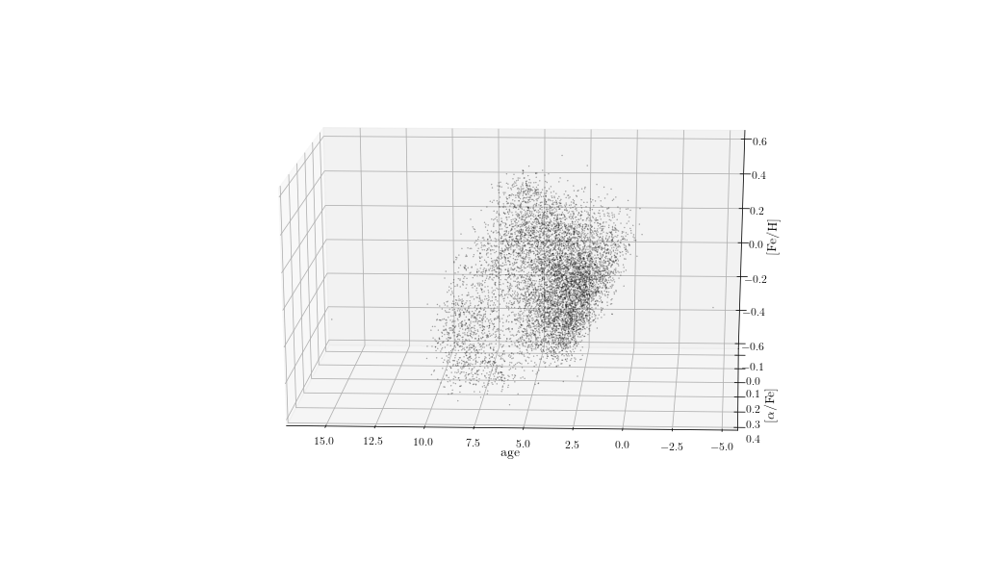

Text(0.5,0,'$\\mathrm{[Fe/H]}$')

In [249]:
%matplotlib notebook
from mpl_toolkits import mplot3d

ax = plt.axes(projection='3d')

s = ax.scatter3D(dr14_pred[:,0][apo_idx_1][goodmask][::10], apodat['AVG_ALPHAFE'][apo_idx_2][goodmask][::10], apodat['FE_H'][apo_idx_2][goodmask][::10], s=0.1, c='Black', alpha=0.5)
ax.set_xlabel(r'$\mathrm{age}$')
ax.set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
ax.set_zlabel(r'$\mathrm{[Fe/H]}$')

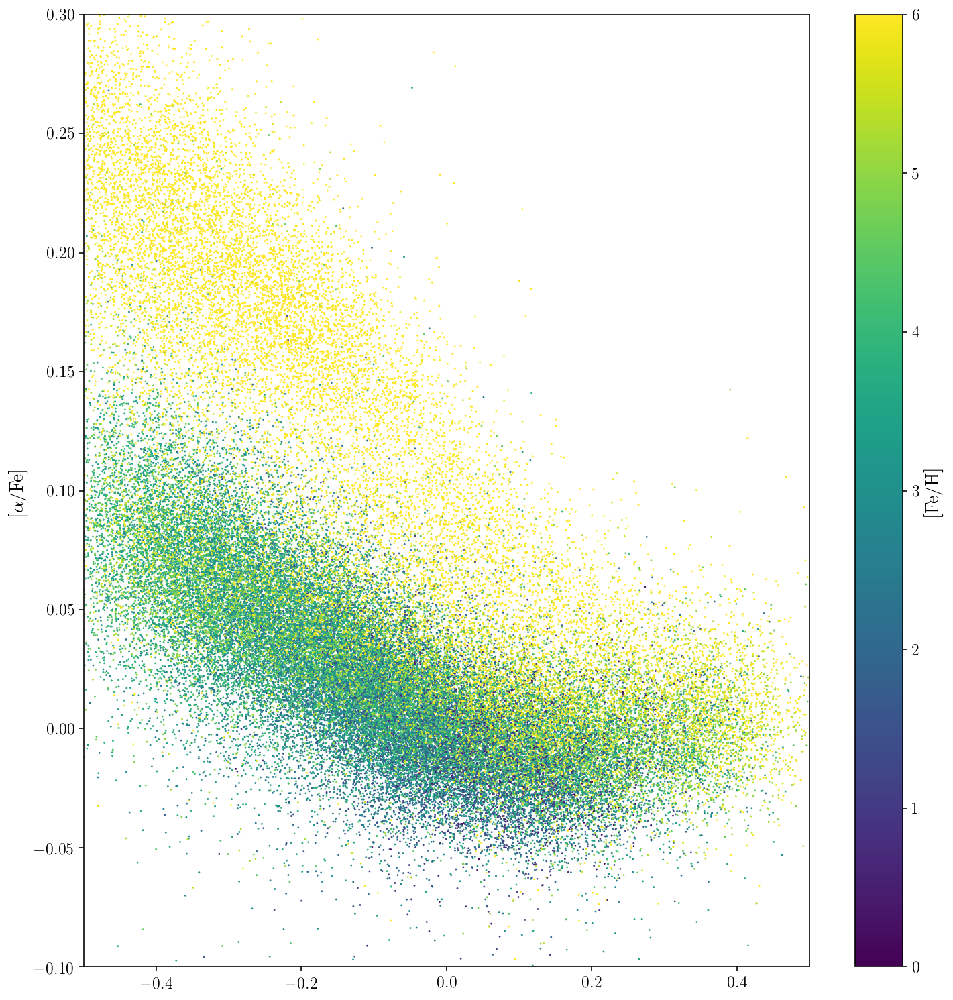

In [233]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(1.5*textwidth,1.5*textwidth)
goodmask = apodat['FE_H'][apo_idx_2] > -0.5
s = ax.scatter(apodat['FE_H'][apo_idx_2][goodmask], apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], s=2., lw=0., c=dr14_pred[:,0][apo_idx_1][goodmask], vmin=0,vmax=6., rasterized=True)
ebins_y = np.linspace(-0.1,0.3,4)
ebins_x = np.linspace(0.,12.,4)
ybin_err = []
xbin_err = []
for i in range(len(ebins_y)-1):
    ybin = (apodat['AVG_ALPHAFE'][apo_idx_2][goodmask] > ebins_y[i]) & (apodat['AVG_ALPHAFE'][apo_idx_2][goodmask] < ebins_y[i+1])
    ybin_err.append(0.05)
    xbin = (dr14_pred[:,0][apo_idx_1][goodmask] > ebins_x[i]) & (dr14_pred[:,0][apo_idx_1][goodmask] < ebins_x[i+1])
    xbin_err.append(np.mean(dr14_std['total'][:,0][apo_idx_1][goodmask]/2.))
#plt.errorbar(dr14_pred[:,0][apo_idx_1][goodmask], apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=100)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ybincent = (ebins_y[:-1]+ebins_y[1:])/2.
xbincent = (ebins_x[:-1]+ebins_x[1:])/2.

#plt.errorbar(xbincent,ybincent,yerr=ybin_err, xerr=xbin_err)
ax.set_ylim(-0.1,0.3)
ax.set_xlim(-0.5,0.5)
plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax)
ax.set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

#ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])

fig.tight_layout()

In [253]:
len(dr14_pred[:,0][apo_idx_1][goodmask])

76105

In [198]:
np.mean(dr14_std['total'][:,0][apo_idx_1][goodmask]/(dr14_pred[:,0][apo_idx_1][goodmask]))

0.3962556797894255

(array([3.0000e+00, 5.6089e+04, 1.4814e+04, 2.0220e+03, 7.8500e+02,
        3.8800e+02, 2.1100e+02, 1.1100e+02, 7.2000e+01, 4.1000e+01]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <a list of 10 Patch objects>)

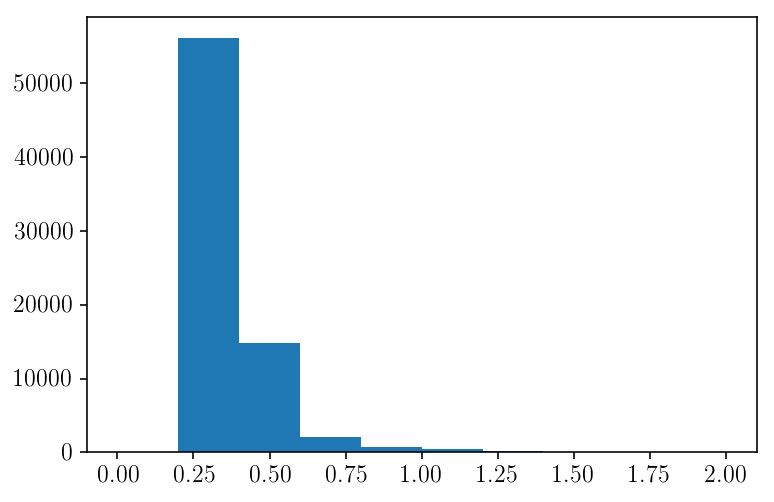

In [321]:
plt.hist(dr14_std['total'][:,0][apo_idx_1][goodmask]/(dr14_pred[:,0][apo_idx_1][goodmask]), range=[0.,2.])

In [202]:
agerec = np.recarray(len(apo_ra[apo_idx_2][goodmask]), dtype=[('APOGEE_ID', '<U18'), 
                                                  ('astroNN_age', float),
                                                  ('astroNN_age_total_std', float),
                                                  ('astroNN_age_predictive_std', float),
                                                  ('astroNN_age_model_std', float)])

agerec['APOGEE_ID'] = apodat['APOGEE_ID'][apo_idx_2][goodmask]
agerec['astroNN_age'] = dr14_pred[:,0][apo_idx_1][goodmask]
agerec['astroNN_age_total_std'] = dr14_std['total'][:,0][apo_idx_1][goodmask]
agerec['astroNN_age_predictive_std'] = dr14_std['predictive'][:,0][apo_idx_1][goodmask]
agerec['astroNN_age_model_std'] = dr14_std['model'][:,0][apo_idx_1][goodmask]

hdu = fits.BinTableHDU.from_columns(agerec)
hdu.writeto('../sav/astroNNBayes_ages_goodDR14.fits')

with open('../sav/astroNNBayes_ages_goodDR14.npy', 'wb') as f:
    np.save(f, agerec)

In [167]:
# import the neural net class from astroNN first
from astroNN.models import ApogeeBCNN, ApogeeCNN

# astronn_neuralnet is an astroNN's neural network instance
# In this case, it is an instance of APOGEECNN
# set the label shape to 4 - tell it to do 100 epochs of training
astronn_neuralnet = ApogeeCNN()

astronn_neuralnet.max_epochs = 200
astronn_neuralnet.labels_shape = 26
astronn_neuralnet.task = 'regression'
# is this necessary?
#astronn_neuralnet.targetname = ['FE_H', 'TEFF_COR', 'LOGG_COR', 'age']

In [132]:

ages = np.log10(indexed_dat['age']*1e6)/10.
age_error = np.log10((indexed_dat['e_6']+indexed_dat['e_7'])*1e6/2.)/10. #presume gaussian
age_error[age_error < 0.] = 0.01
#stack all the labels together for astroNN
out = np.dstack([indexed_dat['FE_H'], indexed_dat['TEFF_COR'], indexed_dat['LOGG_COR'], ages])[0]
out_err = np.dstack([indexed_dat['FE_H_ERR'], indexed_dat['TEFF_COR_ERR'], indexed_dat['LOGG_COR_ERR'], age_error])[0]

/home/astjmack/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until



In [133]:
mask = np.all(np.isfinite(out), axis=1) & np.all(np.isfinite(out_err), axis=1) & np.all(out != -9999., axis=1)

In [134]:
test_inds = np.random.choice(np.arange(0,len(test_spec[mask])),size=50, replace=False)
test_mask = np.zeros(len(test_spec[mask]), dtype=bool)
test_mask[test_inds] = 1.
print(sum(test_mask))

100


In [169]:
astronn_neuralnet.train(test_spec[mask&~test_mask],test_out[mask&~test_mask])#, test_errspec[mask&~test_mask], test_outerr[mask&~test_mask]) #, test_errspec[mask],out_err[mask])

Number of Training Data: 4737, Number of Validation Data: 526
====Message from Normalizer====
You selected mode: 3
Featurewise Center: True
Datawise Center: False
Featurewise std Center: False
Datawise std Center: False
====Message ends====
====Message from Normalizer====
You selected mode: 2
Featurewise Center: True
Datawise Center: False
Featurewise std Center: True
Datawise std Center: False
====Message ends====
/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)

Epoch 1/200
 - 12s - loss: 0.3129 - mean_absolute_error: 0.3788 - val_loss: 0.1707 - val_mean_absolute_error: 0.2680
Epoch 2/200
 - 11s - loss: 0.1609 - mean_absolute_error: 0.2593 - val_loss: 0.1377 - val_mean_absolute_error: 0.2370
Epoch 3/200
 - 11s - loss: 0.1433 - mean_absolute_


Epoch 00056: ReduceLROnPlateau reducing learning rate to 6.103515488575795e-07.
Epoch 57/200
 - 11s - loss: 0.0545 - mean_absolute_error: 0.1434 - val_loss: 0.0974 - val_mean_absolute_error: 0.1791
Epoch 58/200
 - 11s - loss: 0.0546 - mean_absolute_error: 0.1438 - val_loss: 0.0980 - val_mean_absolute_error: 0.1796

Epoch 00058: ReduceLROnPlateau reducing learning rate to 3.0517577442878974e-07.
Epoch 59/200
 - 11s - loss: 0.0549 - mean_absolute_error: 0.1441 - val_loss: 0.0979 - val_mean_absolute_error: 0.1798
Epoch 60/200
 - 11s - loss: 0.0546 - mean_absolute_error: 0.1437 - val_loss: 0.0977 - val_mean_absolute_error: 0.1794

Epoch 00060: ReduceLROnPlateau reducing learning rate to 1.5258788721439487e-07.
Epoch 61/200
 - 11s - loss: 0.0542 - mean_absolute_error: 0.1438 - val_loss: 0.0977 - val_mean_absolute_error: 0.1792
Epoch 62/200
 - 11s - loss: 0.0543 - mean_absolute_error: 0.1431 - val_loss: 0.0980 - val_mean_absolute_error: 0.1796

Epoch 00062: ReduceLROnPlateau reducing learni

Epoch 122/200
 - 11s - loss: 0.0543 - mean_absolute_error: 0.1432 - val_loss: 0.0974 - val_mean_absolute_error: 0.1794
Epoch 123/200
 - 11s - loss: 0.0545 - mean_absolute_error: 0.1437 - val_loss: 0.0977 - val_mean_absolute_error: 0.1796
Epoch 124/200
 - 11s - loss: 0.0544 - mean_absolute_error: 0.1440 - val_loss: 0.0982 - val_mean_absolute_error: 0.1798
Epoch 125/200
 - 11s - loss: 0.0549 - mean_absolute_error: 0.1440 - val_loss: 0.0970 - val_mean_absolute_error: 0.1792
Epoch 126/200
 - 11s - loss: 0.0547 - mean_absolute_error: 0.1437 - val_loss: 0.0984 - val_mean_absolute_error: 0.1799
Epoch 127/200
 - 11s - loss: 0.0547 - mean_absolute_error: 0.1435 - val_loss: 0.0975 - val_mean_absolute_error: 0.1792
Epoch 128/200
 - 11s - loss: 0.0539 - mean_absolute_error: 0.1431 - val_loss: 0.0987 - val_mean_absolute_error: 0.1802
Epoch 129/200
 - 11s - loss: 0.0554 - mean_absolute_error: 0.1442 - val_loss: 0.0977 - val_mean_absolute_error: 0.1796
Epoch 130/200
 - 11s - loss: 0.0549 - mean_absol

Epoch 191/200
 - 11s - loss: 0.0551 - mean_absolute_error: 0.1440 - val_loss: 0.0975 - val_mean_absolute_error: 0.1796
Epoch 192/200
 - 11s - loss: 0.0557 - mean_absolute_error: 0.1448 - val_loss: 0.0970 - val_mean_absolute_error: 0.1793
Epoch 193/200
 - 11s - loss: 0.0541 - mean_absolute_error: 0.1429 - val_loss: 0.0978 - val_mean_absolute_error: 0.1798
Epoch 194/200
 - 11s - loss: 0.0549 - mean_absolute_error: 0.1438 - val_loss: 0.0980 - val_mean_absolute_error: 0.1797
Epoch 195/200
 - 11s - loss: 0.0552 - mean_absolute_error: 0.1436 - val_loss: 0.0978 - val_mean_absolute_error: 0.1797
Epoch 196/200
 - 11s - loss: 0.0553 - mean_absolute_error: 0.1439 - val_loss: 0.0973 - val_mean_absolute_error: 0.1794
Epoch 197/200
 - 11s - loss: 0.0546 - mean_absolute_error: 0.1437 - val_loss: 0.0975 - val_mean_absolute_error: 0.1794
Epoch 198/200
 - 11s - loss: 0.0545 - mean_absolute_error: 0.1431 - val_loss: 0.0980 - val_mean_absolute_error: 0.1794
Epoch 199/200
 - 10s - loss: 0.0548 - mean_absol

In [170]:
#generate predictions from trained model (save to file)
cnnpred = astronn_neuralnet.test(test_spec)

with open('../sav/astroNN_CNN_APOKASC_predictions.npy', 'wb') as f:
    np.save(f, pred)
    np.save(f, pred_std)

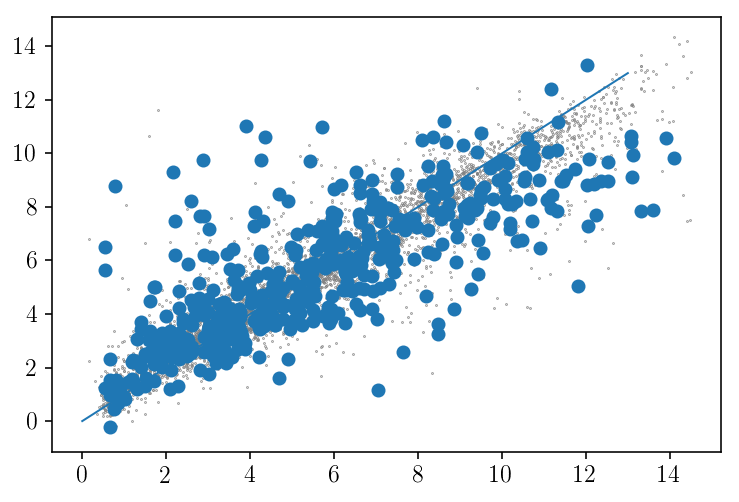

In [174]:
plt.scatter(test_out[:,0][mask], cnnpred[:,0][mask], s=0.1, c='Gray')
plt.scatter(test_out[:,0][mask&test_mask], cnnpred[:,0][mask&test_mask])
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)

plt.plot(np.linspace(0.,13.,10),np.linspace(0.,13.,10))


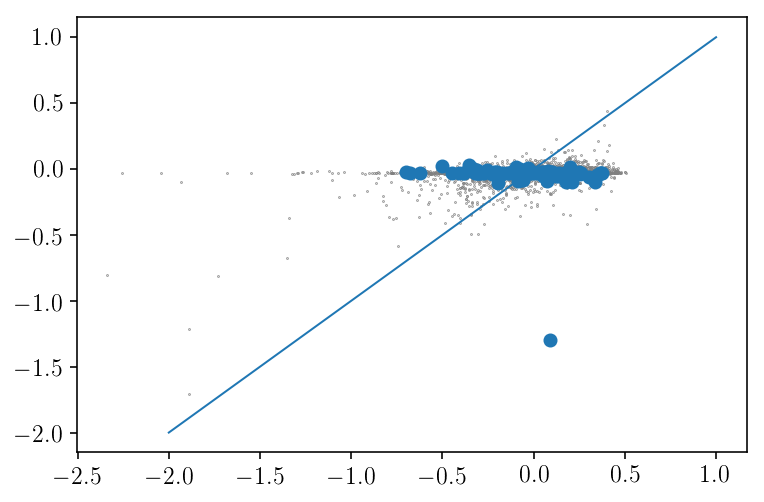

In [86]:
plt.scatter(out[:,0][mask], pred[:,0], s=0.1, c='Gray')
plt.scatter(out[:,0][mask][test_mask], pred[:,0][test_mask])
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)

plt.plot(np.linspace(-2.,1.,10),np.linspace(-2.,1.,10))
#plt.ylim(0.,15.)

In [4]:
from astroNN.models import ApogeeBCNN, ApogeeCNN

# Load the train data from dataset first, x_train is spectra and y_train will be ASPCAP labels
loader = H5Loader('test.h5')
loader.load_err = False
x_train, y_train = loader.load()

#And then create an instance of Convolutional Neural Network class
cnn_net = ApogeeCNN()

# You don't have to specify the task because its 'regression' by default. But if you are doing classification. you can set task='classification'
cnn_net.task = 'regression'

# Set max_epochs to 10 for a quick result. You should train more epochs normally
cnn_net.max_epochs = 10
cnn_net.train(x_train, y_train)

Using TensorFlow backend.


Number of Training Data: 164962, Number of Validation Data: 18329
====Message from Normalizer====
You selected mode: 3
Featurewise Center: True
Datawise Center: False
Featurewise std Center: False
Datawise std Center: False
====Message ends====
====Message from Normalizer====
You selected mode: 2
Featurewise Center: True
Datawise Center: False
Featurewise std Center: True
Datawise std Center: False
====Message ends====
/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)

Instructions for updating:
`NHWC` for data_format is deprecated, use `NWC` instead
Epoch 1/10


KeyboardInterrupt: 

/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



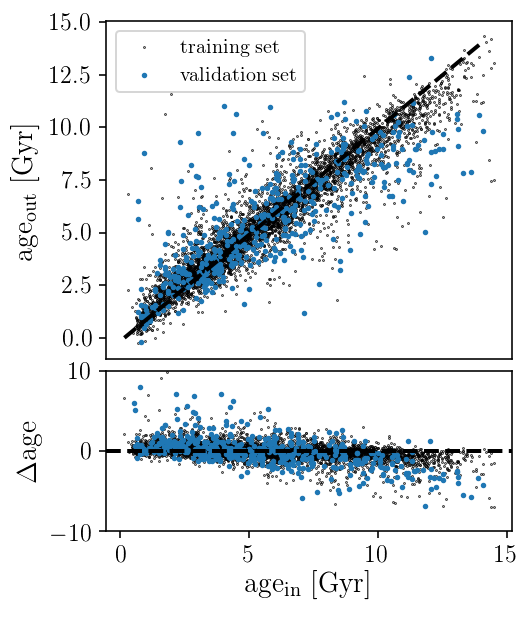

In [262]:
# plot the prediction vs the training set
fig = plt.figure()
fig.set_size_inches(columnwidth,1.2*columnwidth)
ax = fig.add_axes([0.1,0.4,0.85,0.59])
ax1 = fig.add_axes([0.1,0.1,0.85,0.28])
ax.scatter(test_out[:,i][mask], cnnpred[:,i][mask], s=0.1, c='Black', label=r'$\mathrm{training\ set}$',rasterized=True)
ax.scatter(test_out[:,i][mask&test_mask], cnnpred[:,i][mask&test_mask], s=3.,  label=r'$\mathrm{validation\ set}$')
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)
ax.plot([0.,14.], [0.,14.], linestyle='dashed', color='Black', linewidth=2.)
ax.legend()
ax.set_ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
ax.set_xticks([])
ax1.scatter(test_out[:,0][mask], (cnnpred[:,0][mask]-test_out[:,0][mask]), s=0.1, color='Black', rasterized=True)
ax1.scatter(test_out[:,0][mask&test_mask], (cnnpred[:,0][mask&test_mask]-test_out[:,0][mask&test_mask]), s=3., label=r'$\mathrm{validation\ set}$')
ax1.axhline(0., linestyle='dashed',color='Black', linewidth=2.)
ax1.set_ylabel(r'$\Delta\mathrm{age}$')
ax1.set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax1.set_ylim(-10,10)
fig.tight_layout()

plt.savefig('../plots/astroNNCNN_agein_ageout.pdf', format='pdf', dpi=400, bbox_inches='tight')
plt.savefig('../plots/astroNNCNN_agein_ageout.png', format='png', dpi=400,  bbox_inches='tight')



(array([ 1.,  1.,  1.,  2.,  2.,  5.,  3.,  7.,  4.,  6.,  6., 15.,  8.,
        16., 18., 36., 35., 49., 46., 40., 56., 41., 34., 20., 13.,  8.,
         4.,  7.,  3.,  3.,  2.,  2.,  1.,  1.,  2.,  1.,  0.,  0.,  0.]),
 array([-8.        , -7.58974359, -7.17948718, -6.76923077, -6.35897436,
        -5.94871795, -5.53846154, -5.12820513, -4.71794872, -4.30769231,
        -3.8974359 , -3.48717949, -3.07692308, -2.66666667, -2.25641026,
        -1.84615385, -1.43589744, -1.02564103, -0.61538462, -0.20512821,
         0.20512821,  0.61538462,  1.02564103,  1.43589744,  1.84615385,
         2.25641026,  2.66666667,  3.07692308,  3.48717949,  3.8974359 ,
         4.30769231,  4.71794872,  5.12820513,  5.53846154,  5.94871795,
         6.35897436,  6.76923077,  7.17948718,  7.58974359,  8.        ]),
 <a list of 1 Patch objects>)

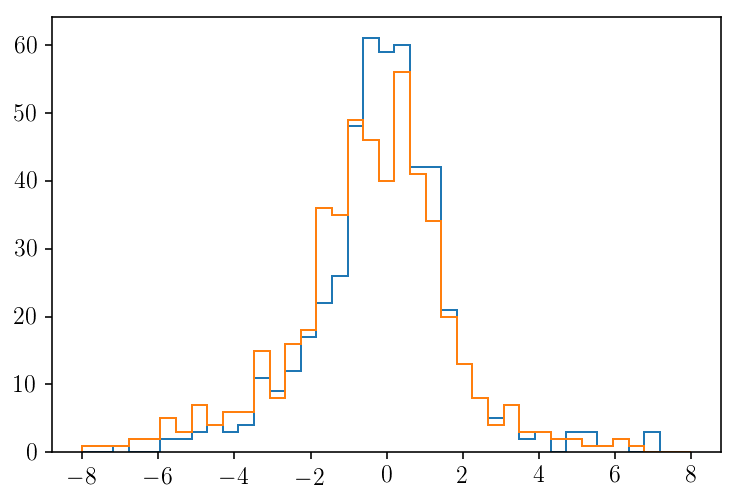

In [266]:
bins = np.linspace(-8,8.,40)
plt.hist(cnnpred[:,0][mask&test_mask]-test_out[:,0][mask&test_mask], bins=bins, histtype='step')
plt.hist(pred[:,0][mask&test_mask]-test_out[:,0][mask&test_mask], bins=bins, histtype='step')

In [10]:
import define_rgbsample

In [11]:
len(test_spec), len(dat[idx_2])

NameError: name 'test_spec' is not defined

(-1.0, 0.5)

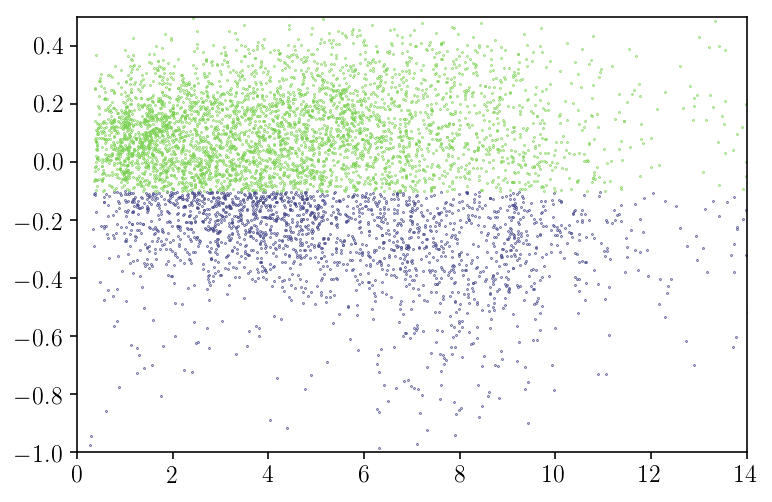

In [205]:
afe = define_rgbsample.avg_alphafe(ndata[idx_2])
#hi = afe > define_rgbsample.alphaedge(dat['FE_H'][idx_2])
#lo = afe < define_rgbsample.alphaedge(dat['FE_H'][idx_2])
hi = ndata['FE_H'][idx_2] > -0.1
lo = ndata['FE_H'][idx_2] < -0.1
plt.scatter(ages[lo], ndata['FE_H'][idx_2][lo], c=plt.cm.viridis(0.2), s=0.1)
plt.scatter(ages[hi], ndata['FE_H'][idx_2][hi], c=plt.cm.viridis(0.8), s=0.1)
plt.xlim(0,14.)
plt.ylim(-1.,0.5)


(0.0, 14.0)

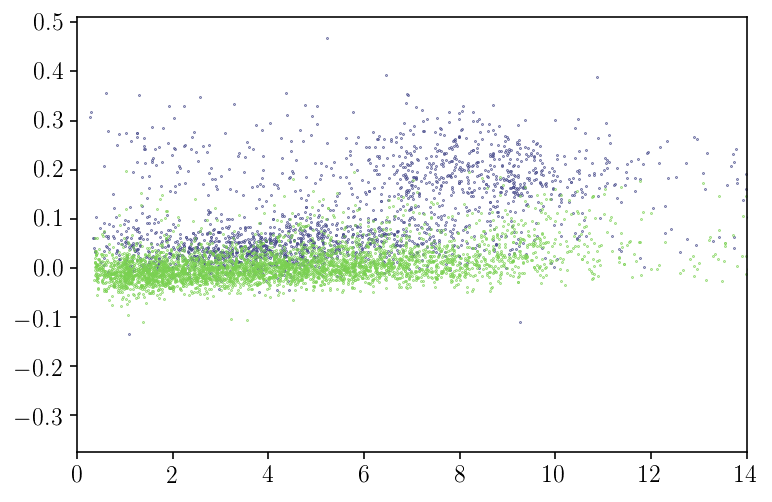

In [207]:
plt.scatter(ages[lo], afe[lo], c=plt.cm.viridis(0.2), s=0.1)
plt.scatter(ages[hi], afe[hi], c=plt.cm.viridis(0.8), s=0.1)
plt.xlim(0.,14.)


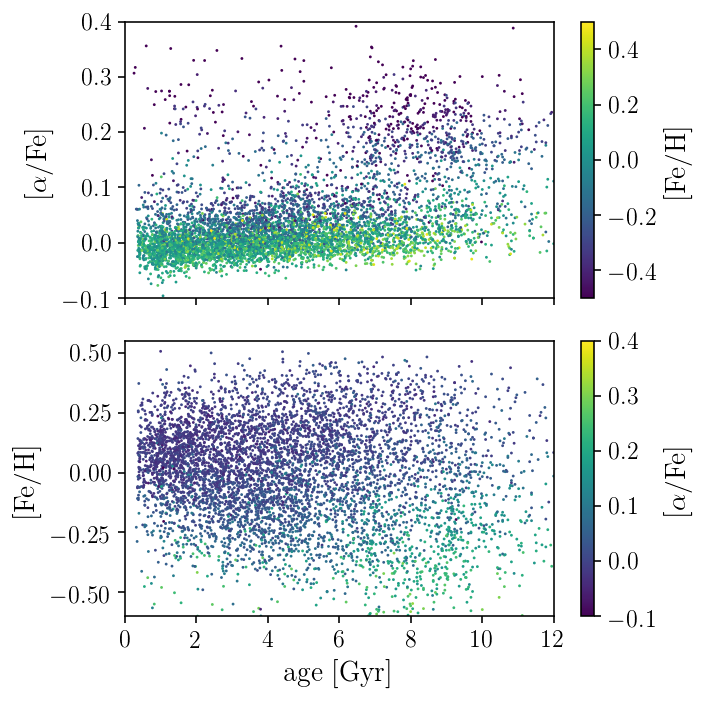

In [208]:
fig, ax = plt.subplots(2,1, sharex=True)
fig.set_size_inches(1.5*columnwidth,1.5*columnwidth)

s = ax[0].scatter(ages, afe, s=2, lw=0., c=ndata['FE_H'][idx_2], vmin=-0.5,vmax=0.5, rasterized=True)
ebins_y = np.linspace(-0.1,0.3,4)
ebins_x = np.linspace(0.,12.,4)
ybin_err = []
xbin_err = []

ax[0].set_ylim(-0.1,0.4)
ax[0].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax[0])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])


s = ax[1].scatter(ages, ndata['FE_H'][idx_2], s=2, lw=0., c=afe, vmin=-0.1,vmax=0.4, rasterized=True)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['FE_H'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ax[1].set_ylim(-0.6,0.55)
ax[1].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[\alpha/Fe]}$', ax=ax[1])
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[1].set_xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

In [209]:
from astroNN.models import ApogeeBCNN
# And then create an instance of Bayesian Convolutional Neural Network class
lo_bcnn_net = ApogeeBCNN()

# You don't have to specify the task because its 'regression' by default. But if you are doing classification. you can set task='classification'
lo_bcnn_net.task = 'regression'
lo_bcnn_net.labels_shape= 26
lo_bcnn_net.num_hidden = [128,64]
lo_bcnn_net.batch_size = 32

# Set max_epochs to 10 for a quick result. You should train more epochs normally, especially with dropout
lo_bcnn_net.max_epochs = 60
#bcnn_net.train(x_train, y_train, x_err, y_err)

In [211]:
lo_mask = np.all(np.isfinite(test_out[lo]), axis=1) & np.all(np.isfinite(test_outerr[lo]), axis=1) & (test_out[:,22][lo] > -0.6) & (test_out[:,0][lo] != -9999.)
sum(lo_mask)

2021

In [212]:
lo_test_inds = np.random.choice(np.arange(0,len(test_spec[lo])),size=100, replace=False)
lo_test_mask = np.zeros(len(test_spec[lo]), dtype=bool)
lo_test_mask[lo_test_inds] = 1.
print(sum(lo_test_mask))

100


In [213]:
lo_bcnn_net.train(test_spec[lo][~lo_test_mask&lo_mask],test_out[lo][~lo_test_mask&lo_mask], test_errspec[lo][~lo_test_mask&lo_mask], test_outerr[lo][~lo_test_mask&lo_mask]) #, test_errspec[mask],out_err[mask])

Number of Training Data: 1791, Number of Validation Data: 198
====Message from Normalizer====
You selected mode: 3
Featurewise Center: True
Datawise Center: False
Featurewise std Center: False
Datawise std Center: False
====Message ends====
====Message from Normalizer====
You selected mode: 2
Featurewise Center: True
Datawise Center: False
Featurewise std Center: True
Datawise std Center: False
====Message ends====
/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)

Epoch 1/60
 - 6s - loss: 0.4964 - output_loss: 0.4962 - variance_output_loss: 0.4962 - output_mean_absolute_error: 0.7790 - val_loss: 0.4722 - val_output_loss: 0.4720 - val_variance_output_loss: 0.4720 - val_output_mean_absolute_error: 0.7696
Epoch 2/60
 - 4s - loss: 0.4144 - output_

 - 4s - loss: -3.2497e-01 - output_loss: -3.2525e-01 - variance_output_loss: -3.2525e-01 - output_mean_absolute_error: 0.3680 - val_loss: -3.3076e-01 - val_output_loss: -3.3104e-01 - val_variance_output_loss: -3.3104e-01 - val_output_mean_absolute_error: 0.3656
Epoch 29/60
 - 4s - loss: -3.1998e-01 - output_loss: -3.2026e-01 - variance_output_loss: -3.2026e-01 - output_mean_absolute_error: 0.3699 - val_loss: -2.7419e-01 - val_output_loss: -2.7447e-01 - val_variance_output_loss: -2.7447e-01 - val_output_mean_absolute_error: 0.3821
Epoch 30/60
 - 4s - loss: -3.2389e-01 - output_loss: -3.2417e-01 - variance_output_loss: -3.2417e-01 - output_mean_absolute_error: 0.3703 - val_loss: -2.9233e-01 - val_output_loss: -2.9260e-01 - val_variance_output_loss: -2.9260e-01 - val_output_mean_absolute_error: 0.3759
Epoch 31/60
 - 4s - loss: -3.3225e-01 - output_loss: -3.3253e-01 - variance_output_loss: -3.3253e-01 - output_mean_absolute_error: 0.3686 - val_loss: -3.1911e-01 - val_output_loss: -3.1939e-


Epoch 00054: ReduceLROnPlateau reducing learning rate to 3.051757957450718e-08.
Epoch 55/60
 - 4s - loss: -3.3929e-01 - output_loss: -3.3957e-01 - variance_output_loss: -3.3957e-01 - output_mean_absolute_error: 0.3654 - val_loss: -3.5045e-01 - val_output_loss: -3.5073e-01 - val_variance_output_loss: -3.5073e-01 - val_output_mean_absolute_error: 0.3654
Epoch 56/60
 - 4s - loss: -3.3468e-01 - output_loss: -3.3496e-01 - variance_output_loss: -3.3496e-01 - output_mean_absolute_error: 0.3675 - val_loss: -3.0824e-01 - val_output_loss: -3.0852e-01 - val_variance_output_loss: -3.0852e-01 - val_output_mean_absolute_error: 0.3698

Epoch 00056: ReduceLROnPlateau reducing learning rate to 1.525878978725359e-08.
Epoch 57/60
 - 4s - loss: -3.3190e-01 - output_loss: -3.3218e-01 - variance_output_loss: -3.3218e-01 - output_mean_absolute_error: 0.3688 - val_loss: -2.9651e-01 - val_output_loss: -2.9679e-01 - val_variance_output_loss: -2.9679e-01 - val_output_mean_absolute_error: 0.3733
Epoch 58/60
 - 4

In [214]:
lo_pred, lo_pred_std = lo_bcnn_net.test(test_spec[lo], test_errspec[lo])

Starting Dropout Variational Inference
Completed 0 of 25 Monte Carlo Dropout, 0.00s elapsed
Completed 5 of 25 Monte Carlo Dropout, 18.72s elapsed
Completed 10 of 25 Monte Carlo Dropout, 36.92s elapsed
Completed 15 of 25 Monte Carlo Dropout, 54.96s elapsed
Completed 20 of 25 Monte Carlo Dropout, 73.02s elapsed
Completed Dropout Variational Inference, 91.30s in total


/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



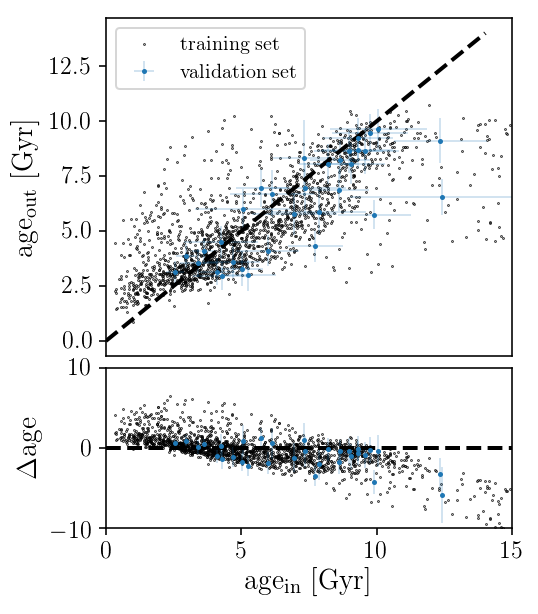

In [217]:
# plot the prediction vs the training set
i = 0
fig = plt.figure()
fig.set_size_inches(columnwidth,1.2*columnwidth)
ax = fig.add_axes([0.1,0.4,0.85,0.59])
ax1 = fig.add_axes([0.1,0.1,0.85,0.28])
ax.scatter(test_out[:,i][lo][lo_mask], lo_pred[:,i][lo_mask], s=0.1, c='Black', label=r'$\mathrm{training\ set}$',rasterized=True)
ax.errorbar(test_out[:,i][lo][lo_mask&lo_test_mask], lo_pred[:,i][lo_mask&lo_test_mask], yerr=lo_pred_std['total'][:,i][lo_mask&lo_test_mask]/2., xerr=test_outerr[:,i][lo][lo_mask&lo_test_mask], fmt='.', ms=3., label=r'$\mathrm{validation\ set}$', elinewidth=0.2,)
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)
ax.plot([0.,14.], [0.,14.], linestyle='dashed', color='Black', linewidth=2.)
ax.legend()
ax.set_ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
ax.set_xticks([])
ax1.scatter(test_out[:,0][lo][lo_mask], (lo_pred[:,0][lo_mask]-test_out[:,0][lo][lo_mask]), s=0.1, color='Black', rasterized=True)
ax1.errorbar(test_out[:,0][lo][lo_mask&lo_test_mask], (lo_pred[:,0][lo_mask&lo_test_mask]-test_out[:,0][lo][lo_mask&lo_test_mask]),yerr=np.sqrt((lo_pred_std['total'][:,i][lo_mask&lo_test_mask]/2.)**2+(test_outerr[:,i][lo][lo_mask&lo_test_mask])**2), fmt='.', ms=3., label=r'$\mathrm{validation\ set}$', elinewidth=0.2,)
ax1.axhline(0., linestyle='dashed',color='Black', linewidth=2.)
ax1.set_ylabel(r'$\Delta\mathrm{age}$')
ax1.set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax1.set_ylim(-10,10)
ax.set_xlim(0.,15.)
ax1.set_xlim(0.,15.)
fig.tight_layout()

In [218]:
from astroNN.models import ApogeeBCNN
# And then create an instance of Bayesian Convolutional Neural Network class
hi_bcnn_net = ApogeeBCNN()

# You don't have to specify the task because its 'regression' by default. But if you are doing classification. you can set task='classification'
hi_bcnn_net.task = 'regression'
hi_bcnn_net.labels_shape=26
hi_bcnn_net.num_hidden = [128,64]
hi_bcnn_net.batch_size = 32

# Set max_epochs to 10 for a quick result. You should train more epochs normally, especially with dropout
hi_bcnn_net.max_epochs = 100
#bcnn_net.train(x_train, y_train, x_err, y_err)

In [220]:
hi_mask = np.all(np.isfinite(test_out[hi]), axis=1) & np.all(np.isfinite(test_outerr[hi]), axis=1) & (test_out[:,22][hi] > -0.6) & (test_out[:,0][hi] != -9999.)
sum(hi_mask)

4196

In [221]:
hi_test_inds = np.random.choice(np.arange(0,len(test_spec[hi])),size=100, replace=False)
hi_test_mask = np.zeros(len(test_spec[hi]), dtype=bool)
hi_test_mask[hi_test_inds] = 1.
print(sum(hi_test_mask))

100


In [222]:
hi_bcnn_net.train(test_spec[hi][~hi_test_mask&hi_mask],test_out[hi][~hi_test_mask&hi_mask], test_errspec[hi][~hi_test_mask&hi_mask], test_outerr[hi][~hi_test_mask&hi_mask]) #, test_errspec[mask],out_err[mask])

Number of Training Data: 3737, Number of Validation Data: 415
====Message from Normalizer====
You selected mode: 3
Featurewise Center: True
Datawise Center: False
Featurewise std Center: False
Datawise std Center: False
====Message ends====
====Message from Normalizer====
You selected mode: 2
Featurewise Center: True
Datawise Center: False
Featurewise std Center: True
Datawise std Center: False
====Message ends====
/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)

Epoch 1/100
 - 9s - loss: 0.3518 - output_loss: 0.3515 - variance_output_loss: 0.3515 - output_mean_absolute_error: 0.6822 - val_loss: 0.0898 - val_output_loss: 0.0896 - val_variance_output_loss: 0.0896 - val_output_mean_absolute_error: 0.5067
Epoch 2/100
 - 8s - loss: -7.0505e-02 - 

 - 8s - loss: -5.8839e-01 - output_loss: -5.8866e-01 - variance_output_loss: -5.8866e-01 - output_mean_absolute_error: 0.2881 - val_loss: -5.9129e-01 - val_output_loss: -5.9157e-01 - val_variance_output_loss: -5.9157e-01 - val_output_mean_absolute_error: 0.2875
Epoch 29/100
 - 8s - loss: -5.9639e-01 - output_loss: -5.9666e-01 - variance_output_loss: -5.9666e-01 - output_mean_absolute_error: 0.2865 - val_loss: -5.8303e-01 - val_output_loss: -5.8330e-01 - val_variance_output_loss: -5.8330e-01 - val_output_mean_absolute_error: 0.2896
Epoch 30/100
 - 8s - loss: -6.0369e-01 - output_loss: -6.0397e-01 - variance_output_loss: -6.0397e-01 - output_mean_absolute_error: 0.2853 - val_loss: -5.9435e-01 - val_output_loss: -5.9462e-01 - val_variance_output_loss: -5.9462e-01 - val_output_mean_absolute_error: 0.2868
Epoch 31/100
 - 8s - loss: -5.9912e-01 - output_loss: -5.9940e-01 - variance_output_loss: -5.9940e-01 - output_mean_absolute_error: 0.2864 - val_loss: -5.9413e-01 - val_output_loss: -5.944


Epoch 00056: ReduceLROnPlateau reducing learning rate to 1.9531250927684596e-06.
Epoch 57/100
 - 8s - loss: -6.4683e-01 - output_loss: -6.4710e-01 - variance_output_loss: -6.4710e-01 - output_mean_absolute_error: 0.2758 - val_loss: -6.2184e-01 - val_output_loss: -6.2212e-01 - val_variance_output_loss: -6.2212e-01 - val_output_mean_absolute_error: 0.2836
Epoch 58/100
 - 8s - loss: -6.4174e-01 - output_loss: -6.4201e-01 - variance_output_loss: -6.4201e-01 - output_mean_absolute_error: 0.2765 - val_loss: -6.3451e-01 - val_output_loss: -6.3479e-01 - val_variance_output_loss: -6.3479e-01 - val_output_mean_absolute_error: 0.2805
Epoch 59/100
 - 8s - loss: -6.4856e-01 - output_loss: -6.4883e-01 - variance_output_loss: -6.4883e-01 - output_mean_absolute_error: 0.2755 - val_loss: -6.0931e-01 - val_output_loss: -6.0958e-01 - val_variance_output_loss: -6.0958e-01 - val_output_mean_absolute_error: 0.2823
Epoch 60/100
 - 8s - loss: -6.4392e-01 - output_loss: -6.4420e-01 - variance_output_loss: -6.

Epoch 85/100
 - 8s - loss: -6.4970e-01 - output_loss: -6.4997e-01 - variance_output_loss: -6.4997e-01 - output_mean_absolute_error: 0.2751 - val_loss: -6.1748e-01 - val_output_loss: -6.1775e-01 - val_variance_output_loss: -6.1775e-01 - val_output_mean_absolute_error: 0.2811
Epoch 86/100
 - 8s - loss: -6.4985e-01 - output_loss: -6.5012e-01 - variance_output_loss: -6.5012e-01 - output_mean_absolute_error: 0.2752 - val_loss: -6.0238e-01 - val_output_loss: -6.0265e-01 - val_variance_output_loss: -6.0265e-01 - val_output_mean_absolute_error: 0.2835
Epoch 87/100
 - 8s - loss: -6.4580e-01 - output_loss: -6.4607e-01 - variance_output_loss: -6.4607e-01 - output_mean_absolute_error: 0.2761 - val_loss: -6.2103e-01 - val_output_loss: -6.2130e-01 - val_variance_output_loss: -6.2130e-01 - val_output_mean_absolute_error: 0.2827
Epoch 88/100
 - 8s - loss: -6.4305e-01 - output_loss: -6.4332e-01 - variance_output_loss: -6.4332e-01 - output_mean_absolute_error: 0.2768 - val_loss: -5.9752e-01 - val_output

In [223]:
hi_pred, hi_pred_std = hi_bcnn_net.test(test_spec[hi], test_errspec[hi])

Starting Dropout Variational Inference
Completed 0 of 25 Monte Carlo Dropout, 0.00s elapsed
Completed 5 of 25 Monte Carlo Dropout, 32.65s elapsed
Completed 10 of 25 Monte Carlo Dropout, 64.71s elapsed
Completed 15 of 25 Monte Carlo Dropout, 96.68s elapsed
Completed 20 of 25 Monte Carlo Dropout, 128.80s elapsed
Completed Dropout Variational Inference, 160.89s in total


/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



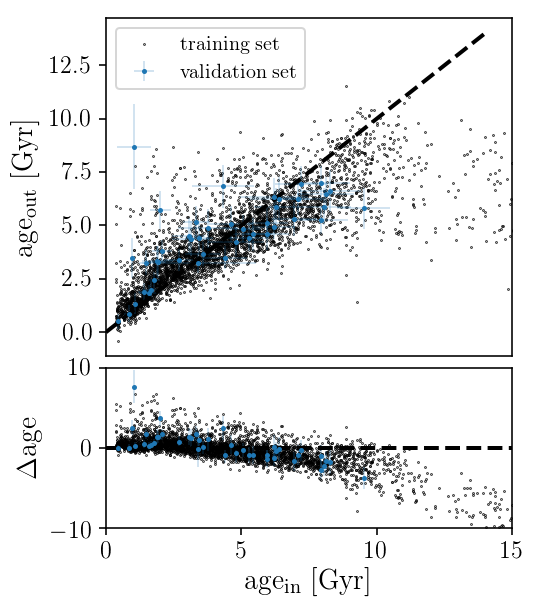

In [224]:
# plot the prediction vs the training set
i = 0
fig = plt.figure()
fig.set_size_inches(columnwidth,1.2*columnwidth)
ax = fig.add_axes([0.1,0.4,0.85,0.59])
ax1 = fig.add_axes([0.1,0.1,0.85,0.28])
ax.scatter(test_out[:,i][hi][hi_mask], hi_pred[:,i][hi_mask], s=0.1, c='Black', label=r'$\mathrm{training\ set}$',rasterized=True)
ax.errorbar(test_out[:,i][hi][hi_mask&hi_test_mask], hi_pred[:,i][hi_mask&hi_test_mask], yerr=hi_pred_std['total'][:,i][hi_mask&hi_test_mask]/2., xerr=test_outerr[:,i][hi][hi_mask&hi_test_mask], fmt='.', ms=3., label=r'$\mathrm{validation\ set}$', elinewidth=0.2,)
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)
ax.plot([0.,14.], [0.,14.], linestyle='dashed', color='Black', linewidth=2.)
ax.legend()
ax.set_ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
ax.set_xticks([])
ax1.scatter(test_out[:,0][hi][hi_mask], (hi_pred[:,0][hi_mask]-test_out[:,0][hi][hi_mask]), s=0.1, color='Black', rasterized=True)
ax1.errorbar(test_out[:,0][hi][hi_mask&hi_test_mask], (hi_pred[:,0][hi_mask&hi_test_mask]-test_out[:,0][hi][hi_mask&hi_test_mask]),yerr=np.sqrt((hi_pred_std['total'][:,i][hi_mask&hi_test_mask]/2.)**2+(test_outerr[:,i][hi][hi_mask&hi_test_mask])**2), fmt='.', ms=3., label=r'$\mathrm{validation\ set}$', elinewidth=0.2,)
ax1.axhline(0., linestyle='dashed',color='Black', linewidth=2.)
ax1.set_ylabel(r'$\Delta\mathrm{age}$')
ax1.set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax1.set_ylim(-10,10)
ax.set_xlim(0.,15.)
ax1.set_xlim(0.,15.)
fig.tight_layout()

In [225]:

dr14_lo = y[:,21] < -0.1
dr14_hi = y[:,21] > -0.1

In [234]:
dr14_lo_pred, dr14_lo_std = lo_bcnn_net.test(x[dr14_lo], x_err[dr14_lo])

Starting Dropout Variational Inference
Completed 0 of 25 Monte Carlo Dropout, 0.00s elapsed
Completed 5 of 25 Monte Carlo Dropout, 274.10s elapsed
Completed 10 of 25 Monte Carlo Dropout, 553.53s elapsed
Completed 15 of 25 Monte Carlo Dropout, 833.07s elapsed
Completed 20 of 25 Monte Carlo Dropout, 1111.44s elapsed
Completed Dropout Variational Inference, 1390.68s in total


In [235]:
dr14_hi_pred, dr14_hi_std = lo_bcnn_net.test(x[dr14_hi], x_err[dr14_hi])

Starting Dropout Variational Inference
Completed 0 of 25 Monte Carlo Dropout, 0.00s elapsed
Completed 5 of 25 Monte Carlo Dropout, 275.05s elapsed
Completed 10 of 25 Monte Carlo Dropout, 549.75s elapsed
Completed 15 of 25 Monte Carlo Dropout, 824.83s elapsed
Completed 20 of 25 Monte Carlo Dropout, 1094.42s elapsed
Completed Dropout Variational Inference, 1364.59s in total


(0.0, 13)

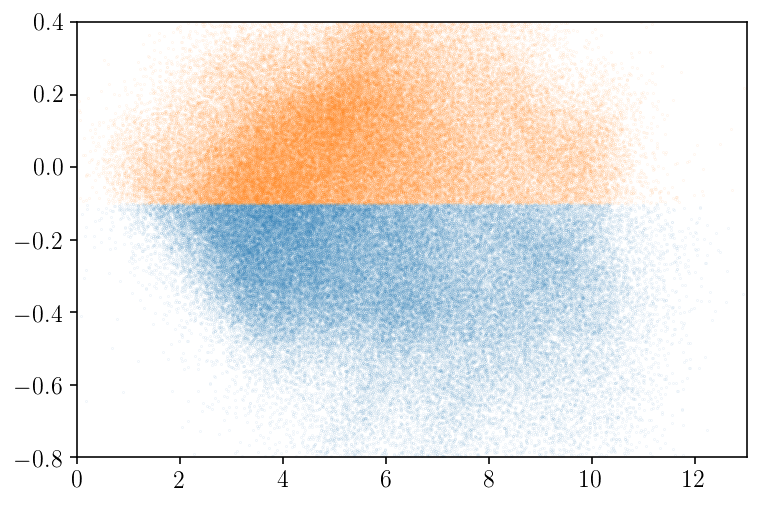

In [237]:
plt.scatter(dr14_lo_pred[:,0], y[:,21][dr14_lo], s=0.001)
plt.scatter(dr14_hi_pred[:,0], y[:,21][dr14_hi], s=0.001)


plt.ylim(-0.8,0.4)
plt.xlim(0.,13)

In [104]:
apo_ra = apodat['RA']
apo_dec = apodat['DEC']
apo_idx_1, apo_idx_2, as_sep = xmatch(ra[dr14_lo], apo_ra, colRA1=ra[dr14_lo], colDec1=dec[dr14_lo], colRA2=apo_ra, colDec2=apo_dec, swap=True)

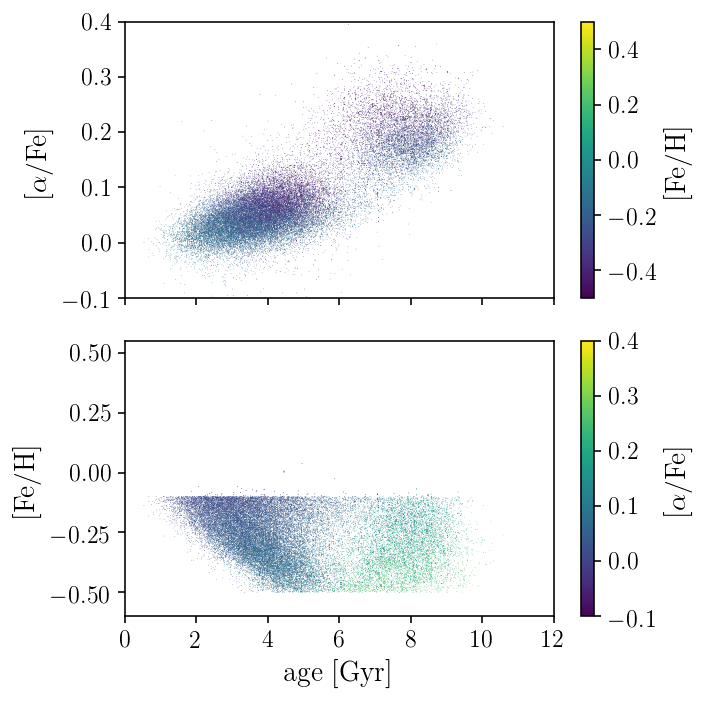

In [105]:
fig, ax = plt.subplots(2,1, sharex=True)
fig.set_size_inches(1.5*columnwidth,1.5*columnwidth)
goodmask = apodat['FE_H'][apo_idx_2] > -0.5
s = ax[0].scatter(dr14_lo_pred[:,0][apo_idx_1][goodmask], apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['FE_H'][apo_idx_2][goodmask], vmin=-0.5,vmax=0.5, rasterized=True)

#plt.errorbar(xbincent,ybincent,yerr=ybin_err, xerr=xbin_err)
ax[0].set_ylim(-0.1,0.4)
ax[0].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax[0])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])


s = ax[1].scatter(dr14_lo_pred[:,0][apo_idx_1][goodmask], apodat['FE_H'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], vmin=-0.1,vmax=0.4, rasterized=True)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['FE_H'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ax[1].set_ylim(-0.6,0.55)
ax[1].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[\alpha/Fe]}$', ax=ax[1])
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[1].set_xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

#plt.savefig('../plots/astroNNBayes_age_feh_afe.png', format='png', dpi=300)
#plt.savefig('../plots/astroNNBayes_age_feh_afe.pdf', format='pdf', dpi=300)

In [107]:
apo_ra = apodat['RA']
apo_dec = apodat['DEC']
apo_idx_1, apo_idx_2, as_sep = xmatch(ra[dr14_hi], apo_ra, colRA1=ra[dr14_hi], colDec1=dec[dr14_hi], colRA2=apo_ra, colDec2=apo_dec, swap=True)

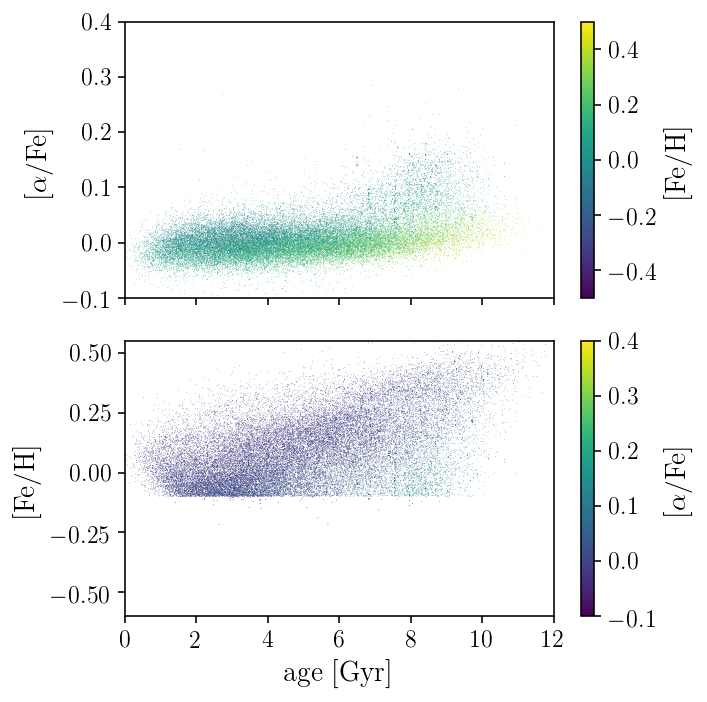

In [108]:
fig, ax = plt.subplots(2,1, sharex=True)
fig.set_size_inches(1.5*columnwidth,1.5*columnwidth)
goodmask = apodat['FE_H'][apo_idx_2] > -0.5
s = ax[0].scatter(dr14_hi_pred[:,0][apo_idx_1][goodmask], apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['FE_H'][apo_idx_2][goodmask], vmin=-0.5,vmax=0.5, rasterized=True)

#plt.errorbar(xbincent,ybincent,yerr=ybin_err, xerr=xbin_err)
ax[0].set_ylim(-0.1,0.4)
ax[0].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax[0])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])


s = ax[1].scatter(dr14_hi_pred[:,0][apo_idx_1][goodmask], apodat['FE_H'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], vmin=-0.1,vmax=0.4, rasterized=True)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['FE_H'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ax[1].set_ylim(-0.6,0.55)
ax[1].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[\alpha/Fe]}$', ax=ax[1])
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[1].set_xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

#plt.savefig('../plots/astroNNBayes_age_feh_afe.png', format='png', dpi=300)
#plt.savefig('../plots/astroNNBayes_age_feh_afe.pdf', format='pdf', dpi=300)

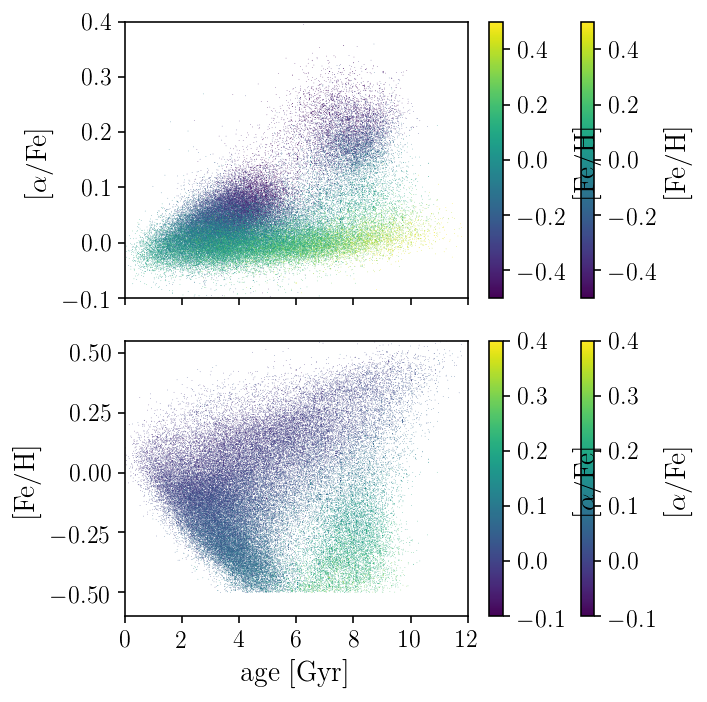

In [109]:
apo_ra = apodat['RA']
apo_dec = apodat['DEC']
apo_idx_1, apo_idx_2, as_sep = xmatch(ra[dr14_lo], apo_ra, colRA1=ra[dr14_lo], colDec1=dec[dr14_lo], colRA2=apo_ra, colDec2=apo_dec, swap=True)

fig, ax = plt.subplots(2,1, sharex=True)
fig.set_size_inches(1.5*columnwidth,1.5*columnwidth)
goodmask = apodat['FE_H'][apo_idx_2] > -0.5
s = ax[0].scatter(dr14_lo_pred[:,0][apo_idx_1][goodmask], apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['FE_H'][apo_idx_2][goodmask], vmin=-0.5,vmax=0.5, rasterized=True)

#plt.errorbar(xbincent,ybincent,yerr=ybin_err, xerr=xbin_err)
ax[0].set_ylim(-0.1,0.4)
ax[0].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax[0])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])


s = ax[1].scatter(dr14_lo_pred[:,0][apo_idx_1][goodmask], apodat['FE_H'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], vmin=-0.1,vmax=0.4, rasterized=True)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['FE_H'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ax[1].set_ylim(-0.6,0.55)
ax[1].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[\alpha/Fe]}$', ax=ax[1])
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[1].set_xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

apo_ra = apodat['RA']
apo_dec = apodat['DEC']
apo_idx_1, apo_idx_2, as_sep = xmatch(ra[dr14_hi], apo_ra, colRA1=ra[dr14_hi], colDec1=dec[dr14_hi], colRA2=apo_ra, colDec2=apo_dec, swap=True)

goodmask = apodat['FE_H'][apo_idx_2] > -0.5
s = ax[0].scatter(dr14_hi_pred[:,0][apo_idx_1][goodmask], apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['FE_H'][apo_idx_2][goodmask], vmin=-0.5,vmax=0.5, rasterized=True)

#plt.errorbar(xbincent,ybincent,yerr=ybin_err, xerr=xbin_err)
ax[0].set_ylim(-0.1,0.4)
ax[0].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax[0])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])


s = ax[1].scatter(dr14_hi_pred[:,0][apo_idx_1][goodmask], apodat['FE_H'][apo_idx_2][goodmask], s=0.1, lw=0., c=apodat['AVG_ALPHAFE'][apo_idx_2][goodmask], vmin=-0.1,vmax=0.4, rasterized=True)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['FE_H'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ax[1].set_ylim(-0.6,0.55)
ax[1].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[\alpha/Fe]}$', ax=ax[1])
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[1].set_xticks([0.,2.,4.,6.,8.,10.,12.])

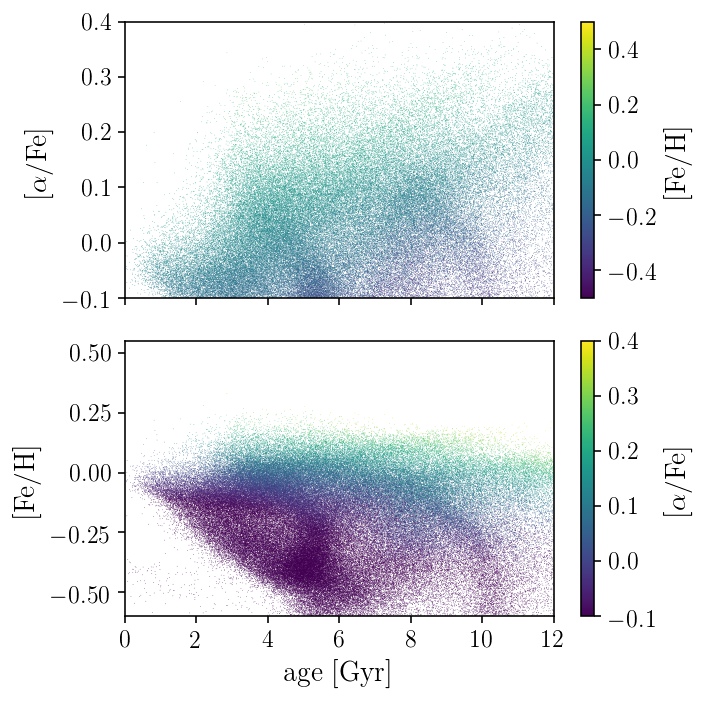

In [111]:

fig, ax = plt.subplots(2,1, sharex=True)
fig.set_size_inches(1.5*columnwidth,1.5*columnwidth)
goodmask = apodat['FE_H'][apo_idx_2] > -0.5
s = ax[0].scatter(dr14_lo_pred[:,0], dr14_lo_pred[:,10], s=0.1, lw=0., c=dr14_lo_pred[:,22], vmin=-0.5,vmax=0.5, rasterized=True)

#plt.errorbar(xbincent,ybincent,yerr=ybin_err, xerr=xbin_err)
ax[0].set_ylim(-0.1,0.4)
ax[0].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax[0])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])


s = ax[1].scatter(dr14_lo_pred[:,0], dr14_lo_pred[:,22], s=0.1, lw=0., c=dr14_lo_pred[:,10], vmin=-0.1,vmax=0.4, rasterized=True)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['FE_H'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ax[1].set_ylim(-0.6,0.55)
ax[1].set_xlim(0.,12.)
plt.colorbar(s,label=r'$\mathrm{[\alpha/Fe]}$', ax=ax[1])
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[1].set_xticks([0.,2.,4.,6.,8.,10.,12.])
fig.tight_layout()

goodmask = apodat['FE_H'][apo_idx_2] > -0.5
s = ax[0].scatter(dr14_hi_pred[:,0], dr14_hi_pred[:,10], s=0.1, lw=0., c=dr14_hi_pred[:,22], vmin=-0.5,vmax=0.5, rasterized=True)

#plt.errorbar(xbincent,ybincent,yerr=ybin_err, xerr=xbin_err)
ax[0].set_ylim(-0.1,0.4)
ax[0].set_xlim(0.,12.)
#plt.colorbar(s,label=r'$\mathrm{[Fe/H]}$', ax=ax[0])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
#ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[0].set_xticks([0.,2.,4.,6.,8.,10.,12.])


s = ax[1].scatter(dr14_hi_pred[:,0], dr14_hi_pred[:,22], s=0.1, lw=0., c=dr14_hi_pred[:,10], vmin=-0.1,vmax=0.4, rasterized=True)
#plt.errorbar(np.ones(len(dr14_pred[:,0][apo_idx_1][goodmask]))*-2, apodat['FE_H'][apo_idx_2][goodmask], xerr=dr14_std['total'][:,0][apo_idx_1][goodmask]/2., ecolor='Black', fmt='None', errorevery=700)
ax[1].set_ylim(-0.6,0.55)
ax[1].set_xlim(0.,12.)
#plt.colorbar(s,label=r'$\mathrm{[\alpha/Fe]}$', ax=ax[1])
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')

ax[1].set_xticks([0.,2.,4.,6.,8.,10.,12.])

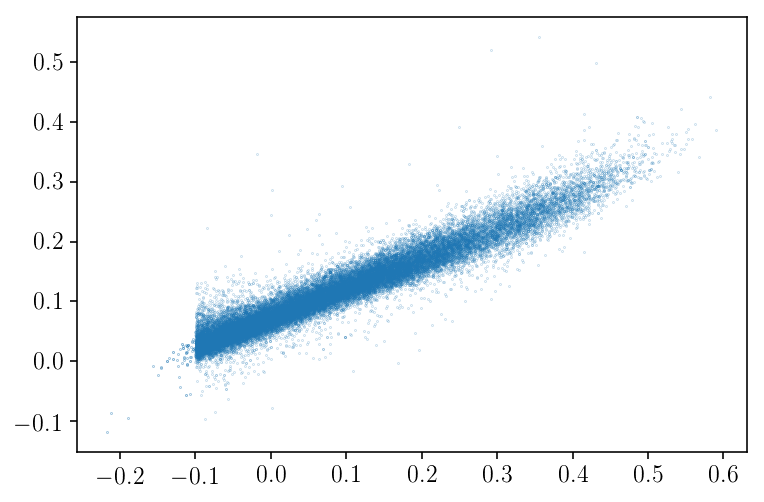

In [118]:
plt.scatter(apodat['FE_H'][apo_idx_2][goodmask],apodat['FE_H'][apo_idx_2][goodmask]-dr14_hi_pred[:,22][apo_idx_1][goodmask], s=0.01)

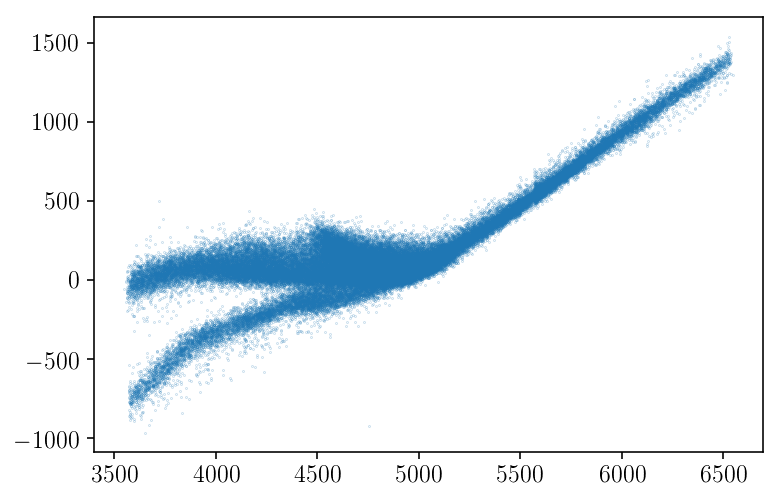

In [133]:
plt.scatter(y[:,0][dr14_hi],y[:,0][dr14_hi]-dr14_hi_pred[:,1], s=0.01)

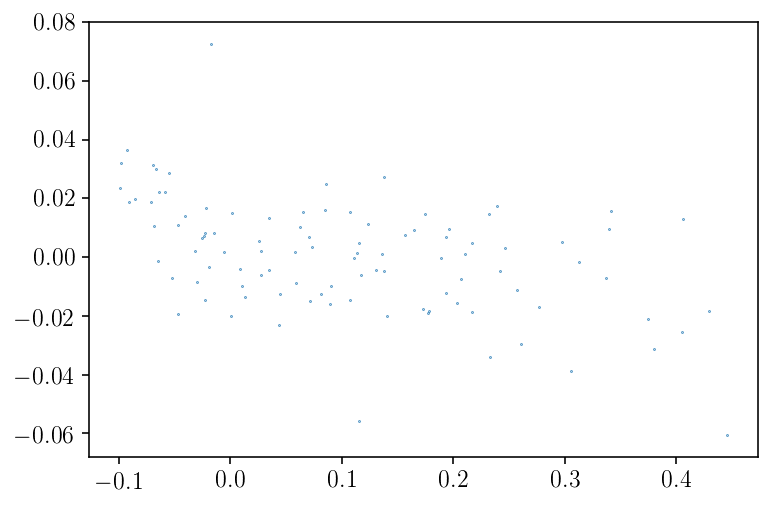

In [131]:
plt.scatter(test_out[:,22][hi][hi_test_mask&hi_mask], hi_pred[:,22][hi_test_mask&hi_mask]-test_out[:,22][hi][hi_test_mask&hi_mask], s=0.1)

(array([0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 3.800e+01, 4.090e+02,
        3.070e+03, 2.246e+03, 3.000e+00, 0.000e+00]),
 array([2000., 2400., 2800., 3200., 3600., 4000., 4400., 4800., 5200.,
        5600., 6000.]),
 <a list of 10 Patch objects>)

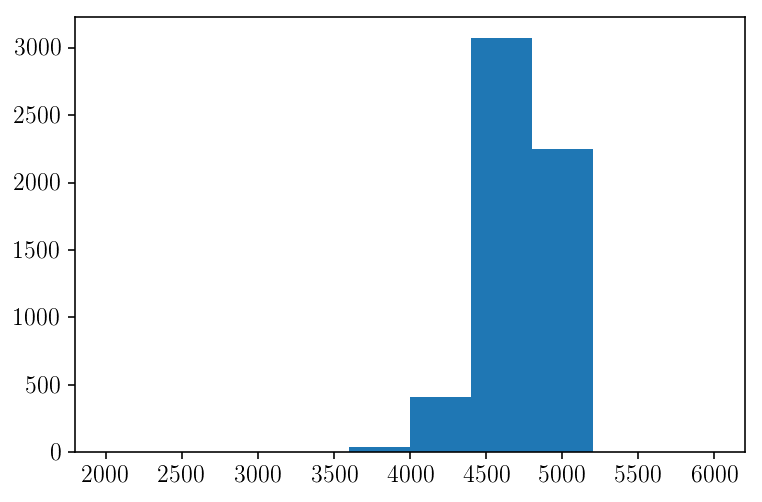

In [137]:
plt.hist(test_out[:,1], range=[2000,6000])

(0.0, 5.0)

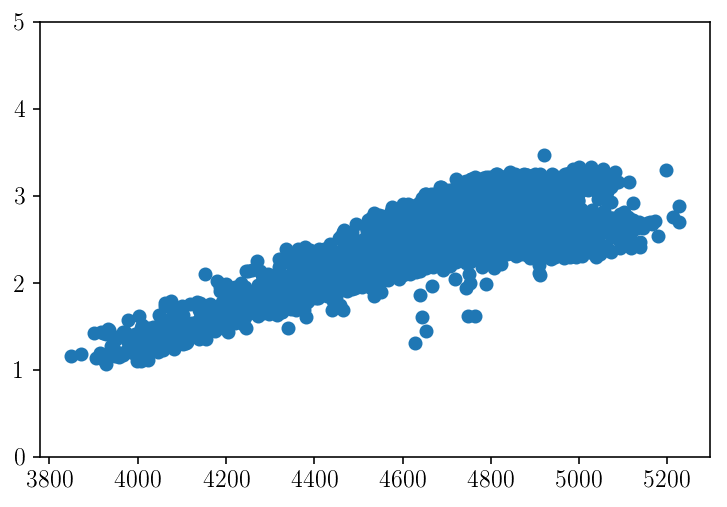

In [139]:
plt.scatter(test_out[:,1], test_out[:,2])
plt.ylim(0.,5.)

(-1.0, 0.5)

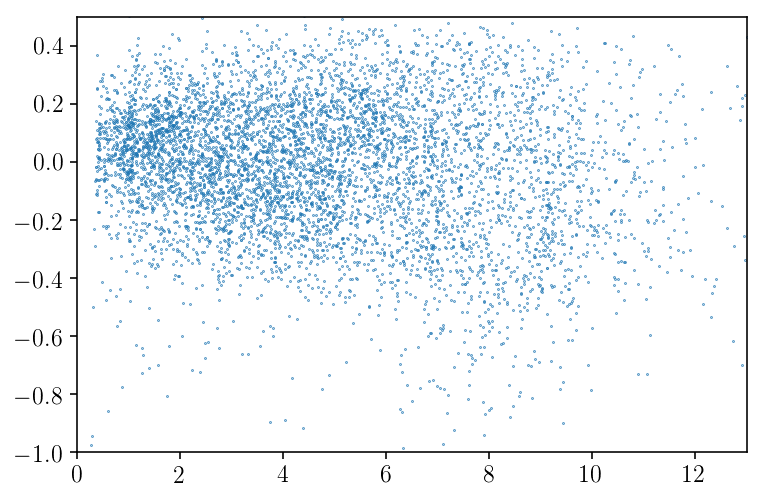

In [161]:
plt.scatter(ndata['APOKASC2_AGE'], ndata['FE_H'], s=0.1)
plt.xlim(0.,13.)
plt.ylim(-1.,0.5)

(2000, 7500)

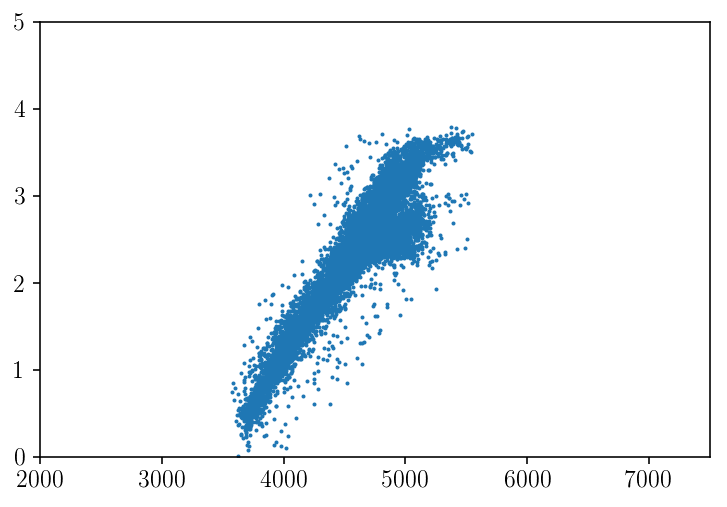

In [196]:
plt.scatter(ndata['TEFF_COR'], ndata['LOGG_COR'], s=1.)
plt.ylim(0.,5)
plt.xlim(2000,7500)

(2000, 7500)

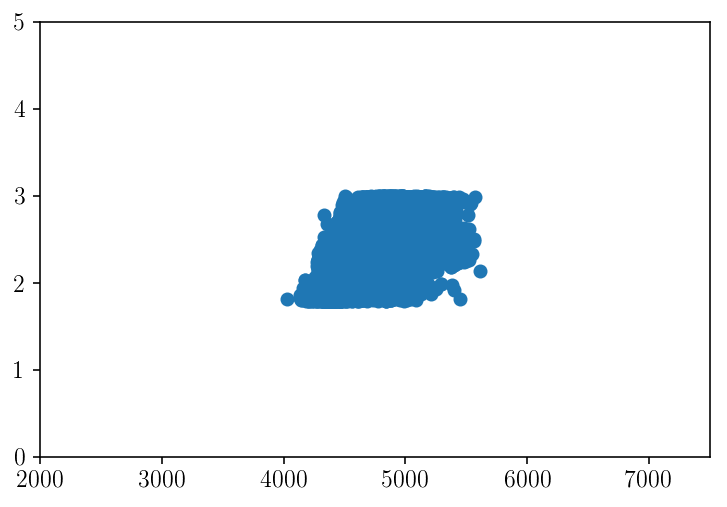

In [197]:
plt.scatter(apodat['TEFF'], apodat['LOGG'])
plt.ylim(0.,5)
plt.xlim(2000,7500)

# Andreas Ages

In [38]:
# Read in APOKASC
path = '/gal/astjmack/apogee/catalogues/APOKASC_cat_v4.4.2.fits'
apokasc = fits.open(path)
data = apokasc[1].data

dt = data.dtype
dt = dt.descr # this is now a modifiable list, can't modify numpy.dtype
# change the type of the first col:
dt[0] = (dt[0][0], 'int64')
dt = np.dtype(dt)
# data = numpy.array(data, dtype=dt) # option 1
data = data.astype(dt)

path = '../sav/param_in_June202018_143033.in.mo'
test = np.genfromtxt(path,dtype=None, names=True)

APOKASC_tab = Table(data=data)
ages_tab = Table(data=test)
#join victor with APOKASC
ages_tab.rename_column('Id', 'KEPLER_ID')
tab = join(APOKASC_tab, ages_tab, keys='KEPLER_ID', uniq_col_name='{col_name}{table_name}', table_names=['','2'])
dat = tab.as_array()

/home/astjmack/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  from ipykernel import kernelapp as app



(-0.5, 0.5)

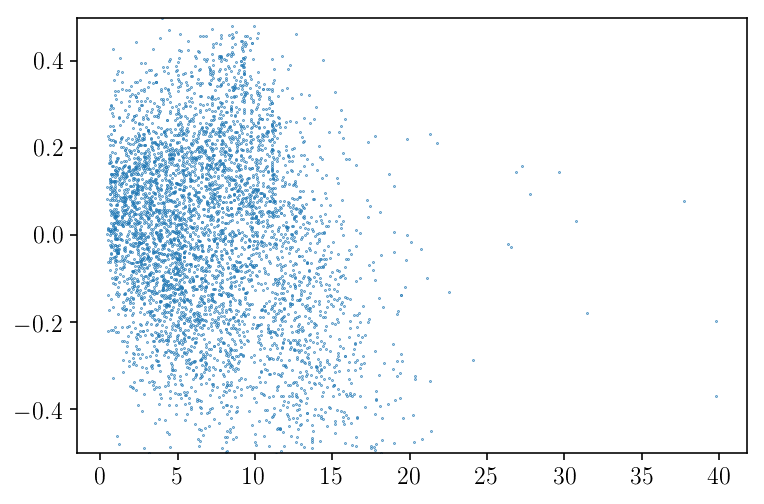

In [40]:
mask = (dat['APOKASC2_NU_MAX'] > 20) & (dat['age'] > 0.)
plt.scatter(dat['age'][mask], dat['FE_H'][mask], s=0.1)

plt.ylim(-0.5,0.5)

In [41]:


from astroNN.datasets import xmatch
ra = loader.load_entry('RA')
dec = loader.load_entry('DEC')
ra_age = dat['RA'][mask]
dec_age = dat['DEC'][mask]
idx_1, idx_2, sep = xmatch(ra, ra_age, colRA1=ra, colDec1=dec, colRA2=ra_age, colDec2=dec_age, swap=True)


In [42]:
ages = dat['age'][mask][idx_2]
age_error = (dat['age_68U']-dat['age_68L'])[mask][idx_2]/2.
test_spec = x[idx_1]
test_errspec = x_err[idx_1]

test_out = y[idx_1]
test_outerr  = y_err[idx_1]

test_out = np.append(ages.reshape(len(ages),1),test_out, axis=1)
test_outerr = np.append(age_error.reshape(len(ages),1),test_outerr, axis=1)

print(np.shape(test_out))

(4805, 26)


In [43]:
from astroNN.models import ApogeeBCNN
# And then create an instance of Bayesian Convolutional Neural Network class
bcnn_net = ApogeeBCNN()

# You don't have to specify the task because its 'regression' by default. But if you are doing classification. you can set task='classification'
bcnn_net.task = 'regression'
bcnn_net.labels_shape=26
bcnn_net.num_hidden = [128,64]
bcnn_net.batch_size = 32

# Set max_epochs to 10 for a quick result. You should train more epochs normally, especially with dropout
bcnn_net.max_epochs = 60
#bcnn_net.train(x_train, y_train, x_err, y_err)

(array([1706., 3042.,   53.,    4.,    0.,    0.,    0.,    0.,    0.,
           0.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <a list of 10 Patch objects>)

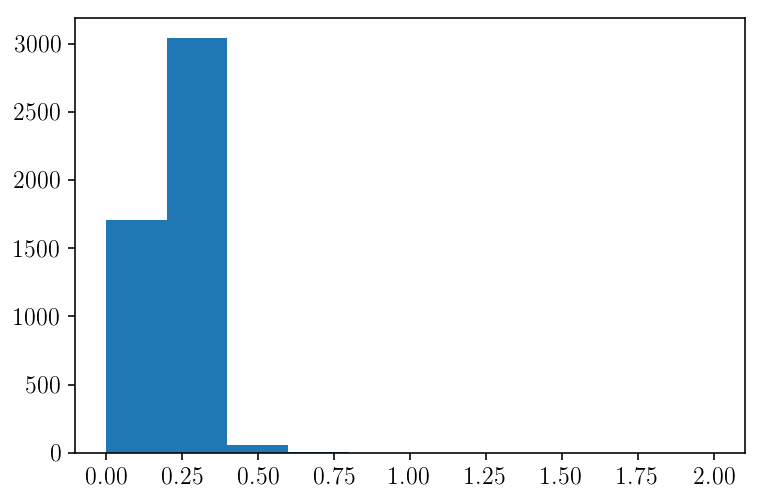

In [44]:
plt.hist(age_error/ages, range=[0.,2.])

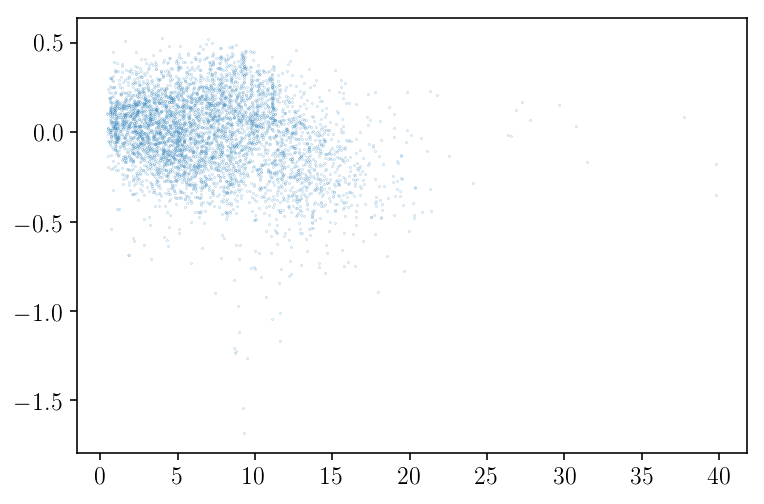

In [45]:
plt.scatter(test_out[:,0], test_out[:,3], s=0.01)

In [46]:
mask = np.all(np.isfinite(test_out), axis=1) & np.all(np.isfinite(test_outerr), axis=1) & (test_out[:,3] > -0.5) & (test_out[:,0] != -9999.)
sum(mask)

4708

In [47]:
test_inds = np.random.choice(np.arange(0,len(test_spec)),size=500, replace=False)
test_mask = np.zeros(len(test_spec), dtype=bool)
test_mask[test_inds] = 1.
print(sum(test_mask))

500


In [48]:
bcnn_net.train(test_spec[~test_mask&mask],test_out[~test_mask&mask], test_errspec[~test_mask&mask], test_outerr[~test_mask&mask]) #, test_errspec[mask],out_err[mask])

Number of Training Data: 3795, Number of Validation Data: 421
====Message from Normalizer====
You selected mode: 3
Featurewise Center: True
Datawise Center: False
Featurewise std Center: False
Datawise std Center: False
====Message ends====
====Message from Normalizer====
You selected mode: 2
Featurewise Center: True
Datawise Center: False
Featurewise std Center: True
Datawise std Center: False
====Message ends====
/home/astjmack/anaconda3/lib/python3.6/site-packages/astroNN-1.1.dev0-py3.6.egg/astroNN/nn/utilities/normalizer.py:110: RuntimeWarning: divide by zero encountered in true_divide
  data_array /= self.std_labels

Epoch 1/60
 - 14s - loss: 0.2458 - output_loss: 0.2458 - variance_output_loss: 0.2458 - output_mean_absolute_error: 0.6281 - output_mean_error: 0.0533 - val_loss: -1.0831e-01 - val_output_loss: -1.0833e-01 - val_variance_output_loss: -1.0833e-01 - val_output_mean_absolute_error: 0.4444 - val_output_mean_error: 0.0658
Epoch 2/60
 - 12s - loss: -1.9534e-01 - output_loss

Epoch 24/60
 - 5s - loss: -6.3732e-01 - output_loss: -6.3733e-01 - variance_output_loss: -6.3733e-01 - output_mean_absolute_error: 0.2791 - output_mean_error: 0.0075 - val_loss: -6.1826e-01 - val_output_loss: -6.1828e-01 - val_variance_output_loss: -6.1828e-01 - val_output_mean_absolute_error: 0.2849 - val_output_mean_error: 8.6074e-04
Epoch 25/60
 - 5s - loss: -6.3756e-01 - output_loss: -6.3758e-01 - variance_output_loss: -6.3758e-01 - output_mean_absolute_error: 0.2798 - output_mean_error: 0.0102 - val_loss: -6.2816e-01 - val_output_loss: -6.2817e-01 - val_variance_output_loss: -6.2817e-01 - val_output_mean_absolute_error: 0.2824 - val_output_mean_error: 0.0343

Epoch 00025: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
Epoch 26/60
 - 7s - loss: -6.4684e-01 - output_loss: -6.4686e-01 - variance_output_loss: -6.4686e-01 - output_mean_absolute_error: 0.2780 - output_mean_error: 0.0077 - val_loss: -6.5594e-01 - val_output_loss: -6.5596e-01 - val_variance_output_loss:

Epoch 47/60
 - 11s - loss: -6.5476e-01 - output_loss: -6.5477e-01 - variance_output_loss: -6.5477e-01 - output_mean_absolute_error: 0.2756 - output_mean_error: 0.0081 - val_loss: -6.5681e-01 - val_output_loss: -6.5682e-01 - val_variance_output_loss: -6.5682e-01 - val_output_mean_absolute_error: 0.2774 - val_output_mean_error: -3.3919e-04

Epoch 00047: ReduceLROnPlateau reducing learning rate to 1.2207031829802872e-07.
Epoch 48/60
 - 11s - loss: -6.5158e-01 - output_loss: -6.5160e-01 - variance_output_loss: -6.5160e-01 - output_mean_absolute_error: 0.2772 - output_mean_error: 0.0055 - val_loss: -6.4186e-01 - val_output_loss: -6.4187e-01 - val_variance_output_loss: -6.4187e-01 - val_output_mean_absolute_error: 0.2761 - val_output_mean_error: 0.0061
Epoch 49/60
 - 10s - loss: -6.5624e-01 - output_loss: -6.5625e-01 - variance_output_loss: -6.5625e-01 - output_mean_absolute_error: 0.2756 - output_mean_error: 0.0077 - val_loss: -6.5790e-01 - val_output_loss: -6.5792e-01 - val_variance_output

In [49]:
#generate predictions from trained model (save to file)
pred, pred_std = bcnn_net.test(test_spec, test_errspec)

with open('../sav/astroNN_Bayes_APOKASC_predictions_andrea.npy', 'wb') as f:
    np.save(f, pred)
    np.save(f, pred_std)

/home/astjmack/anaconda3/lib/python3.6/site-packages/astroNN-1.1.dev0-py3.6.egg/astroNN/models/BayesianCNNBase.py:344: UserWarning: You are using CPU version Tensorflow, doing 100 times Monte Carlo Inference can potentially be very slow! 
 A possible fix is to decrease the mc_num parameter of the model to do less MC Inference 
This is just a warning, and will not shown if mc_num < 25 on CPU
  warnings.warn(f'You are using CPU version Tensorflow, doing {self.mc_num} times Monte Carlo Inference can '

Starting Dropout Variational Inference
Completed Dropout Variational Inference with 100 forward passes, 158.36s elapsed


(0.0, 14.0)

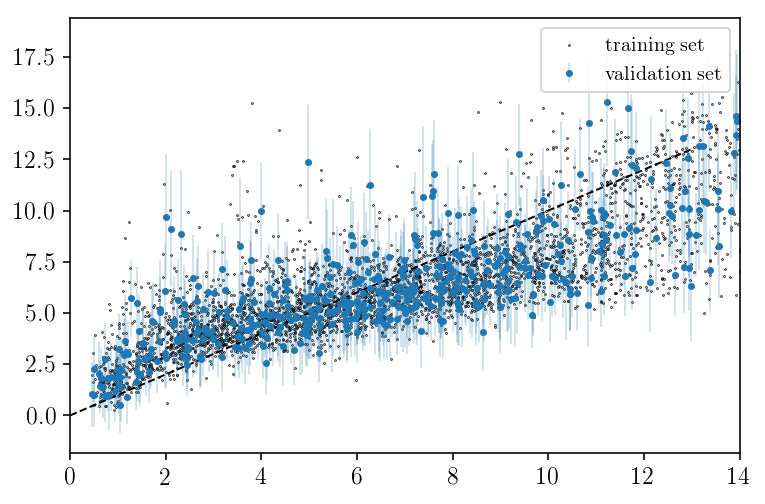

In [50]:
i = 0
plt.scatter(test_out[:,i][mask], pred[:,i][mask], s=0.1, c='Black', label=r'$\mathrm{training\ set}$')
plt.errorbar(test_out[:,i][mask&test_mask], pred[:,i][mask&test_mask], yerr=pred_std['total'][:,i][mask&test_mask], fmt='.', ms=5., label=r'$\mathrm{validation\ set}$', elinewidth=0.2)
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)
plt.plot(np.linspace(0.,13.,10),np.linspace(0.,13.,10), color='Black', linestyle='dashed')
plt.legend()
plt.xlim(0.,14.)

/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



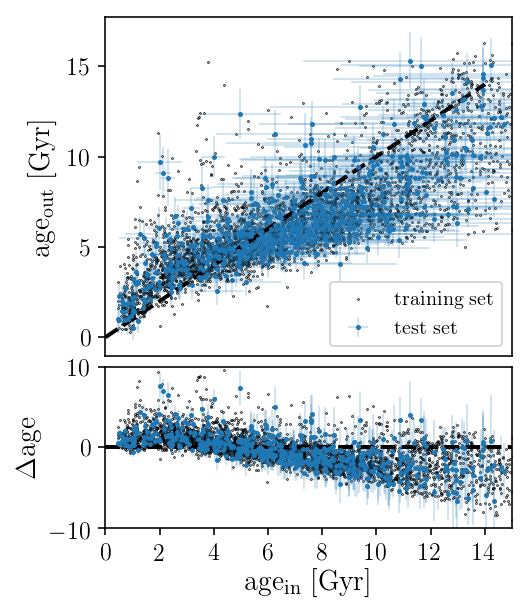

In [51]:
# plot the prediction vs the training set
fig = plt.figure()
fig.set_size_inches(columnwidth,1.2*columnwidth)
ax = fig.add_axes([0.1,0.4,0.85,0.59])
ax1 = fig.add_axes([0.1,0.1,0.85,0.28])
ax.scatter(test_out[:,i][mask], pred[:,i][mask], s=0.1, c='Black', label=r'$\mathrm{training\ set}$',rasterized=True)
ax.errorbar(test_out[:,i][mask&test_mask], pred[:,i][mask&test_mask], yerr=pred_std['total'][:,i][mask&test_mask]/2., xerr=test_outerr[:,i][mask&test_mask], fmt='.', ms=3., label=r'$\mathrm{test\ set}$', elinewidth=0.2,)
#plt.errorbar(10**(out[:,3][mask]), 10**(pred[:,3]), yerr=10**(pred_std['total'][:,3]), fmt='none',errorevery=30)
ax.plot([0.,14.], [0.,14.], linestyle='dashed', color='Black', linewidth=2.)
ax.legend()
ax.set_ylabel(r'$\mathrm{age_{out}\ [Gyr]}$')
ax.set_xticks([])
ax1.scatter(test_out[:,0][mask], (pred[:,0][mask]-test_out[:,0][mask]), s=0.1, color='Black', rasterized=True)
ax1.errorbar(test_out[:,0][mask&test_mask], (pred[:,0][mask&test_mask]-test_out[:,0][mask&test_mask]),yerr=np.sqrt((pred_std['total'][:,i][mask&test_mask]/2.)**2+(test_outerr[:,i][mask&test_mask])**2), fmt='.', ms=3., label=r'$\mathrm{test\ set}$', elinewidth=0.2,)
ax1.axhline(0., linestyle='dashed',color='Black', linewidth=2.)
ax1.set_ylabel(r'$\Delta\mathrm{age}$')
ax1.set_xlabel(r'$\mathrm{age_{in}\ [Gyr]}$')
ax1.set_ylim(-10,10)
fig.tight_layout()
ax.set_xlim(0.,15,)
ax1.set_xlim(0.,15.)
ax1.set_xticks([0.,2.,4.,6.,8.,10.,12.,14.])
plt.savefig('../plots/astroNNbayes_agein_ageout_andrea.pdf', format='pdf', dpi=400, bbox_inches='tight')
plt.savefig('../plots/astroNNbayes_agein_ageout_andrea.png', format='png', dpi=400,  bbox_inches='tight')




In [ ]:
dr14_pred, dr14_std = bcnn_net.test(x, x_err)

/home/astjmack/anaconda3/lib/python3.6/site-packages/astroNN-1.1.dev0-py3.6.egg/astroNN/models/BayesianCNNBase.py:344: UserWarning: You are using CPU version Tensorflow, doing 100 times Monte Carlo Inference can potentially be very slow! 
 A possible fix is to decrease the mc_num parameter of the model to do less MC Inference 
This is just a warning, and will not shown if mc_num < 25 on CPU
  warnings.warn(f'You are using CPU version Tensorflow, doing {self.mc_num} times Monte Carlo Inference can '

Starting Dropout Variational Inference
